# **1. Introduction**



**Project Name :  Steel Plate Defect - Exploratory Data Analysis Report**

**Author       : Tasya Amalia**

------------------------




**Problem Statement**

Penjabaran masalah akan dijelaskan dengan Metode STAR, sebagai berikut:

**1. Situation (Situasi):**

Perusahaan manufaktur baja memiliki 2 jenis baja yang digunakan dalam produksi, yaitu tipe A300 dan A400. Namun, terdapat tantangan dalam menjaga kualitas baja karena sering kali ditemukan kecacatan pada produk baja. Kecacatan ini berdampak pada kualitas dan biaya produksi. Oleh karena itu, perusahaan perlu memahami fitur-fitur yang berhubungan dengan kecacatan dan mengelompokkan jenis kecacatan untuk mengelola kualitas lebih efektif.lebih baik.

**2. Task (Tugas):**

Tugas yang saya lakukan adalah melakukan eksplorasi data untuk memahami distribusi fitur, jenis tipe baja dan jenis kecacatan baca , serta mengidentifikasi pola dan hubungan antara fitur dengan jenis kecacatan. Berdasarkan hasil eksplorasi ini, tugas selanjutnya adalah melakukan segmentasi atau pengelompokan (clustering) terhadap jenis baja dan jenis kecacatan  baja.

**3. Action (Aksi):**

- Univariate Analysis:
    - Melakukan statistik deskriptif untuk menganalisis distribusi setiap fitur dalam dataset.
    - Membuat visualisasi distribusi fitur, jenis baja untuk memahami tipe pelat baja yang paling banyak digunakan dan jenis kecacatan baja yang paling banyak dialami oleh baja.

- Bivariate Analysis:
    - Menganalisis hubungan antara tipe baja dengan jenis kecacatan menggunakan teknik korelasi.
    - Melihat apakah terdapat hubungan antara setiap fitur dengan jenis kecacatan baja, yang akan membantu dalam memahami karakteristik yang mempengaruhi kualitas baja.

- Clustering:
    - Menggunakan algoritma clustering (K-Means) untuk mengelompokkan data berdasarkan fitur-fitur yang ada.
    - Mengidentifikasi karakteristik setiap cluster.

**4. Result (Hasil):**

Hasil clustering menunjukkan dua cluster utama dengan karakteristik yang berbeda. Analisis juga mengidentifikasi fitur  yang berhubungan dengan kecacatan. 



# **2. Import Libraries**

In [3]:
# Library Data Manipulation
import pandas as pd
import numpy as np

# Library Data Visualization
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
import matplotlib.cm as cm
from yellowbrick.cluster import SilhouetteVisualizer

# Library Preprocessing data
from sklearn.model_selection import train_test_split

# Handling Outlier
from feature_engine.outliers import Winsorizer

# Correlation
from scipy import stats
from scipy.stats import chi2_contingency
from scipy.stats import f_oneway
from scipy.stats import pearsonr, spearmanr

# Library Machine Learning Model
from sklearn.preprocessing import RobustScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score,silhouette_samples, davies_bouldin_score
from sklearn.neighbors import NearestNeighbors
from random import sample
from numpy.random import uniform
from math import isnan

# For Save Model
import pickle
import joblib
import json


import warnings
warnings.filterwarnings('ignore')




**Penjelasan:**

Sebelum memulai project ini, perlu dilakukan mengimport semua library yang diperlukan untuk memfasilitasi pengerjaan project. Setiap library memiliki fungsi nya masing-masing yang terdiri untuk manipulasi data, visualisasi, pembuatan model, dll.

# **3. Data Loading**

### *3.1 Menampilkan data teratas*

In [4]:
df = pd.read_csv('test.csv')

df.head()

,id,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,...,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults
0,1,42,50,270900,270944,267,17,44,24220,76,...,0.8182,-0.2913,0.5822,1,0,0,0,0,0,0
1,2,645,651,2538079,2538108,108,10,30,11397,84,...,0.7931,-0.1756,0.2984,1,0,0,0,0,0,0
2,3,829,835,1553913,1553931,71,8,19,7972,99,...,0.6667,-0.1228,0.2150,1,0,0,0,0,0,0
3,4,853,860,369370,369415,176,13,45,18996,99,...,0.8444,-0.1568,0.5212,1,0,0,0,0,0,0
4,5,1289,1306,498078,498335,2409,60,260,246930,37,...,0.9338,-0.1992,1.0000,1,0,0,0,0,0,0


**Penjelasan:**

- Kode `pd.read_csv` digunakan untuk membaca file CSV yang bernama `'test.csv'` yang akan dimuat ke dalam DataFrame yang selanjutkan akan dilakukan manipulasi dan analisis data lebih lanjut. 

- Menggunakan pandas `.head()`, dapat menampilkan  data teratas dari dataset. Sekilas, kolomnya terdiri dari data numerik. Namun, perlu dilakukan explore data lebih lanjut untuk mengetahui tipe data setiap kolom.


### *3.2 Menampilkan ringkasan informasi*

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1941 entries, 0 to 1940
Data columns (total 35 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     1941 non-null   int64  
 1   X_Minimum              1941 non-null   int64  
 2   X_Maximum              1941 non-null   int64  
 3   Y_Minimum              1941 non-null   int64  
 4   Y_Maximum              1941 non-null   int64  
 5   Pixels_Areas           1941 non-null   int64  
 6   X_Perimeter            1941 non-null   int64  
 7   Y_Perimeter            1941 non-null   int64  
 8   Sum_of_Luminosity      1941 non-null   int64  
 9   Minimum_of_Luminosity  1941 non-null   int64  
 10  Maximum_of_Luminosity  1941 non-null   int64  
 11  Length_of_Conveyer     1941 non-null   int64  
 12  TypeOfSteel_A300       1941 non-null   int64  
 13  TypeOfSteel_A400       1941 non-null   int64  
 14  Steel_Plate_Thickness  1941 non-null   int64  
 15  Edge

**_Penjelasan_**

-  Menggunakan pandas .info() dapat memperoleh ringkasan informasi dari dataset ini, termasuk informasi jumlah baris dan kolom serta tipe data setiap kolom.

- Berdasarkan hasil tersebut, diketahui bahwa data ini terdiri dari `1941 baris dan 35 kolom`.

- Tipe data ini terdiri dari `13 float dan 22 integer`

- Pada dataset ini diketahui bahwa tidak ada kolom yang memiliki `missing value`, namun akan dilakukan explorasi data lainnya untuk mengetahui apakah ada data duplikat atau tidak.

### *3.3 Cek Data Duplikat*

In [6]:
print(f'Jumlah data duplikat: {df.duplicated().sum()}')

Jumlah data duplikat: 0


**Penjelasan:**

Berdasarkan hasil tersebut diketahui pada dataset ini tidak memiliki data duplikat.

### *3.3 Cek Missing Value*

In [7]:
print(f'Jumlah Missing Values: {df.isnull().sum()}')

Jumlah Missing Values: id                       0
X_Minimum                0
X_Maximum                0
Y_Minimum                0
Y_Maximum                0
Pixels_Areas             0
X_Perimeter              0
Y_Perimeter              0
Sum_of_Luminosity        0
Minimum_of_Luminosity    0
Maximum_of_Luminosity    0
Length_of_Conveyer       0
TypeOfSteel_A300         0
TypeOfSteel_A400         0
Steel_Plate_Thickness    0
Edges_Index              0
Empty_Index              0
Square_Index             0
Outside_X_Index          0
Edges_X_Index            0
Edges_Y_Index            0
Outside_Global_Index     0
LogOfAreas               0
Log_X_Index              0
Log_Y_Index              0
Orientation_Index        0
Luminosity_Index         0
SigmoidOfAreas           0
Pastry                   0
Z_Scratch                0
K_Scatch                 0
Stains                   0
Dirtiness                0
Bumps                    0
Other_Faults             0
dtype: int64


**Penjelasan:**

Berdasarkan hasil tersebut diketahui pada dataset ini tidak memiliki missing value.

### *3.4 Drop kolom 'ID'*

In [8]:
df.drop(['id'], axis=1, inplace= True)
df

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,...,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults
0,42,50,270900,270944,267,17,44,24220,76,108,...,0.8182,-0.2913,0.5822,1,0,0,0,0,0,0
1,645,651,2538079,2538108,108,10,30,11397,84,123,...,0.7931,-0.1756,0.2984,1,0,0,0,0,0,0
2,829,835,1553913,1553931,71,8,19,7972,99,125,...,0.6667,-0.1228,0.2150,1,0,0,0,0,0,0
3,853,860,369370,369415,176,13,45,18996,99,126,...,0.8444,-0.1568,0.5212,1,0,0,0,0,0,0
4,1289,1306,498078,498335,2409,60,260,246930,37,126,...,0.9338,-0.1992,1.0000,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1936,249,277,325780,325796,273,54,22,35033,119,141,...,-0.4286,0.0026,0.7254,0,0,0,0,0,0,1
1937,144,175,340581,340598,287,44,24,34599,112,133,...,-0.4516,-0.0582,0.8173,0,0,0,0,0,0,1
1938,145,174,386779,386794,292,40,22,37572,120,140,...,-0.4828,0.0052,0.7079,0,0,0,0,0,0,1
1939,137,170,422497,422528,419,97,47,52715,117,140,...,-0.0606,-0.0171,0.9919,0,0,0,0,0,0,1


**Penjelasan:**

Kolom `ID` di drop karena memiliki nilai unik pada setiap pelat baja dan tidak memiliki peran dalam analisis.

### *3.5 Menampilkan nilai unique pada setiap kolom*

In [9]:
unique_all_value = df.apply(pd.Series.unique)
unique_all_value

X_Minimum                [42, 645, 829, 853, 1289, 430, 413, 190, 330, ...
X_Maximum                [50, 651, 835, 860, 1306, 441, 446, 200, 343, ...
Y_Minimum                [270900, 2538079, 1553913, 369370, 498078, 100...
Y_Maximum                [270944, 2538108, 1553931, 369415, 498335, 100...
Pixels_Areas             [267, 108, 71, 176, 2409, 630, 9052, 132, 264,...
X_Perimeter              [17, 10, 8, 13, 60, 20, 230, 11, 15, 46, 42, 2...
Y_Perimeter              [44, 30, 19, 45, 260, 87, 432, 20, 26, 167, 48...
Sum_of_Luminosity        [24220, 11397, 7972, 18996, 246930, 62357, 148...
Minimum_of_Luminosity    [76, 84, 99, 37, 64, 23, 124, 53, 97, 102, 62,...
Maximum_of_Luminosity    [108, 123, 125, 126, 127, 199, 172, 148, 143, ...
Length_of_Conveyer       [1687, 1623, 1353, 1387, 1373, 1627, 1333, 163...
TypeOfSteel_A300                                                    [1, 0]
TypeOfSteel_A400                                                    [0, 1]
Steel_Plate_Thickness    

**Penjelasan:**

Kode tersebut berguna untuk menampilkan seluruh nilai unik dari setiap kolom yang ada di DataFrame.

# **4. Exploratory Data Analysis (EDA)**

## **4.1 Analisis Univariat**

### *a. Descriptive Statistics*

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
X_Minimum,1941.0,5.711360e+02,5.206907e+02,0.0000,51.0000,4.350000e+02,1.053000e+03,1.705000e+03
X_Maximum,1941.0,6.179645e+02,4.976274e+02,4.0000,192.0000,4.670000e+02,1.072000e+03,1.713000e+03
Y_Minimum,1941.0,1.650685e+06,1.774578e+06,6712.0000,471253.0000,1.204128e+06,2.183073e+06,1.298766e+07
Y_Maximum,1941.0,1.650739e+06,1.774590e+06,6724.0000,471281.0000,1.204136e+06,2.183084e+06,1.298769e+07
Pixels_Areas,1941.0,1.893878e+03,5.168460e+03,2.0000,84.0000,1.740000e+02,8.220000e+02,1.526550e+05
X_Perimeter,1941.0,1.118552e+02,3.012092e+02,2.0000,15.0000,2.600000e+01,8.400000e+01,1.044900e+04
Y_Perimeter,1941.0,8.296600e+01,4.264829e+02,1.0000,13.0000,2.500000e+01,8.300000e+01,1.815200e+04
Sum_of_Luminosity,1941.0,2.063121e+05,5.122936e+05,250.0000,9522.0000,1.920200e+04,8.301100e+04,1.159141e+07
Minimum_of_Luminosity,1941.0,8.454869e+01,3.213428e+01,0.0000,63.0000,9.000000e+01,1.060000e+02,2.030000e+02
Maximum_of_Luminosity,1941.0,1.301937e+02,1.869099e+01,37.0000,124.0000,1.270000e+02,1.400000e+02,2.530000e+02


### *b. Visualisasi Distribusi Setiap Fitur*

In [11]:
# Membuat kolom baru 'Fault_Type' berdasarkan kolom cacat
df['Fault_Type'] = df[['Pastry', 'Z_Scratch', 'K_Scatch', 'Stains', 'Dirtiness', 'Bumps', 'Other_Faults']].idxmax(axis=1)



In [12]:
numerical_cols = ['X_Minimum', 'X_Maximum', 'Y_Minimum', 'Y_Maximum', 'Pixels_Areas', 'X_Perimeter', 'Y_Perimeter', 'Sum_of_Luminosity', 'Minimum_of_Luminosity', 'Maximum_of_Luminosity',
                 'Length_of_Conveyer','Steel_Plate_Thickness', 'Edges_Index', 'Empty_Index', 'Square_Index','Outside_X_Index', 'Edges_X_Index', 'Edges_Y_Index', 'Outside_Global_Index',
                 'LogOfAreas', 'Log_X_Index', 'Log_Y_Index', 'Orientation_Index', 'Luminosity_Index', 'SigmoidOfAreas']

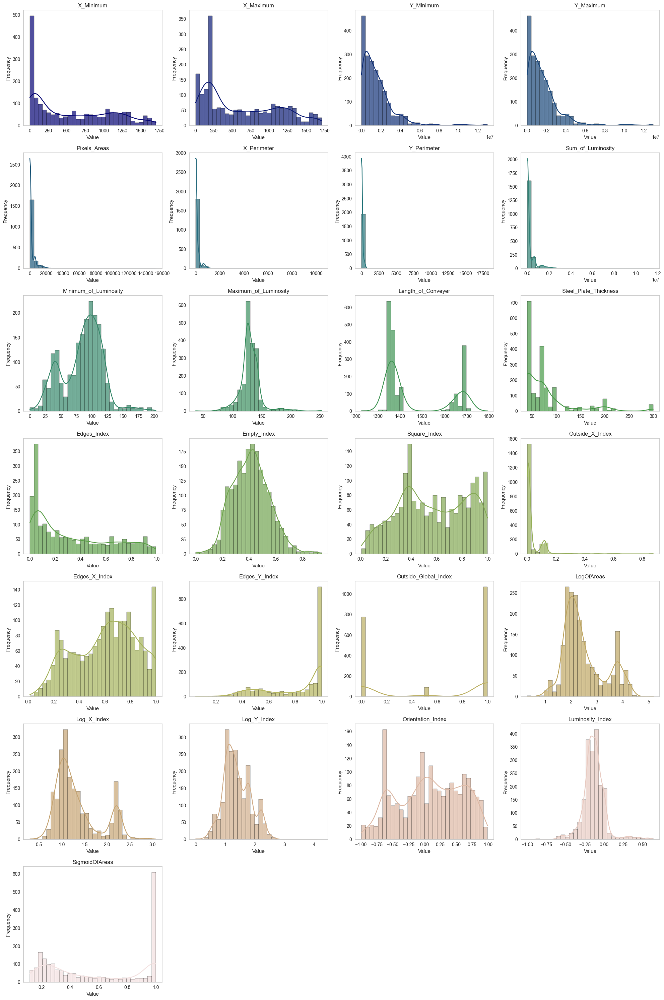

In [13]:
num_cols = 4  # Jumlah kolom per baris
num_rows = (len(numerical_cols) + num_cols - 1) // num_cols  # Menghitung jumlah baris yang dibutuhkan
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 30))
axes = axes.flatten()

# Memberikan warna pada histogram
palette = sns.color_palette("gist_earth", len(numerical_cols))

# Melakukan Looping pada setiap kolom dalam DataFrame
for i, col in enumerate(numerical_cols):
    ax = axes[i]
    sns.histplot(data=df, x=col, kde=True, ax=ax, bins=30, color=palette[i], alpha=0.7, edgecolor='black')
    ax.set_title(col)
    ax.set_ylabel('Frequency')
    ax.set_xlabel('Value')
    ax.grid(False)

# Menghilangkan subplot kosong
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Menampilkan Histogram
plt.tight_layout()
plt.show()

**Penjelasan:**

1. **X_Minimum, X_Maximum, Y_Minimum, Y_Maximum**: 
   - Distribusi fitur-fitur ini cenderung memiliki skewness ke kanan.

2. **Pixels_Areas, X_Perimeter, Y_Perimeter**:
   - Fitur-fitur ini juga menunjukkan skewness ke kanan. Ini bisa mengindikasikan bahwa kebanyakan pelat baja memiliki ukuran kecil atau sedang, dengan beberapa pelat yang berukuran sangat besar.

3. **Sum_of_Luminosity**:
   - Fitur ini menunjukkan skewness ke kanan, yang berarti sebagian besar pelat memiliki tingkat kecerahan yang rendah, tetapi ada beberapa pelat dengan kecerahan yang sangat tinggi.

4. **Minimum_of_Luminosity, Maximum_of_Luminosity**:
   - Fitur ini menunjukkan distribusi normal atau simetris, menunjukkan bahwa nilai minimum dan maksimum kecerahan cenderung menyebar lebih merata.

5. **Edges_Index, Empty_Index, Square_Index**:
   - Fitur-fitur ini menunjukkan distribusi yang beragam, yang menunjukkan bahwa tepi dan kekosongan pelat baja bervariasi, mungkin tergantung pada jenis pelat atau proses produksi.

6. **Edges_X_Index, Edges_Y_Index, Outside_Global_Index**:
   - Distribusi fitur-fitur ini menunjukkan beberapa puncak, yang bisa mengindikasikan adanya beberapa kelompok atau jenis pelat baja yang memiliki karakteristik tertentu.

7. **LogOfAreas**:
   - Ukuran area pelat baja tidak hanya terbatas pada nilai kecil, tetapi juga mencakup berbagai ukuran yang lebih besar, .

8. **Luminosity_Index, Orientation_Index**:
   - Fitur ini menunjukkan distribusi normal atau simetris, yang menunjukkan bahwa orientasi dan indeks luminositas cenderung tersebar merata di sekitar rata-rata mereka.

9. **SigmoidOfAreas**:
   - Distribusi ini menunjukkan bahwa setelah dilakukan transformasi sigmoid, kebanyakan nilai berada di rentang rendah dengan sedikit nilai yang lebih tinggi. Ini menunjukkan bahwa mayoritas pelat baja memiliki area yang relatif kecil.




### *c. Visualisasi Distribusi Jenis Kecacatan Baja*

In [14]:
# Menghitung distribusi cacat per jenis kategori
defect = df[['Pastry', 'Z_Scratch', 'K_Scatch', 'Stains', 'Dirtiness', 'Bumps', 'Other_Faults']]
for column in defect:
    distribution = df.groupby(column).size().reset_index(name='Counts')
    print(f"\nDistribusi Cacat untuk {column}:")
    display(distribution)



Distribusi Cacat untuk Pastry:


,Pastry,Counts
0,0,1783
1,1,158



Distribusi Cacat untuk Z_Scratch:


,Z_Scratch,Counts
0,0,1751
1,1,190



Distribusi Cacat untuk K_Scatch:


,K_Scatch,Counts
0,0,1550
1,1,391



Distribusi Cacat untuk Stains:


,Stains,Counts
0,0,1869
1,1,72



Distribusi Cacat untuk Dirtiness:


,Dirtiness,Counts
0,0,1886
1,1,55



Distribusi Cacat untuk Bumps:


,Bumps,Counts
0,0,1539
1,1,402



Distribusi Cacat untuk Other_Faults:


,Other_Faults,Counts
0,0,1268
1,1,673


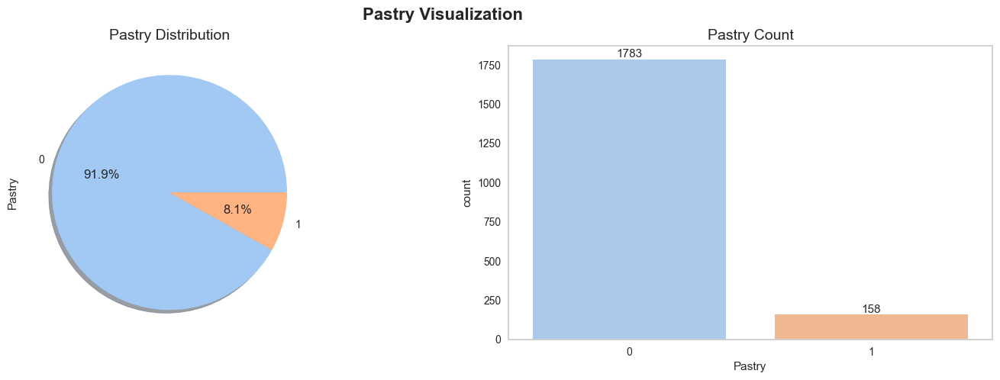

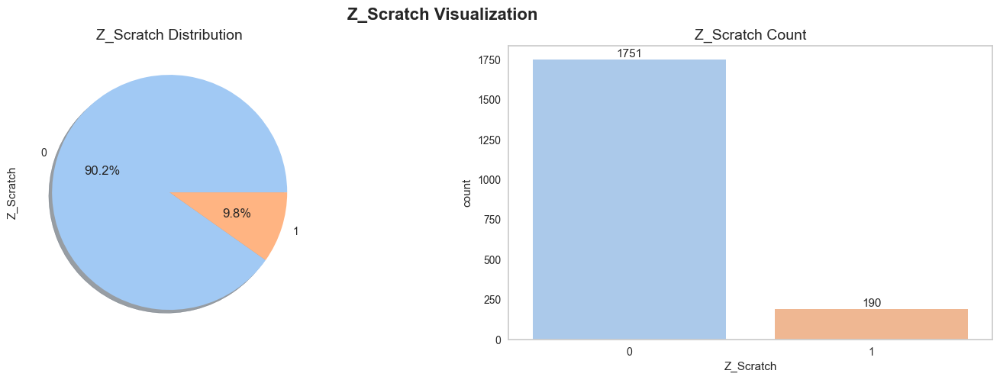

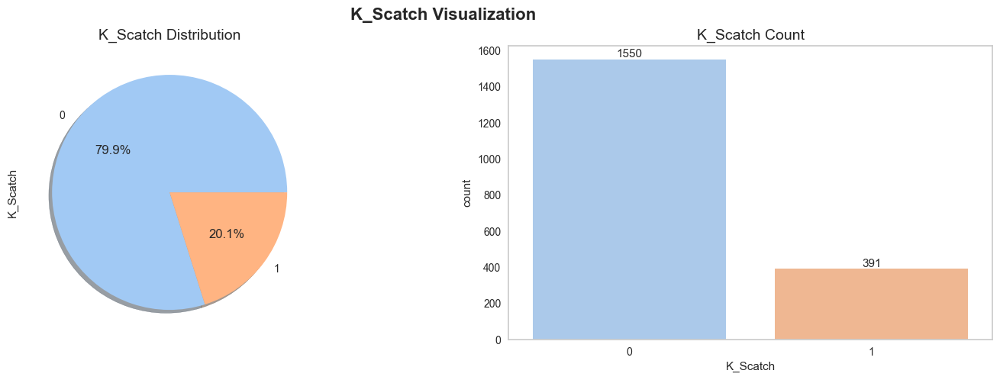

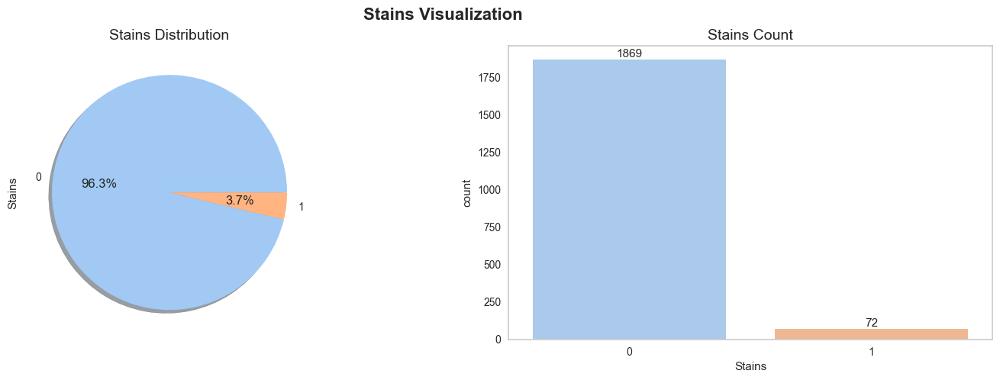

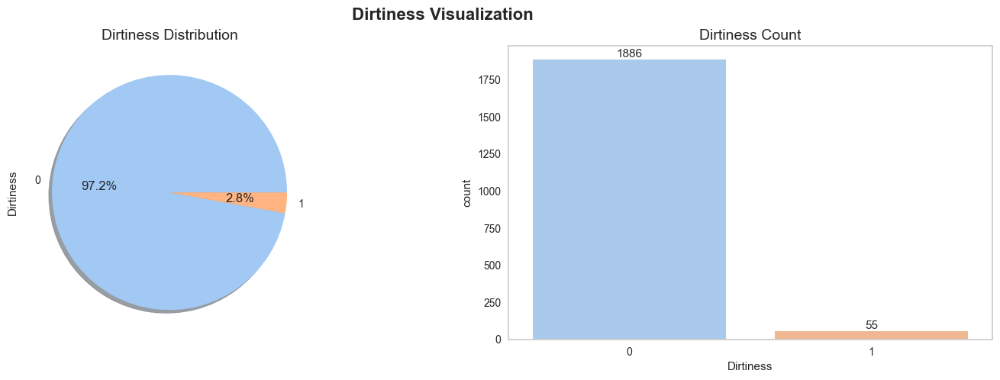

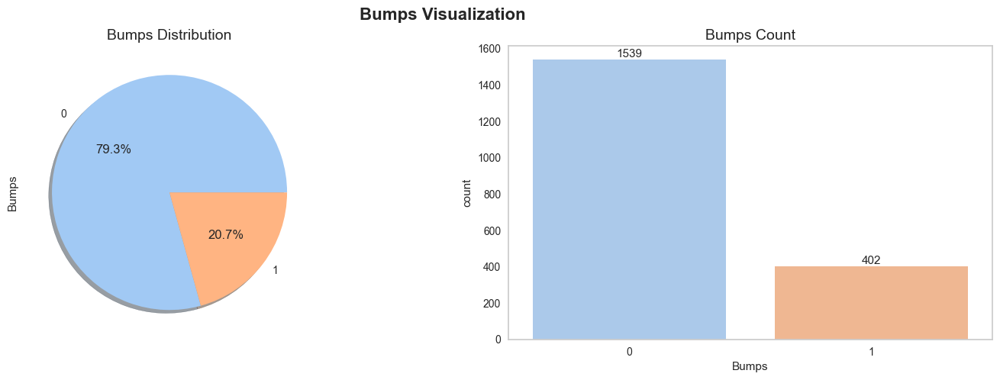

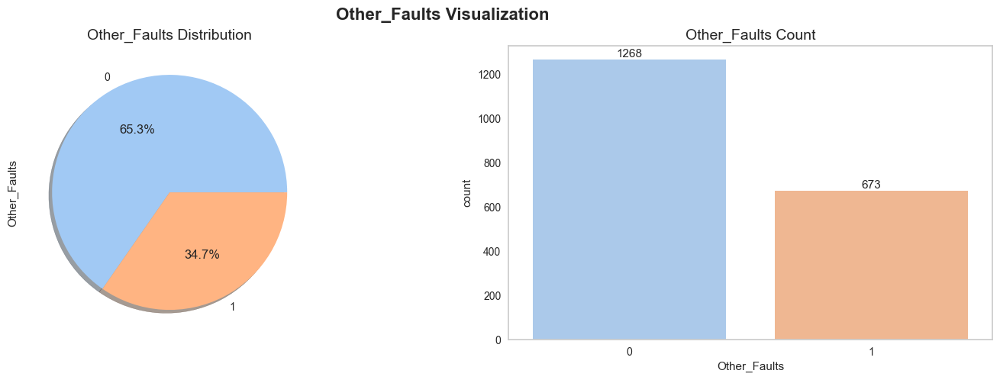

In [15]:
custom_palette = sns.color_palette("pastel")

for column in defect:
    f, ax = plt.subplots(1, 2, figsize=(18, 5))
    
    # Pie chart
    df[column].value_counts().plot.pie(
        autopct='%1.1f%%',
        ax=ax[0],
        shadow=True,
        colors=custom_palette
    )
    ax[0].set_ylabel(f'{column}')
    ax[0].set_title(f'{column} Distribution', fontsize=14)
    
    # Bar plot
    countplot = sns.countplot(
        x=column,
        data=df,
        ax=ax[1],
        palette=custom_palette
    )
    ax[1].set_title(f'{column} Count', fontsize=14)

    # Menambahkan angka di atas setiap bar
    for p in countplot.patches:
        countplot.text(
            p.get_x() + p.get_width() / 2,  
            p.get_height(),                 
            int(p.get_height()),            
            ha='center',                    
            va='bottom',                    
            fontsize=11                     
        )
    
    # Tampilkan visualisasi
    plt.suptitle(f'{column} Visualization', fontsize=16, fontweight='bold')

    # Nonaktifkan grid
    plt.grid(False)
    
    plt.show()

**Penjelasan:**

Berdasarkan visualisasi data tersebut, diketahui bahwa:
- Terdapat 1783 baja tidak terdapat cacat `Pastry` dan sebanyak 158 baja terdapat cacat `Pastry`

- Terdapat 1751 baja tidak terdapat cacat `Z Scratch` dan sebanyak 190 baja terdapat cacat `Z Scratch`
- Terdapat 1550 baja tidak terdapat cacat `K Scratch` dan sebanyak 391 baja terdapat cacat `K Scratch`
- Terdapat 1869 baja tidak  cacat `Stains` dan sebanyak 72 baja terdapat cacat `Stains`
- Terdapat 1886 baja tidak terdapat cacat `Dirtiness` dan sebanyak 55 baja terdapat cacat `Dirtiness`
- Terdapat 1539 baja tidak terdapat cacat `Bumps` dan sebanyak 402 baja terdapat cacat `Bumps` 
- Terdapat 1268 baja tidak terdapat cacat `Other Faults` dan sebanyak 673 baja terdapat cacat `Other Faults` 


### *d. Tipe pelat baja apa yang paling banyak digunakan?*

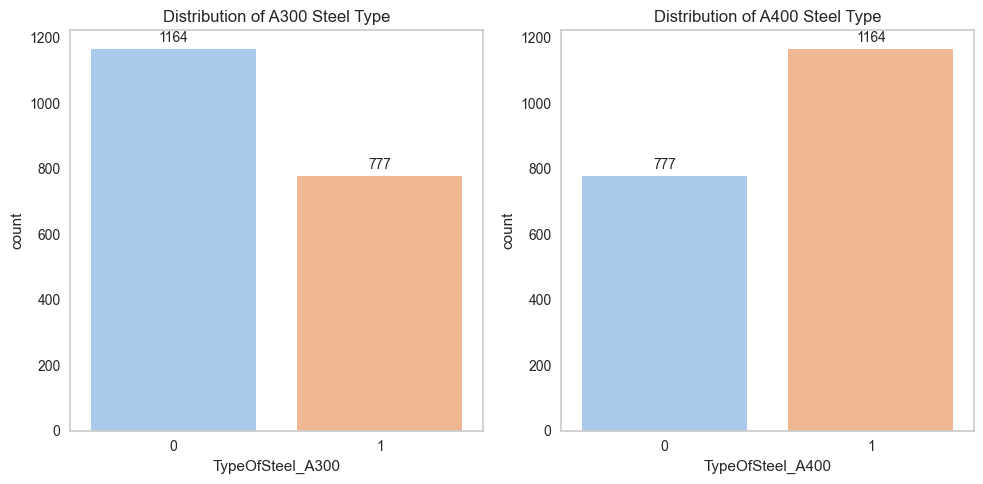

In [16]:
# Plot distribusi dari kolom TypeOfSteel_A300
plt.figure(figsize=(10, 5))

a3 = plt.subplot(1, 2, 1)
sns.countplot(x='TypeOfSteel_A300', data=df, palette='pastel')
plt.title('Distribution of A300 Steel Type')

# Menambahkan jumlah di atas setiap bar
for container in a3.containers:
    a3.bar_label(container, label_type='edge', fontsize=10, padding=3)

# Nonaktifkan grid
plt.grid(False)

# Plot distribusi dari kolom TypeOfSteel_A400
a4 = plt.subplot(1, 2, 2)
sns.countplot(x='TypeOfSteel_A400', data=df, palette='pastel')
plt.title('Distribution of A400 Steel Type')

plt.tight_layout()

# Menambahkan jumlah di atas setiap bar
for container in a4.containers:
    a4.bar_label(container, label_type='edge', fontsize=10, padding=3)

# Nonaktifkan grid
plt.grid(False)

plt.show()


**Penjelasan:**

- Proporsi pelat baja paling banyak pada jenis A400 sebanyak 1164 baja dibandingkan jenis A300 sebanyak 777 baja. 


### *e. Tipe pelat baja apa yang paling banyak mengalami Kecacatan baja?*

In [17]:
# Membuat Kolom Baru untuk Menentukan Tipe Baja
df['Steel_Type'] = df['TypeOfSteel_A400'].apply(lambda x: 'A400' if x == 1 else 'A300')

df_melted = df.melt(id_vars='Steel_Type', value_vars=defect, var_name='Defect_Type', value_name='Has_Defect')
df_defect = df_melted[df_melted['Has_Defect'] == 1]

# Membuat pivot table 
pivot_table = df_defect.pivot_table(
    index='Defect_Type',  
    columns='Steel_Type',  
    values='Has_Defect',   
    aggfunc='sum',         
)
display(pivot_table)


Steel_Type,A300,A400
Defect_Type,,
Bumps,279,123
Dirtiness,9,46
K_Scatch,1,390
Other_Faults,266,407
Pastry,49,109
Stains,1,71
Z_Scratch,172,18


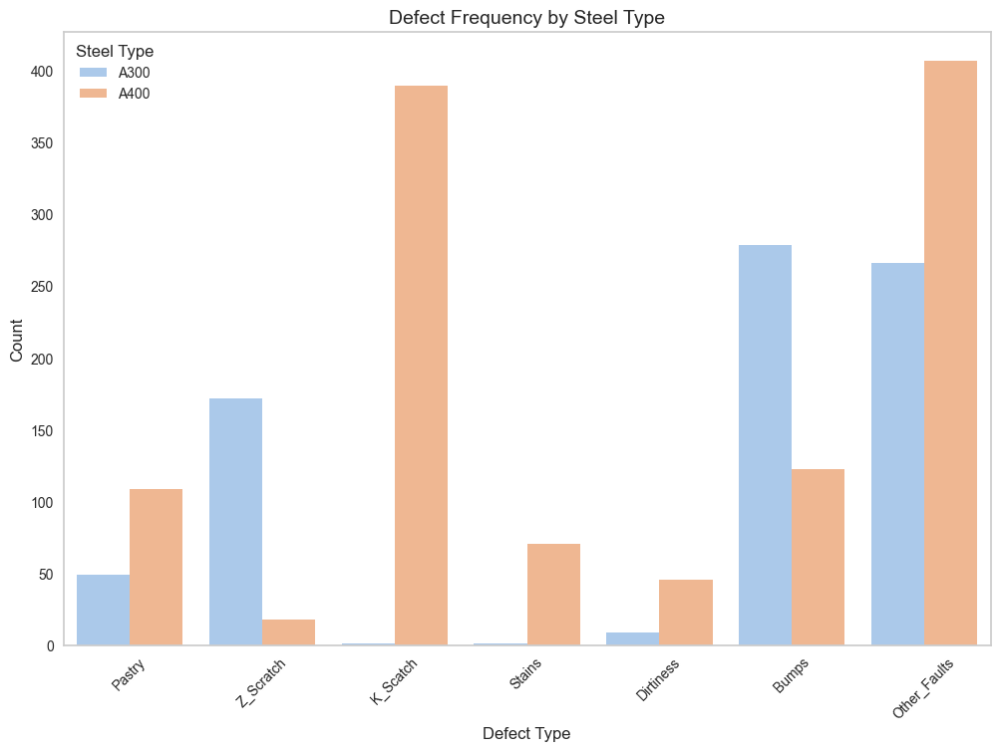

In [18]:
# Membuat Visualisasi
plt.figure(figsize=(12, 8))
sns.countplot(data=df_defect, x='Defect_Type', hue='Steel_Type', palette='pastel')
plt.title('Defect Frequency by Steel Type', fontsize=14)
plt.xlabel('Defect Type', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Steel Type')
plt.grid(True)

# Nonaktifkan grid
plt.grid(False)

plt.show()

**Penjelasan:**

Berdasarkan visualisasi data tersebut diketahui bahwa jenis kecatatan lebih banyak terjadi pada jenis baja A400 dan jenis kecacatan yang lebih banyak terjadi yaitu jenis kecacatan lainnya dibandingkan jenis cacat `Stains` atau area yang berubah warna pada permukaan pelat baja. Stains ini dapat dihasilkan dari berbagai sumber, termasuk karat, minyak, lemak, atau zat asing lainnya yang bersentuhan dengan permukaan baja selama pemrosesan, penyimpanan, atau penanganan. Stains dapat mempengaruhi penampilan visual dan potensi ketahanan korosi pelat baja.

### *f. Berapa banyak Frekuensi dan Rata-Rata setiap fitur terhadap Jenis Kecacatan baja?*

In [19]:
# Mengelompokkan fitur
features = {
    'Location_Features': ['X_Minimum', 'X_Maximum', 'Y_Minimum', 'Y_Maximum'],
    'Size_Features': ['Pixels_Areas', 'X_Perimeter', 'Y_Perimeter'],
    'Luminosity_Features': ['Sum_of_Luminosity', 'Minimum_of_Luminosity', 'Maximum_of_Luminosity'],
    'Index_Features': ['Steel_Plate_Thickness', 'Edges_Index', 'Empty_Index', 'Square_Index', 'Outside_X_Index', 'Edges_X_Index', 'Edges_Y_Index', 'Outside_Global_Index'],
    'Logarithmic_Features': ['LogOfAreas', 'Log_X_Index', 'Log_Y_Index'],
    'Statistical_Features': ['Orientation_Index', 'Luminosity_Index', 'SigmoidOfAreas']
}

In [20]:
custom_palette2 = sns.color_palette("Set3")

In [21]:
# Menyimpan hasil
results = {}

# Menghitung mean dan count untuk setiap defect dan fitur
for category, feature_list in features.items():
    for feature in feature_list:
        mean_results = {}
        count_results = {}

        for d in defect:
            mean_value = df[df[d] == 1][feature].mean()
            count_value = df[df[d] == 1][feature].count()
            mean_results[d] = mean_value
            count_results[d] = count_value

        # Menyimpan hasil dalam dictionary
        results[feature] = {
            'Mean': mean_results,
            'Count': count_results
        }

# Menampilkan hasil
for feature, values in results.items():
    print(f"\nFeature: {feature}")
    print("Mean Values:")
    for defect_type, mean_value in values['Mean'].items():
        print(f"{defect_type}: {mean_value:.2f}")

    print("")
    
    print("Count Values:")
    for defect_type, count_value in values['Count'].items():
        print(f"{defect_type}: {count_value}")


Feature: X_Minimum
Mean Values:
Pastry: 807.13
Z_Scratch: 209.32
K_Scatch: 136.59
Stains: 766.71
Dirtiness: 887.93
Bumps: 796.53
Other_Faults: 688.89

Count Values:
Pastry: 158
Z_Scratch: 190
K_Scatch: 391
Stains: 72
Dirtiness: 55
Bumps: 402
Other_Faults: 673

Feature: X_Maximum
Mean Values:
Pastry: 818.20
Z_Scratch: 228.04
K_Scatch: 285.06
Stains: 773.78
Dirtiness: 899.16
Bumps: 814.31
Other_Faults: 717.52

Count Values:
Pastry: 158
Z_Scratch: 190
K_Scatch: 391
Stains: 72
Dirtiness: 55
Bumps: 402
Other_Faults: 673

Feature: Y_Minimum
Mean Values:
Pastry: 1868145.75
Z_Scratch: 1309620.02
K_Scatch: 1649199.76
Stains: 1048675.74
Dirtiness: 2318304.05
Bumps: 2088486.76
Other_Faults: 1445117.89

Count Values:
Pastry: 158
Z_Scratch: 190
K_Scatch: 391
Stains: 72
Dirtiness: 55
Bumps: 402
Other_Faults: 673

Feature: Y_Maximum
Mean Values:
Pastry: 1868202.85
Z_Scratch: 1309661.43
K_Scatch: 1649336.20
Stains: 1048680.57
Dirtiness: 2318360.76
Bumps: 2088505.95
Other_Faults: 1445152.18

Count Val

**Penjelasan:**

Berdasarkan hasil analisis, dapat diketahui bahwa jenis kecacatan `K Scatch` memiliki karakteristik sebagai berikut:
- Memiliki nilai rata-rata yang lebih tinggi pada `Y_Minimum` dan `Y_Maximum` dibandingkan jenis kecacatan lainnya dan memiiki rata-rata yang lebih rendah pada `X_Minimum`, `X_Maximum.

- Memiliki nilai rata-rata `Pixels_Areas` yang sangat tinggi dibandingkan dengan kecacatan lainnya. Ini menunjukkan bahwa `K_Scatch` mungkin melibatkan area yang jauh lebih besar pada plat baja dibandingkan dengan jenis cacat lainnya.

- Memiliki nilai rata-rata `X_Perimeter` dan `Y_Perimeter` yang sangat tinggi, mengindikasikan bahwa cacat ini seringkali memerlukan perimeter yang lebih besar.

- Memiliki nilai rata-rata yang jauh lebih tinggi pada `Sum_of_Luminosity`, menunjukkan adanya lebih banyak cahaya  refleksi yang terkait dengan jenis cacat ini.

- Memiliki ketebalan plat baja yang lebih tipis dibandingkan cacat lainnya, sedangkan `Dirtiness` memiliki ketebalan plat yang lebih tinggi.

- Memiliki nilai rata-rata `LogOfAreas`, `Log_X_Index`, `Log_Y_Index` yang lebih tinggi yang menunjukkan bahwa cacat ini mungkin lebih sering melibatkan area atau indeks yang lebih besar.



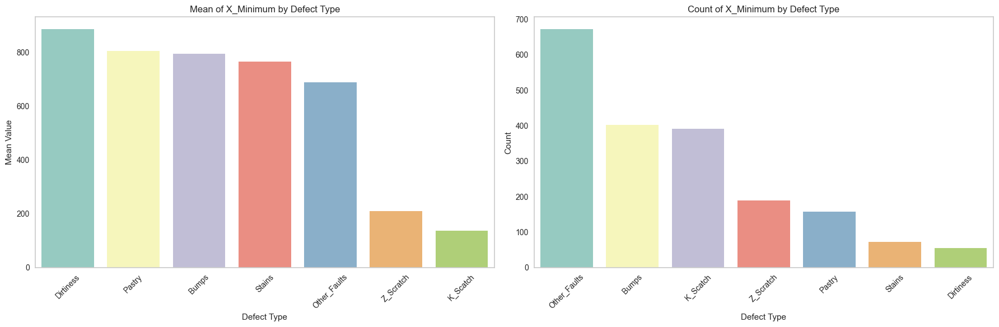

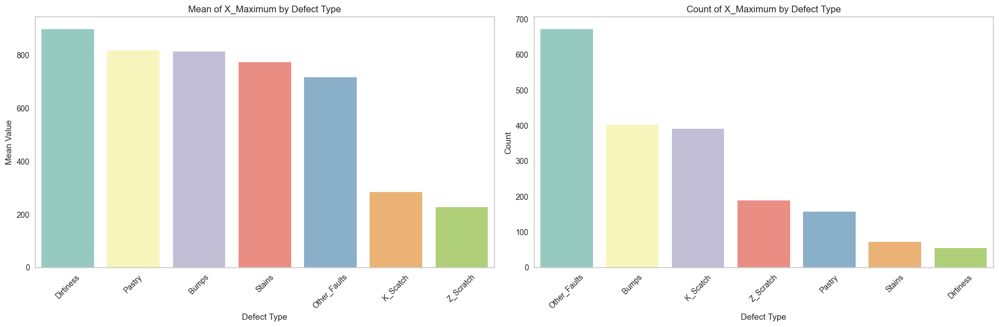

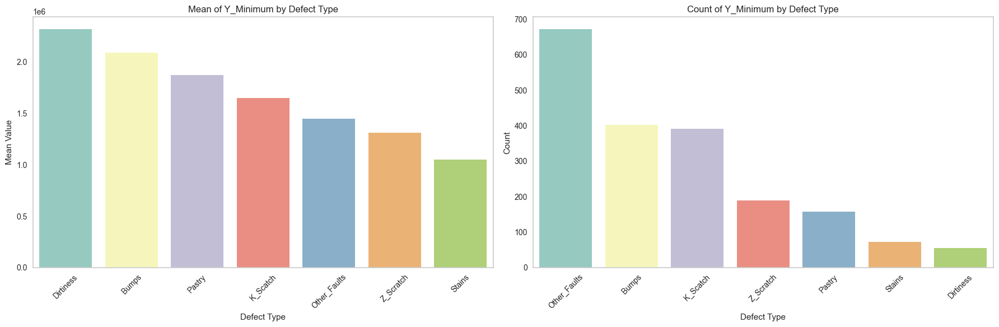

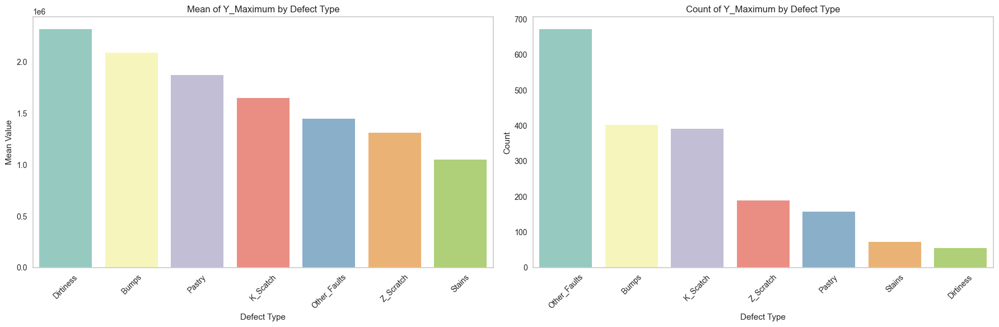

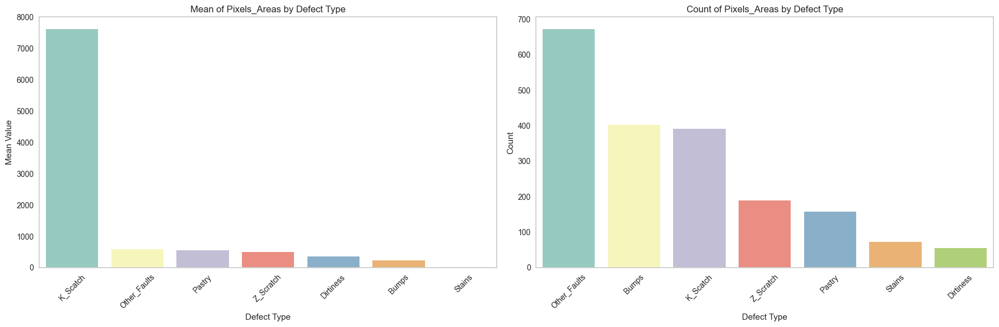

...

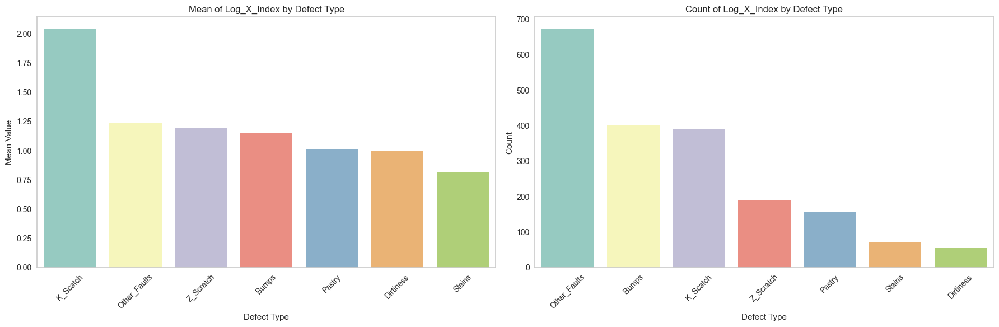

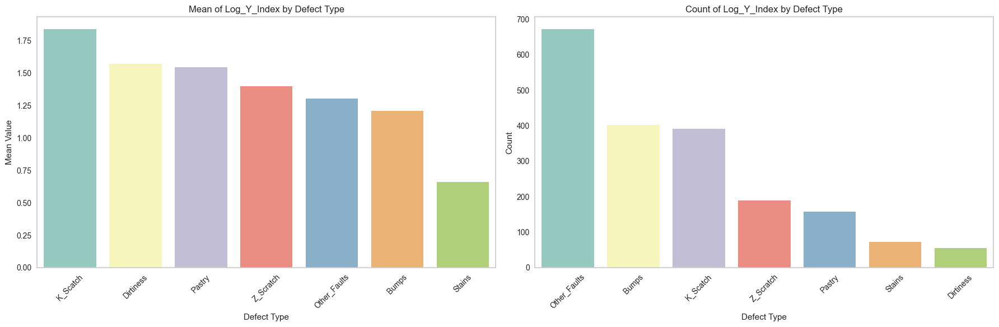

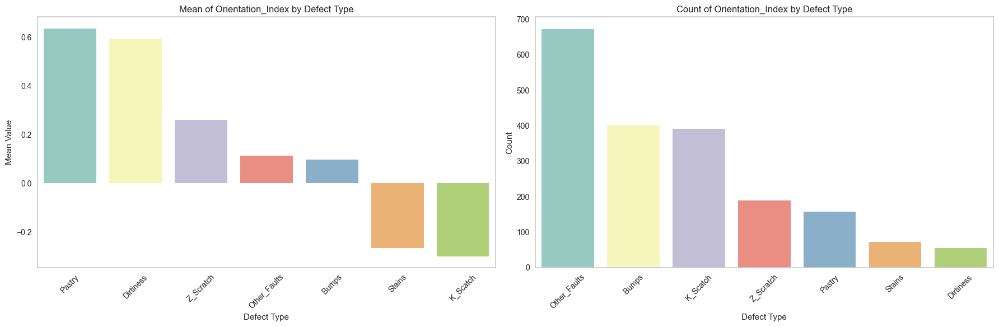

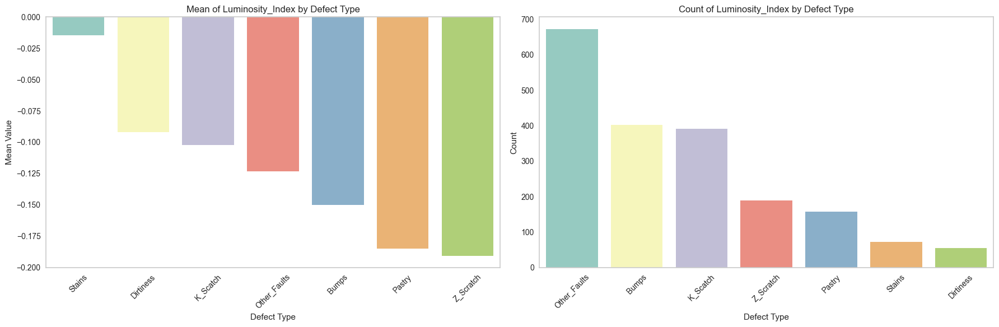

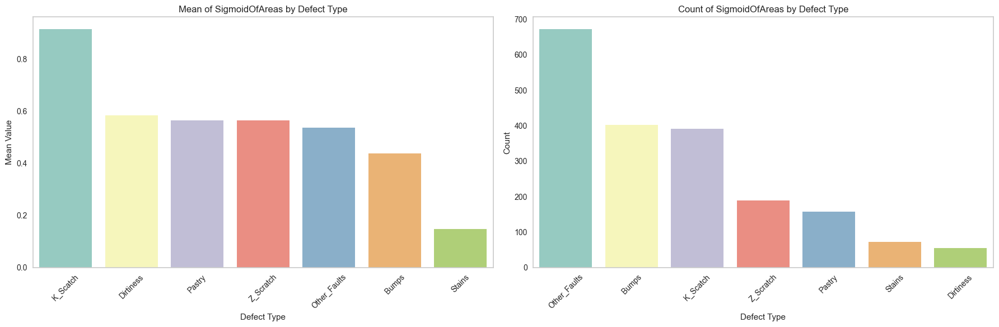

In [22]:
# Membuat Visualisasi
for category, feature_list in features.items():
    
    for feature in feature_list:
        fig, axes = plt.subplots(1, 2, figsize=(18, 6))
        
        # Mean
        means = {d: df[df[d] == 1][feature].mean() for d in defect}
        mean_summary = pd.DataFrame(list(means.items()), columns=['Defect', 'Mean_Value'])
        
        # Mengurutkan hasil mean_summary berdasarkan yang terbesar
        mean_summary = mean_summary.sort_values(by='Mean_Value', ascending=False)
        
        sns.barplot(x='Defect', y='Mean_Value', data=mean_summary, ax=axes[0], palette=custom_palette2)
        axes[0].set_title(f'Mean of {feature} by Defect Type')
        axes[0].set_xlabel('Defect Type')
        axes[0].set_ylabel('Mean Value')
        axes[0].tick_params(axis='x', rotation=45)
        axes[0].grid(False)
    
        # Count 
        counts = {d: df[df[d] == 1][feature].count() for d in defect}
        count_summary = pd.DataFrame(list(counts.items()), columns=['Defect', 'Count'])
        
        # Mengurutkan hasil mean_summary berdasarkan yang terbesar
        count_summary = count_summary.sort_values(by='Count', ascending=False)
        
        sns.barplot(x='Defect', y='Count', data=count_summary, ax=axes[1], palette=custom_palette2)
        axes[1].set_title(f'Count of {feature} by Defect Type')
        axes[1].set_xlabel('Defect Type')
        axes[1].set_ylabel('Count')
        axes[1].tick_params(axis='x', rotation=45)
        axes[1].grid(False)

        plt.tight_layout()
        plt.show()


**Penjelasan:**

Berdasarkan visualisasi rata-rata dan frekuensi fitur terhadap setiap jenis kecacatan dapat diperoleh informasi terkait pola kecacatan dan fitur yg dijadikan prioritas untuk dilakukan perbaikan untuk memperoleh produk baja yang lebih berkualitas.



## **4.2 Analisis Bivariat**

### *a. Apakah terdapat hubungan antaran Tipe Baja dengan Jenis Kecacatan baja*

**Penjelasan:**

- Untuk mengetahui hubungan antara tipe baja dengan jenis kecacatan baja dilakukan analisis korelasi dengan uji Chi-Square.

- Uji Chi-Square dapat digunakan untuk menentukan apakah ada hubungan yang signifikan antara fitur kategorikal ini dan target.


#### - Type of Steel A300

In [26]:
for fault in defect:
    # Membuat tabel kontingensi
    contingency_table = pd.crosstab(df['TypeOfSteel_A300'], df[fault])
    
    # Uji Chi-Square
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    
    # Menampilkan p-value
    print(f"Uji Chi-Square untuk {fault}:")
    print(f"    P-Value: {p}")
    
    # Menentukan signifikansi
    if p < 0.05:
        print("    Ada hubungan yang signifikan antara TypeOfSteel_A300 dan", fault)
    else:
        print("    Tidak ada hubungan yang signifikan antara TypeOfSteel_A300 dan", fault)
    
    print() 

Uji Chi-Square untuk Pastry:
    P-Value: 0.019846658187485672
    Ada hubungan yang signifikan antara TypeOfSteel_A300 dan Pastry

Uji Chi-Square untuk Z_Scratch:
    P-Value: 4.52608091427427e-50
    Ada hubungan yang signifikan antara TypeOfSteel_A300 dan Z_Scratch

Uji Chi-Square untuk K_Scatch:
    P-Value: 1.067697355449356e-71
    Ada hubungan yang signifikan antara TypeOfSteel_A300 dan K_Scatch

Uji Chi-Square untuk Stains:
    P-Value: 2.1236783978436446e-11
    Ada hubungan yang signifikan antara TypeOfSteel_A300 dan Stains

Uji Chi-Square untuk Dirtiness:
    P-Value: 0.00047474483735122984
    Ada hubungan yang signifikan antara TypeOfSteel_A300 dan Dirtiness

Uji Chi-Square untuk Bumps:
    P-Value: 3.4696703400591215e-41
    Ada hubungan yang signifikan antara TypeOfSteel_A300 dan Bumps

Uji Chi-Square untuk Other_Faults:
    P-Value: 0.7771280534812194
    Tidak ada hubungan yang signifikan antara TypeOfSteel_A300 dan Other_Faults



**Penjelasan:**

Berdasarkan uji chi square diketahui bahwa tipe baja A300 memiliki hubungan yang signifikan dengan jenis kecacatan baja, diantaranya yaitu `Pastry, Z Scratch, K Scratch, Stains, Dirtness dan Bumps ` sedangkan jenis kecacatan lainnya `(Other Faults)` tidak memiliki hubungan dengan tipe baja A300

#### - Type of Steel A400

In [27]:
for fault in defect:
    # Membuat tabel kontingensi
    contingency_table = pd.crosstab(df['TypeOfSteel_A400'], df[fault])
    
    # Iji Chi-Square
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    
    # Menampilkan p-value
    print(f"Uji Chi-Square untuk {fault}:")
    print(f"    P-Value: {p}")
    
    # Menentukan signifikansi
    if p < 0.05:
        print("    Ada hubungan yang signifikan antara TypeOfSteel_A400 dan", fault)
    else:
        print("    Tidak ada hubungan yang signifikan antara TypeOfSteel_A400 dan", fault)
    
    print() 

Uji Chi-Square untuk Pastry:
    P-Value: 0.019846658187485672
    Ada hubungan yang signifikan antara TypeOfSteel_A400 dan Pastry

Uji Chi-Square untuk Z_Scratch:
    P-Value: 4.52608091427427e-50
    Ada hubungan yang signifikan antara TypeOfSteel_A400 dan Z_Scratch

Uji Chi-Square untuk K_Scatch:
    P-Value: 1.067697355449356e-71
    Ada hubungan yang signifikan antara TypeOfSteel_A400 dan K_Scatch

Uji Chi-Square untuk Stains:
    P-Value: 2.1236783978436446e-11
    Ada hubungan yang signifikan antara TypeOfSteel_A400 dan Stains

Uji Chi-Square untuk Dirtiness:
    P-Value: 0.00047474483735122984
    Ada hubungan yang signifikan antara TypeOfSteel_A400 dan Dirtiness

Uji Chi-Square untuk Bumps:
    P-Value: 3.4696703400591215e-41
    Ada hubungan yang signifikan antara TypeOfSteel_A400 dan Bumps

Uji Chi-Square untuk Other_Faults:
    P-Value: 0.7771280534812193
    Tidak ada hubungan yang signifikan antara TypeOfSteel_A400 dan Other_Faults



**Penjelasan:**

Berdasarkan uji chi square diketahui bahwa tipe baja A400 memiliki hubungan yang signifikan dengan jenis kecacatan baja, diantaranya yaitu `Pastry, Z Scratch, K Scratch, Stains, Dirtness dan Bumps ` sedangkan jenis kecacatan lainnya `(Other Faults)` tidak memiliki hubungan dengan tipe baja A400



### *b. Apakah terdapat perbedaan antaran setiap fitur dengan Jenis Kecacatan baja*

**Penjelasan:**

- Untuk mengetahui perbedaan antara setiap fitur dengan jenis kecacatan baja dilakukan analisis korelasi dengan Uji Anova.

    -  Uji ANOVA dilakukan pada fitur-fitur dengan nilai kontinu seperti X_Minimum, Y_Maximum, Pixels_Areas, dll., untuk menguji apakah ada perbedaan signifikan dalam nilai rata-rata fitur di antara target.


In [28]:
continuous_features = ['X_Minimum', 'X_Maximum', 'Y_Minimum', 'Y_Maximum', 
                       'Pixels_Areas', 'X_Perimeter', 'Y_Perimeter', 
                       'Sum_of_Luminosity', 'Minimum_of_Luminosity', 
                       'Maximum_of_Luminosity', 'Steel_Plate_Thickness', 
                       'Edges_Index', 'Empty_Index', 'Square_Index', 
                       'Outside_X_Index', 'Edges_X_Index', 'Edges_Y_Index', 
                       'Outside_Global_Index', 'LogOfAreas', 'Log_X_Index', 
                       'Log_Y_Index', 'Orientation_Index', 'Luminosity_Index', 
                       'SigmoidOfAreas']

def anova_test_for_features(df, features, targets):
    results = {}
    for feature in features:
        results[feature] = {}
        for target in targets:
            group1 = df[df[target] == 0][feature]
            group2 = df[df[target] == 1][feature]
            f_statistic, p_value = f_oneway(group1, group2)
            results[feature][target] = {'F-Statistic': f_statistic, 'P-Value': p_value}
    return results


target_columns = ['Pastry', 'Z_Scratch', 'K_Scatch', 'Stains', 
                  'Dirtiness', 'Bumps', 'Other_Faults']


anova_results = anova_test_for_features(df, continuous_features, target_columns)


for feature, targets in anova_results.items():
    print(f"Feature: {feature}")
    for target, result in targets.items():
        print()
        print(f"  Target: {target}")
        print(f"    F-Statistic: {result['F-Statistic']}")
        print(f"    P-Value: {result['P-Value']}")
        if result['P-Value'] < 0.05:
            print(f"    Ada perbedaan signifikan antara {feature} dan {target}")
        else:
            print(f"    Tidak ada perbedaan signifikan antara {feature} dan {target}") 
    print("\n")

Feature: X_Minimum

  Target: Pastry
    F-Statistic: 35.9702204567911
    P-Value: 2.384042846746382e-09
    Ada perbedaan signifikan antara X_Minimum dan Pastry

  Target: Z_Scratch
    F-Statistic: 107.27052041668077
    P-Value: 1.668757726831347e-24
    Ada perbedaan signifikan antara X_Minimum dan Z_Scratch

  Target: K_Scatch
    F-Statistic: 413.53261155725403
    P-Value: 1.727571652336294e-83
    Ada perbedaan signifikan antara X_Minimum dan K_Scatch

  Target: Stains
    F-Statistic: 10.601026764766335
    P-Value: 0.0011497329371618163
    Ada perbedaan signifikan antara X_Minimum dan Stains

  Target: Dirtiness
    F-Statistic: 21.170220576194115
    P-Value: 4.47438452636567e-06
    Ada perbedaan signifikan antara X_Minimum dan Dirtiness

  Target: Bumps
    F-Statistic: 99.84577332672588
    P-Value: 5.853492080811587e-23
    Ada perbedaan signifikan antara X_Minimum dan Bumps

  Target: Other_Faults
    F-Statistic: 54.133986728535916
    P-Value: 2.7511093005623344e-13

**Penjelasan:**

Berdasarkan hasil analisis tersebut terdapat beberapa fitur yang tidak ada perbedaan signifikan dengan jenis kecacatan baja, yaitu:
- Y_Minimum tidak memiliki perbedaan signifikan dengan Pastry dan K Scatch     

- Y_Maximum tidak memiliki perbedaan signifikan dengan Pastry dan K Scatch              
- X_Perimeter tidak memiliki perbedaan signifikan dengan Dirtiness            
- Y_Perimeter tidak memiliki perbedaan signifikan dengan Pastry, Z Scratch, Stains dan Dirtiness           
- Maximum_of_Luminosity tidak memiliki perbedaan signifikan dengan Bumps dan Other Faults   
- Steel_Plate_Thickness tidak memiliki perbedaan signifikan dengan Z Scratch, Bumps dan Dirtiness   
- Edges_Index tidak memiliki perbedaan signifikan dengan Pastry           
- Empty_Index tidak memiliki perbedaan signifikan dengan Stains dan Dirtiness           
- Square_Index tidak memiliki perbedaan signifikan dengan Z Scratch          
- Outside_X_Index tidak memiliki perbedaan signifikan dengan Other Faults    
- LogOfAreas tidak memiliki perbedaan signifikan dengan Pastry dan Dirtiness            
- Orientation_Index tidak memiliki perbedaan signifikan dengan Bumps dan Other Faults      
- Luminosity_Index tidak memiliki perbedaan signifikan dengan Other Faults       
- SigmoidOfAreas tidak memiliki perbedaan signifikan dengan Pastry, Z Scratch, Stains dan Dirtiness        

### *c. Visualisasi (Heatmap)*

In [29]:
# Kolom target
target_columns = ['Pastry', 'Z_Scratch', 'K_Scatch', 'Stains', 'Dirtiness', 'Bumps', 'Other_Faults']

# Kolom berdasarkan kategori
location_features = ['X_Minimum', 'X_Maximum', 'Y_Minimum', 'Y_Maximum']
size_features = ['Pixels_Areas', 'X_Perimeter', 'Y_Perimeter']
luminosity_features = ['Sum_of_Luminosity', 'Minimum_of_Luminosity', 'Maximum_of_Luminosity']
material_index_features = [
                        'TypeOfSteel_A300', 'TypeOfSteel_A400', 'Steel_Plate_Thickness', 'Edges_Index', 'Empty_Index',
                        'Square_Index', 'Outside_X_Index', 'Edges_X_Index', 'Edges_Y_Index', 'Outside_Global_Index'
                        ]
logarithmic_features = ['LogOfAreas', 'Log_X_Index', 'Log_Y_Index']
statistical_features = ['Orientation_Index', 'Luminosity_Index', 'SigmoidOfAreas']

# Menggabungkan semua kolom fitur dan target
all_columns = location_features + size_features + luminosity_features + material_index_features + logarithmic_features + statistical_features + target_columns

df_numeric = df[all_columns].select_dtypes(include=[int, float])


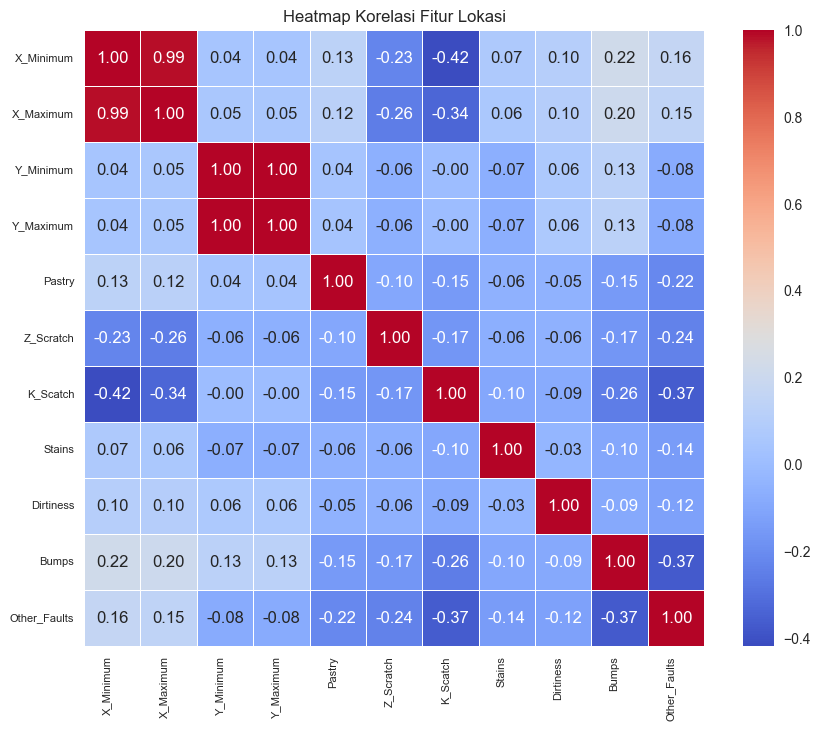

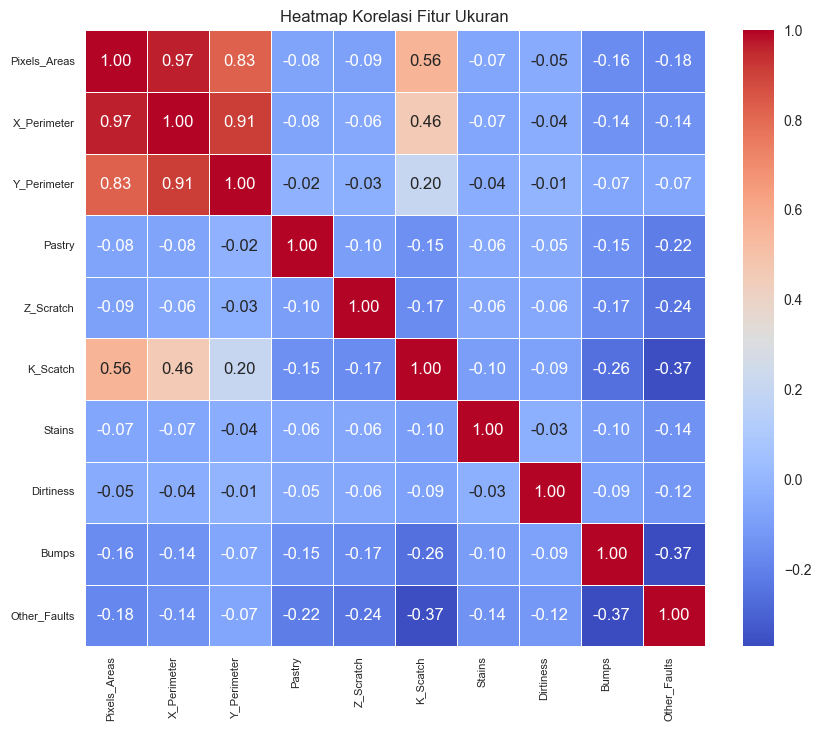

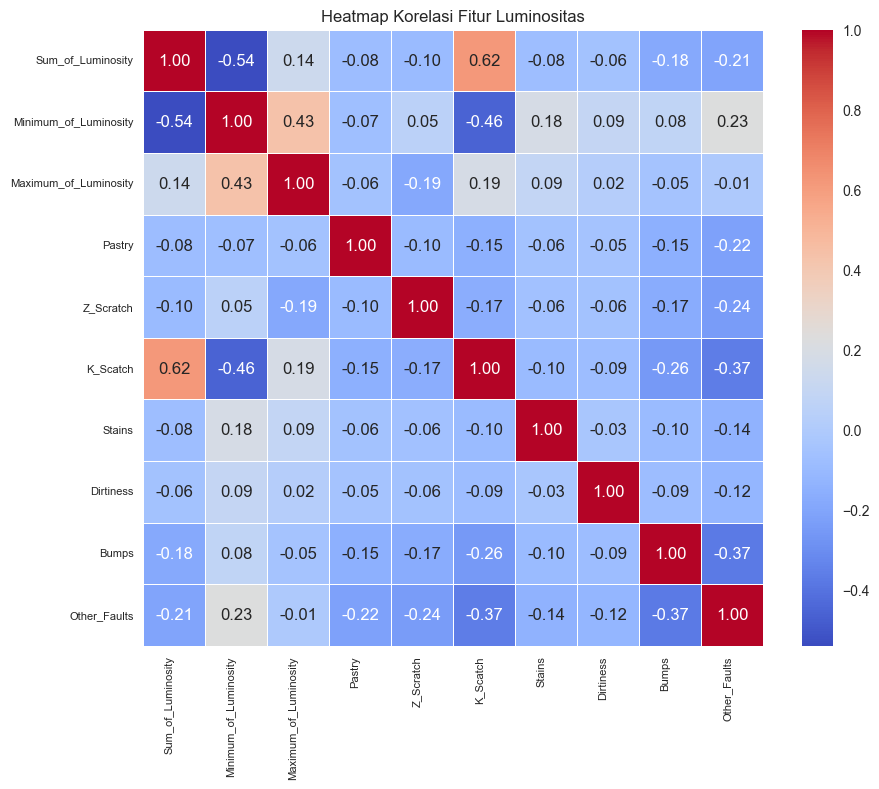

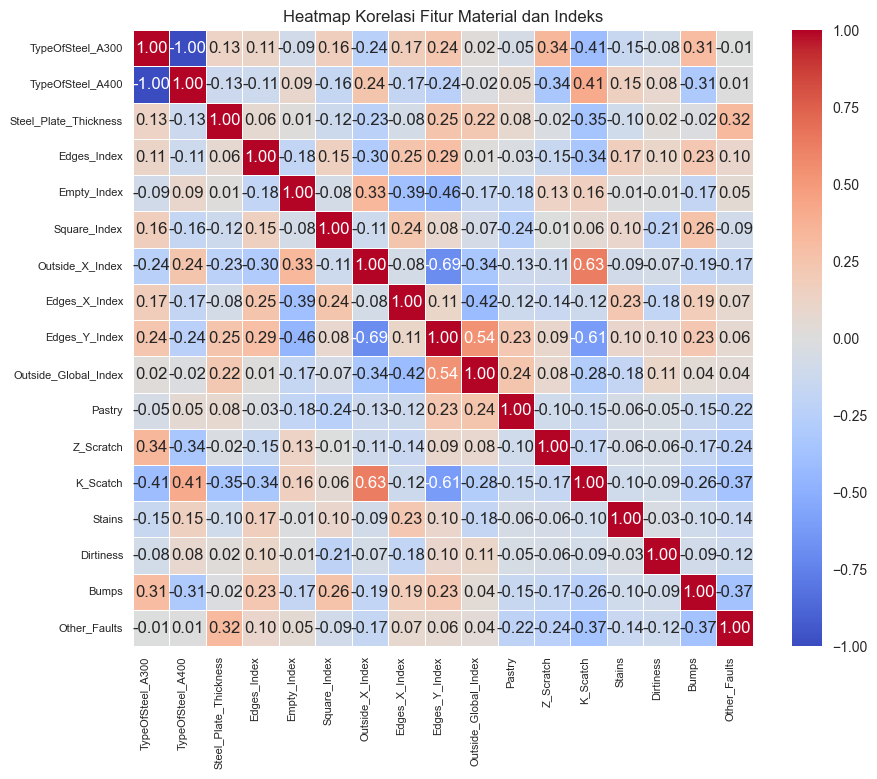

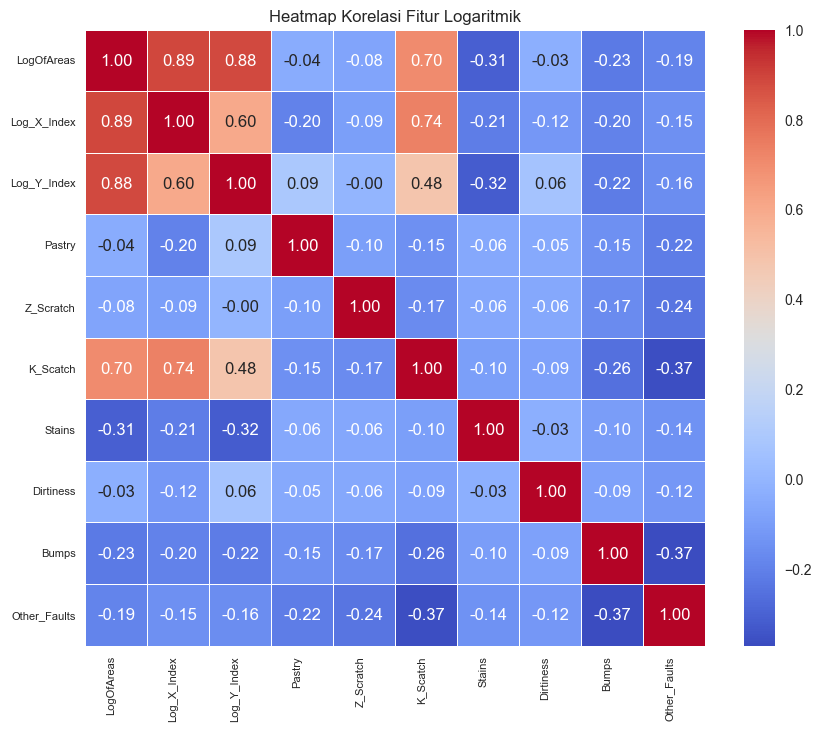

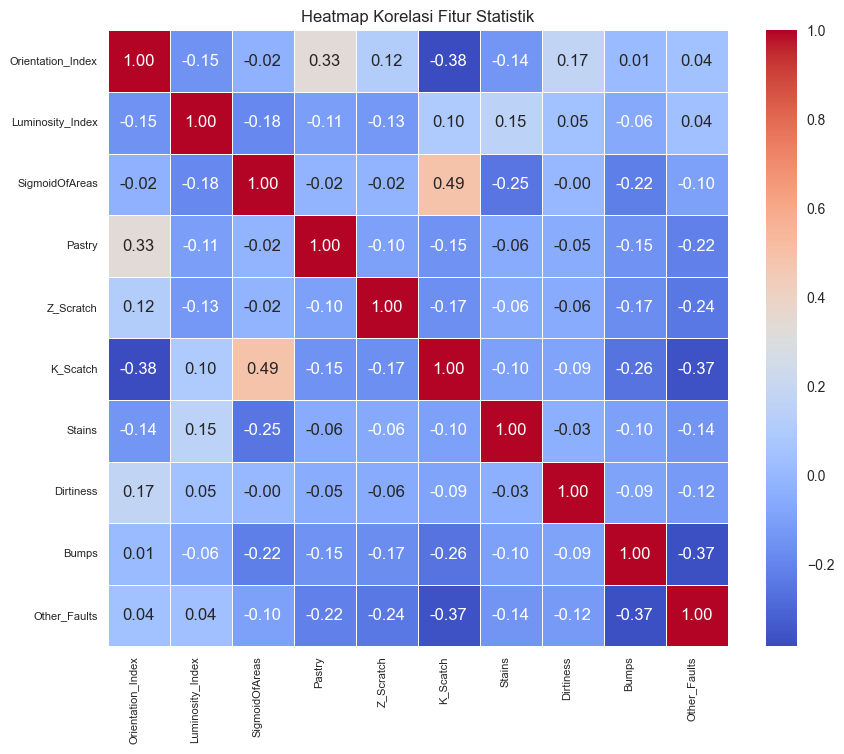


Analisis Korelasi untuk Target: Pastry
Fitur-fitur signifikan untuk Pastry: ['X_Minimum', 'X_Maximum', 'Pixels_Areas', 'X_Perimeter', 'Sum_of_Luminosity', 'Minimum_of_Luminosity', 'Maximum_of_Luminosity', 'TypeOfSteel_A300', 'TypeOfSteel_A400', 'Steel_Plate_Thickness', 'Empty_Index', 'Square_Index', 'Outside_X_Index', 'Edges_X_Index', 'Edges_Y_Index', 'Outside_Global_Index', 'Log_X_Index', 'Log_Y_Index', 'Orientation_Index', 'Luminosity_Index', 'Z_Scratch', 'K_Scatch', 'Stains', 'Dirtiness', 'Bumps', 'Other_Faults']

Analisis Korelasi untuk Target: Z_Scratch
Fitur-fitur signifikan untuk Z_Scratch: ['X_Minimum', 'X_Maximum', 'Y_Minimum', 'Y_Maximum', 'Pixels_Areas', 'X_Perimeter', 'Sum_of_Luminosity', 'Maximum_of_Luminosity', 'TypeOfSteel_A300', 'TypeOfSteel_A400', 'Edges_Index', 'Empty_Index', 'Outside_X_Index', 'Edges_X_Index', 'Edges_Y_Index', 'Outside_Global_Index', 'LogOfAreas', 'Log_X_Index', 'Orientation_Index', 'Luminosity_Index', 'Pastry', 'K_Scatch', 'Stains', 'Dirtiness', 'B

In [30]:
# Threshold
threshold = 0.05

# Menyimpan fitur signifikan untuk setiap target
significant_features = {}

# Membuat heatmap korelasi
def create_correlation_heatmap(features, title):

    
    features = [feature for feature in features if feature in df_numeric.columns]
    if not features:
        print(f"No numerical features found for {title}.")
        return

    plt.figure(figsize=(10, 8))
    correlation_matrix = df_numeric[features + target_columns].corr()
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
    plt.title(title)
    plt.xticks(rotation=90, ha='right', fontsize=8)
    plt.yticks(fontsize=8)
    plt.show()

# Membuat heatmap untuk setiap kategori fitur
create_correlation_heatmap(location_features, 'Heatmap Korelasi Fitur Lokasi')
create_correlation_heatmap(size_features, 'Heatmap Korelasi Fitur Ukuran')
create_correlation_heatmap(luminosity_features, 'Heatmap Korelasi Fitur Luminositas')
create_correlation_heatmap(material_index_features, 'Heatmap Korelasi Fitur Material dan Indeks')
create_correlation_heatmap(logarithmic_features, 'Heatmap Korelasi Fitur Logaritmik')
create_correlation_heatmap(statistical_features, 'Heatmap Korelasi Fitur Statistik')

# Analisis korelasi untuk setiap target
for target in target_columns:
    print(f"\nAnalisis Korelasi untuk Target: {target}")

    # Menghitung korelasi untuk target 
    correlation_matrix = df_numeric.corr()

    # Menentukan fitur-fitur yang signifikan
    significant = correlation_matrix.index[abs(correlation_matrix[target]) > threshold].tolist()
    significant.remove(target)  

    significant_features[target] = significant
    print(f"Fitur-fitur signifikan untuk {target}: {significant}")


**Penjelasan:**

- Fitur `X_Minimum`, `X_Maximum`, `Pixels_Areas`, `X_Perimeter`, dan `Sum_of_Luminosity` memiliki hubungan secara konsisten dengan jenis kecacatan. Ini menunjukkan bahwa fitur tersebut adalah indikator utama untuk banyak jenis kecacatan.

- Secara garis besar, seluruh fitur memiliki hubungan dengan beberapa jenis kecacatan baja.


In [31]:
# Menghitung korelasi untuk setiap target
correlation_results = {}

for target in target_columns:
    # Menghitung korelasi untuk target saat ini
    correlation_matrix = df_numeric.corr()

    # Menyaring fitur-fitur yang signifikan
    significant_features_for_target = correlation_matrix.index[abs(correlation_matrix[target]) > threshold].tolist()
    significant_features_for_target.remove(target)  

    # Menyimpan hasil korelasi
    correlations = correlation_matrix[significant_features_for_target + [target]][[target]]
    correlations = correlations.rename(columns={target: f'{target}_Correlation'})
    
    # Menambahkan hasil korelasi ke dictionary
    correlation_results[target] = correlations

# Menggabungkan semua hasil korelasi ke dalam satu DataFrame
df_combined_correlation_results = pd.concat(correlation_results.values(), axis=1)




# **5. Feature Engineering**

## **5.1 Cek & Handling Outlier**



In [32]:
df_cleaned = df.drop(['Fault_Type','Steel_Type'], axis=1)

In [33]:
# Container kolom data tidak berdistribusi normal
data_skewed = []
kolom_skewed = []

# Container kolom data berdistribusi normal
data_normal = []
kolom_normal = []

# Looping di setiap kolom numerik untuk memasukkan data ke dalam distribusi normal atau tidak normal
for column in df_cleaned.select_dtypes(include=['number']):
    skewness = df_cleaned[column].skew()
    # If Normal distribution
    if skewness <= 0.5 and skewness >= -0.5:
        kolom_normal.append(column)
        data_normal.append([column, skewness])
    # If Skewed distribution
    elif skewness < -0.5 or skewness > 0.5:
        kolom_skewed.append(column)
        data_skewed.append([column, skewness])


**Penjelasan:**

- Langkah awal yang dilakukan yaitu mengetahui distribusi data setiap kolom untuk menentukan metode apa yang digunakan saat penanganan outlier.

- Kode diatas untuk mengidentifikasi distribusi data setiap kolom numerik di X_train dengan metode skew() dan looping (for), diketahui bahwa:

    `Jika nilai skewness kurang dari sama dengan 0.5 dan lebih dari sama dengan -0.5 maka data berdistribusi normal.`
    
    `Jika nilai skewness kurang dari -0.5 atau lebih besar dari 0.5  maka data tidak berdistribusi normal.`




In [34]:
# Menampilkan kolom dengan data berdistribusi normal
print('Kolom dengan Data Berdistribusi Normal')
pd.DataFrame(data=data_normal, columns=['Kolom Distribusi Normal', 'Nilai skewness'])

Kolom dengan Data Berdistribusi Normal


,Kolom Distribusi Normal,Nilai skewness
0,Minimum_of_Luminosity,-0.107098
1,TypeOfSteel_A300,0.407249
2,TypeOfSteel_A400,-0.407249
3,Empty_Index,0.293468
4,Square_Index,-0.056306
5,Edges_X_Index,-0.235096
6,Outside_Global_Index,-0.306422
7,Log_Y_Index,0.445101
8,Orientation_Index,-0.153446
9,SigmoidOfAreas,0.125789


**Penjelasan:**

- Berdasarkan tabel tersebut, terdapat 10 kolom data berdistribusi normal. `Oleh karena itu, penanganan outlier dilakukan dengan metode Gaussian menggunakan modul winorizer`.

- Metode Gaussian di winorizer digunakan untuk menangani outlier dengan mengganti nilai ekstrim dengan nilai dari distribusi Gaussian. Metode  ini mengubah nilai-nilai yang berada di luar kisaran nilai tertentu menjadi nilai-nilai yang berada di batas atas (*upper bound*) atau batas bawah (*lower bound*) dari distribusi Gaussian.

In [35]:
# Menampilkan kolom dengan data tidak berdistribusi normal
print('Kolom dengan Data Tidak Berdistribusi Normal')
pd.DataFrame(data=data_skewed, columns=['Kolom Skewed', 'Nilai Skewness'])

Kolom dengan Data Tidak Berdistribusi Normal


,Kolom Skewed,Nilai Skewness
0,X_Minimum,0.500897
1,X_Maximum,0.524210
2,Y_Minimum,2.811213
3,Y_Maximum,2.811169
4,Pixels_Areas,14.083822
5,X_Perimeter,21.539451
6,Y_Perimeter,39.293158
7,Sum_of_Luminosity,7.730720
8,Maximum_of_Luminosity,1.287035
9,Length_of_Conveyer,0.851422


**Penjelasan:**

- Berdasarkan tabel tersebut, terdapat 24 kolom data tidak berdistribusi normal (skewness > 0,5 dan < -5). `Oleh karena itu, penanganan outlier dilakukan dengan IQR yang menggunakan modul winorizer`.


- Metode IQR (Rentang Interkuartil) di winorizer digunakan untuk menangani outlier dalam data dengan mempertimbangkan kisaran nilai antara kuartil bawah (Q1) dan kuartil atas (Q3) dari distribusi data.


**Visualisasi**

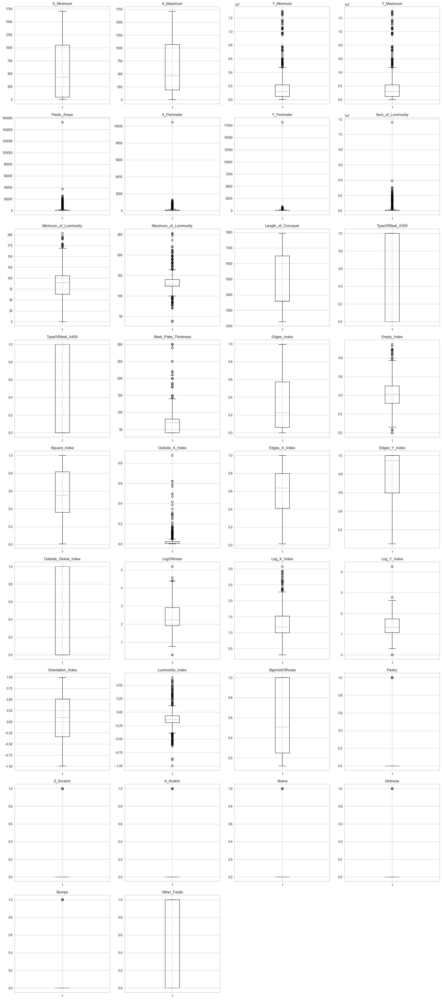

In [36]:
# Menghitung jumlah kolom dalam DataFrame
num_columns = df_cleaned.shape[1]

# Menentukan jumlah baris dan kolom untuk grid
rows = np.ceil(num_columns / 4).astype(int)
cols = 4

# Membuat subplots 
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 5))
axes = axes.flatten()

# Melakukan iterasi 
i = 0 
for column in df_cleaned.columns:
    if pd.api.types.is_numeric_dtype(df_cleaned[column]):
        axes[i].boxplot(df_cleaned[column])
        axes[i].set_title(column)
        i += 1

for j in range(i, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### ***a. Capping or Censoring Method***


Metode ini digunakan untuk menangani outlier dengan membatasi distribusi data dengan menetapkan batas atas _(upper bound)_ atau batas bawah _(lower bound)_ untuk nilai-nilai data. Dengan metode ini dapat mempertahankan jumlah sampel karena nilai outlier nya hanya dibatasi dan tetap dipertahankan dalam dataset sehingga menghindari kehilangan informasi yang mungkin penting.

In [39]:
# menentukan kolom yang memiliki low variation
low_var_cols_skewed = ['Pastry', 'Z_Scratch', 'K_Scatch', 'Stains', 'Dirtiness', 'Bumps']

# Menghapus kolom yang memiliki low variation dari kolom skewed
for column in low_var_cols_skewed:
    kolom_skewed.remove(column)

**Penjelasan:**

Kode tersebut untuk mengeluarkan kolom dengan variasi rendah dari kolom data yang tidak berdistribusi normal untuk tidak diikutsertakan handling outlier. Hal ini karena rentang nilai nya tidak terlalu jauh dari mean/median sehingga tidak diperlukan handling outlier dan memfokuskan handling outlier untuk high variation.



##### **Capping Untuk Distribusi Normal**

In [37]:
# Metode Capping Data Distribusi Normal
winsorizer_dist_normal = Winsorizer(capping_method='gaussian',
                            tail='both',
                            fold=3,
                            variables=kolom_normal,
                            missing_values='ignore')  # Mengabaikan nilai missing value

# Melakukan fitting dan transforming pada kolom berdistribusi normal
data_capped = winsorizer_dist_normal.fit_transform(df_cleaned)


**Penjelasan:**

Kode tersebut menangani outlier dengan `metode Gaussian` dengan nilai `fold = 3` untuk kolom data yang berdistribusi normal.


##### **Capping Untuk Distribusi Tidak Normal**

In [40]:
# Metode Capping Data Tidak Distribusi Normal
winsorizer_skewed = Winsorizer(capping_method='iqr',
                               tail='both',
                               fold=1.5,
                               variables=kolom_skewed,
                               missing_values='ignore')

# Melakukan fitting dan transforming pada kolom tidak berdistribusi normal
data_capped = winsorizer_skewed.fit_transform(df_cleaned)

**Penjelasan:**

Kode tersebut menangani outlier dengan `metode iqr` dengan nilai `fold=1.5` untuk kolom data yang tidak berdistribusi normal.


In [41]:
# Menambahkan kembali kolom-kolom dengan low variation ke dalam kolom skewed
for column in low_var_cols_skewed:
    kolom_skewed.append(column)


**Penjelasan:**

Setelah kolom dengan varian rendah dikembalikan ke kolom dengan data yang tidak berdistribusi normal, maka dilakukan pembuatan visualisasi data dan analisis lebih lanjut.

### **b. Visualisasi Data Setelah di Handling Outlier**

In [42]:
sns.set_theme()

# Plot Distribution 
def outlier_handling_plot_comparison(df_before, df_after, variable):

    # Mengatur Ukuran
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle(f'{variable} - Distribution Before and After Outlier Handling')

    # Plot Histogram Before
    sns.histplot(df_before[variable], bins=30, ax=axes[0, 0], color='skyblue')
    axes[0, 0].set_title('Histogram Before')

    # Plot Boxplot Before
    sns.boxplot(y=df_before[variable], ax=axes[1, 0], color='lightgreen')
    axes[1, 0].set_title('Boxplot Before')

    # Plot Histogram After
    sns.histplot(df_after[variable], bins=30, ax=axes[0, 1], color='skyblue')
    axes[0, 1].set_title('Histogram After')

    # Plot Boxplot After
    sns.boxplot(y=df_after[variable], ax=axes[1, 1], color='lightgreen')
    axes[1, 1].set_title('Boxplot After')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

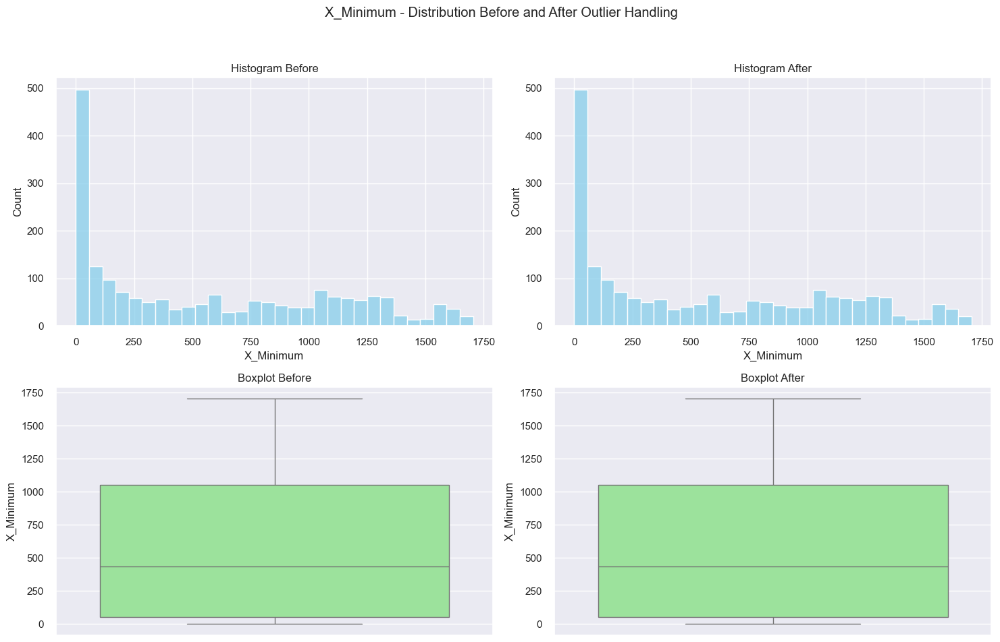

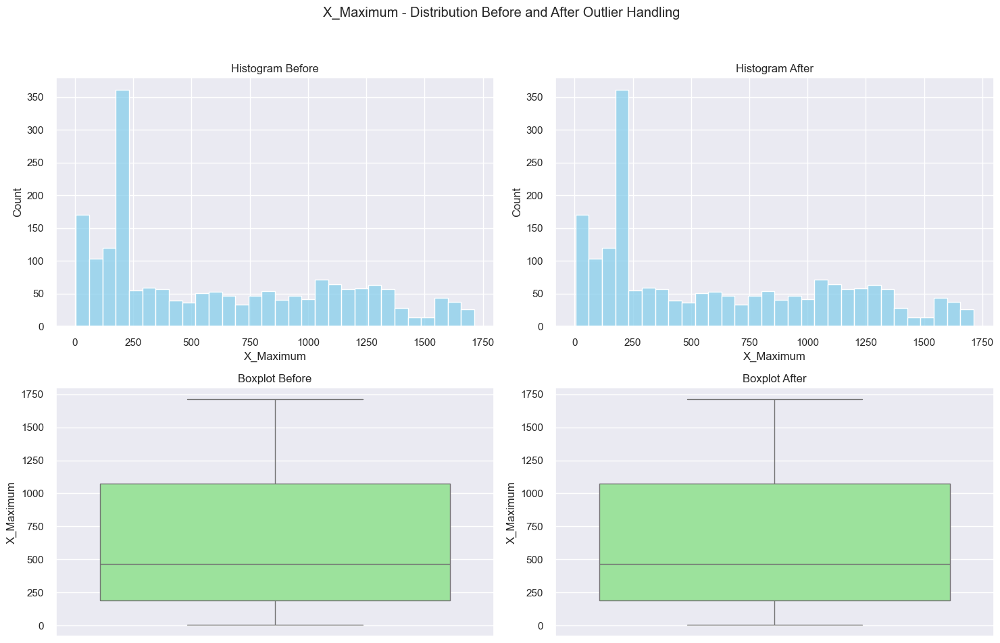

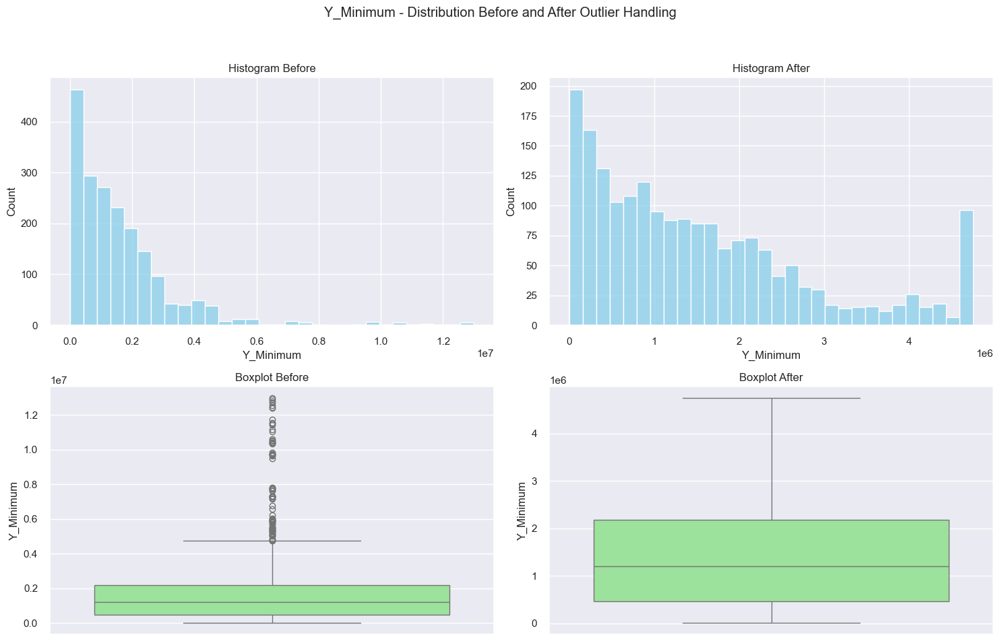

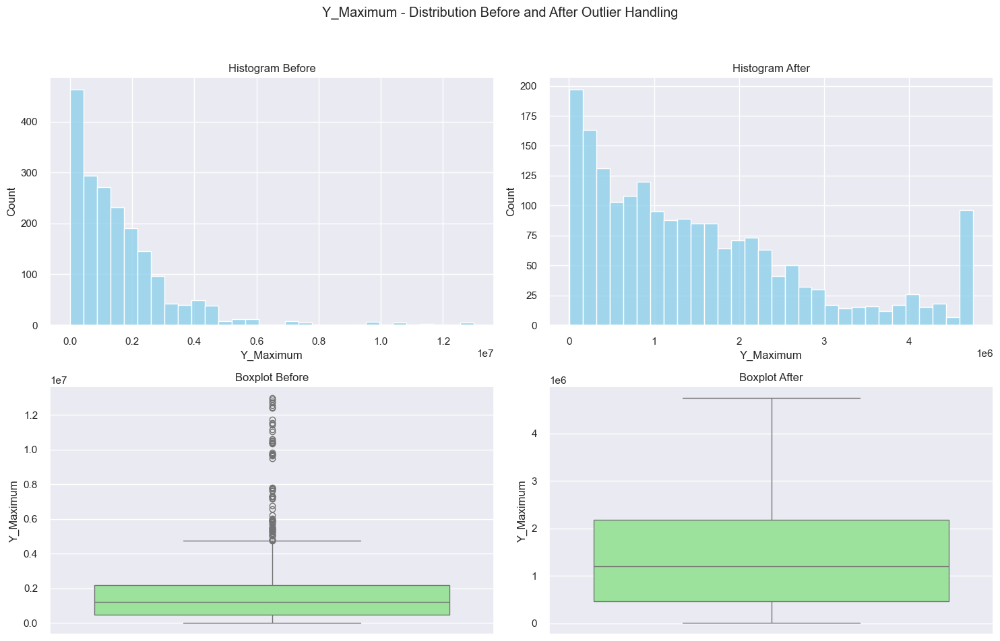

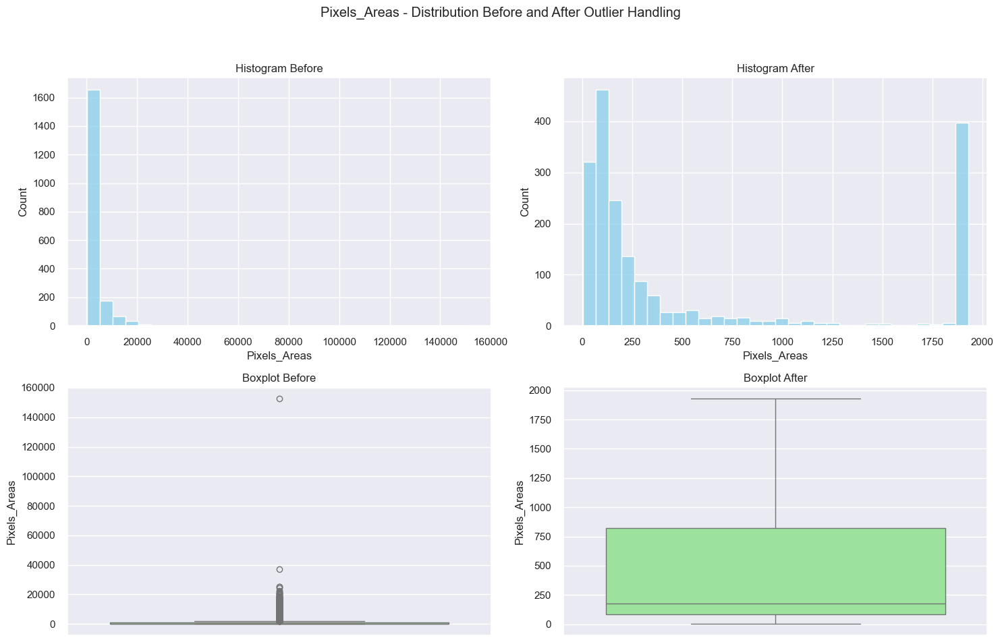

...

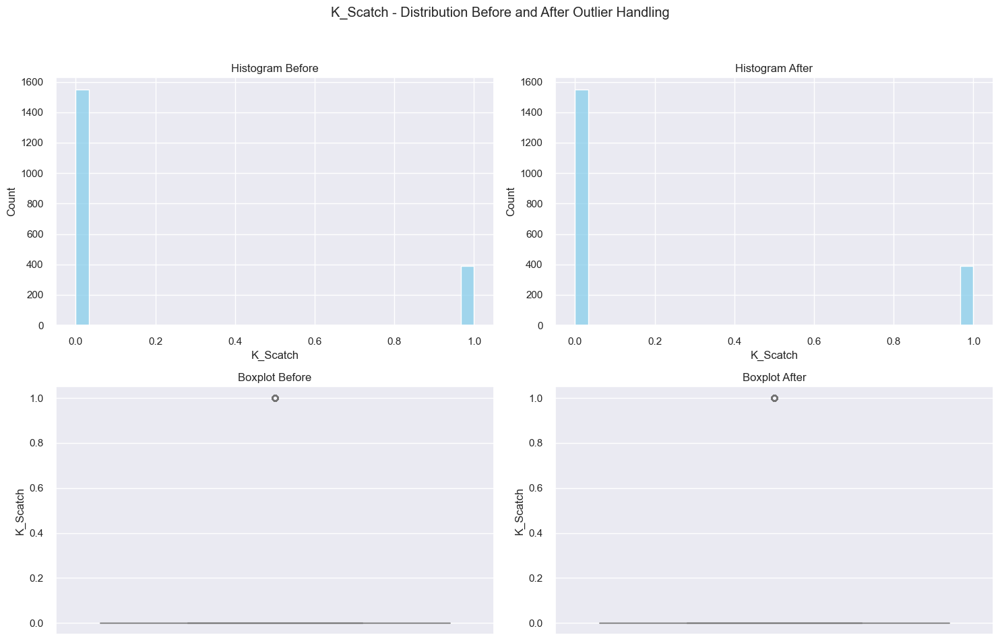

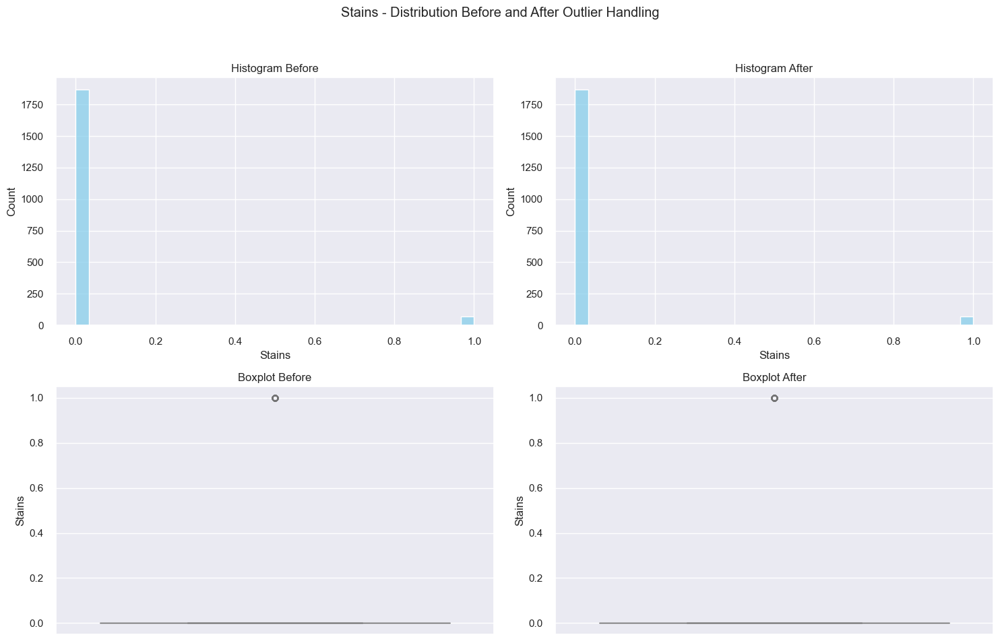

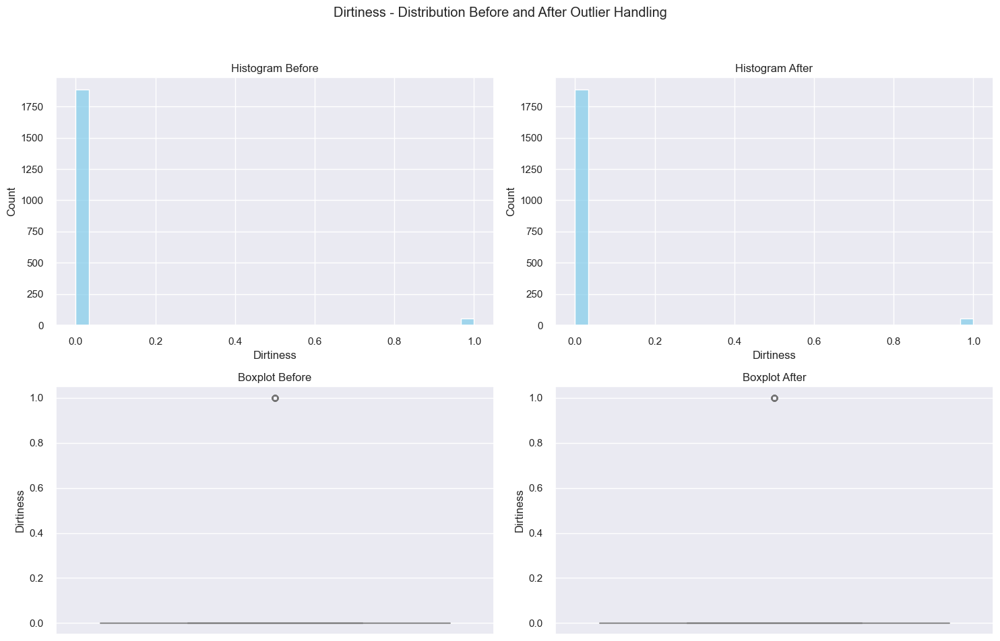

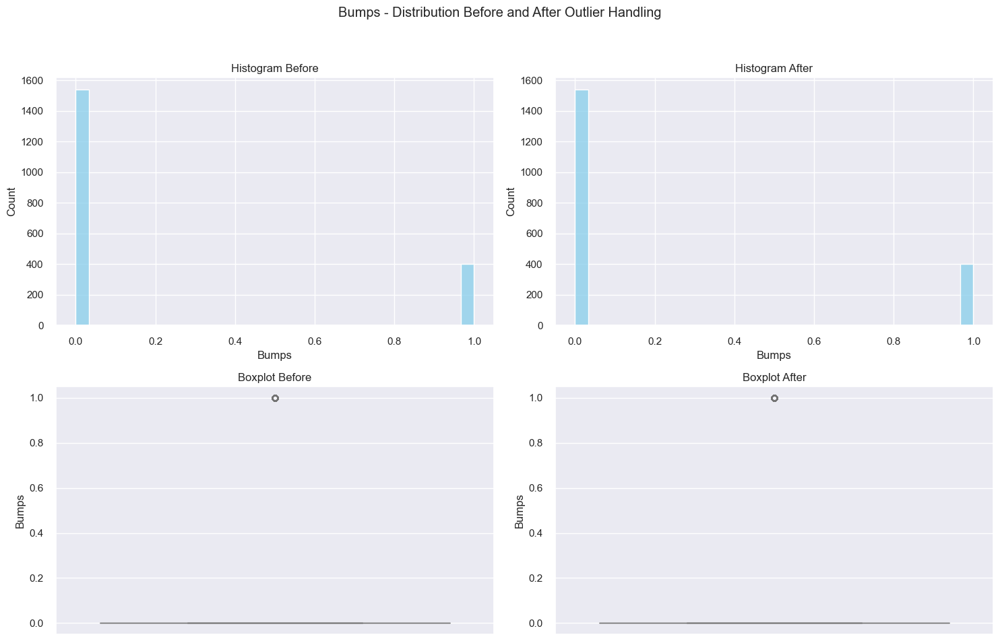

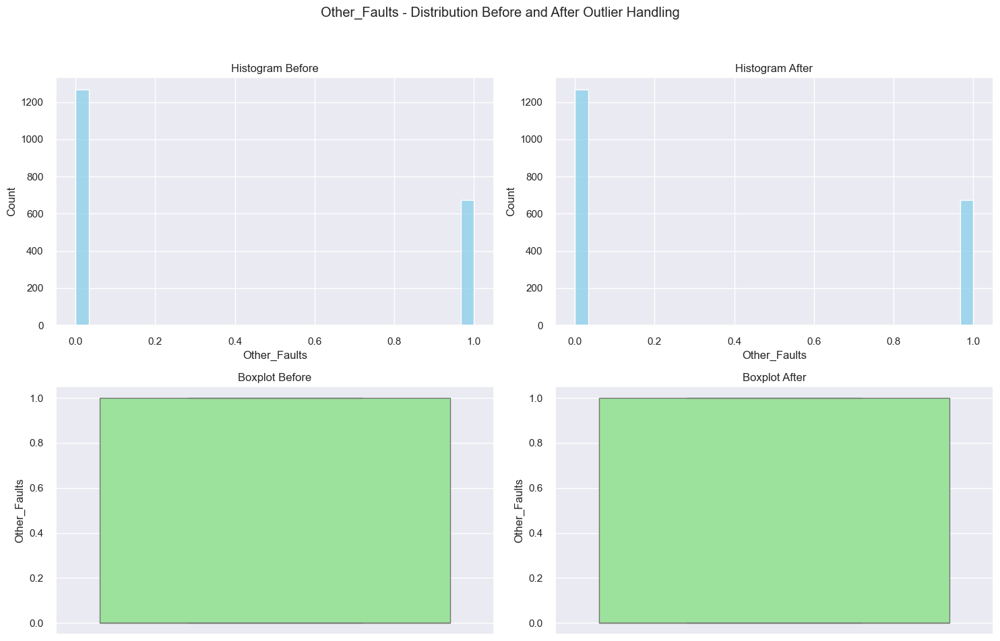

In [ ]:
# Memanggil fungsi outlier_handling_plot_comparison()
num_cols = df_cleaned
for col in num_cols:
    outlier_handling_plot_comparison(df_cleaned, data_capped, col)

## **5.2 Feature Selection**

### ***5.2.1 Hopkins Statistic***

- Hopkins Statistic merupakan metrik yang digunakan untuk mengetahui clustering pada dataset. Digunakan untuk menentukan apakah data memiliki pola cluster atau data nya tersebar.

In [43]:
# Hopkins Statistic 
def hopkins(X):
    d = X.shape[1]
    n = len(X) 
    m = int(0.1 * n) 
    nbrs = NearestNeighbors(n_neighbors=1).fit(X.values)
 
    rand_X = sample(range(0, n, 1), m)
 
    ujd = []
    wjd = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, return_distance=True)
        ujd.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(X.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
        wjd.append(w_dist[0][1])
 
    H = sum(ujd) / (sum(ujd) + sum(wjd))
    if isnan(H):
        print(ujd, wjd)
        H = 0
 
    return H

**Penjelasan:**

Kode diatas digunakan untuk menghitung _Hopkins Statistic_ yang berguna untuk mengetahui kecenderungan clustering pada dataset. 

In [44]:
# Periksa data apakah data dapat di clustering
Num_features =data_capped.select_dtypes(include=[np.number]).columns
hopkins(data_capped[Num_features])

0.9910287286478416

**Penjelasan:**

- Nilai Hopkins > 0.5: Data mungkin memiliki struktur klaster yang signifikan.

- Nilai Hopkins = 0.5: Data kemungkinan bersifat acak.

- Nilai Hopkins < 0.5: Data mungkin terdistribusi secara acak atau memiliki pola yang tidak terstruktur



    - Berdasarkan hasil analisis diketahui memiliki nilai `0.99` yang artinya data cenderung memiliki cluster yang signifikan secara statistik.  


### ***5.2.2 Robust Scaler***

- Robust Scaler merupakan teknik skala yang menghilangkan median dari data dan menskalakan data dengan _Interquartile Range_ (IQR).

In [45]:
# Membuat objek scaler StandardScaler
scaler = RobustScaler()

#Fit_transform untuk x_train, transform untuk x_test
data_scaled = scaler.fit_transform(data_capped)


**Penjelasan:**


Meskipun outlier sudah di handling menggunakan capping, namun masih ada nilai outlier dan terdapat beberapa kolom dengan distribusi data tidak normal (_skewness_) sehingga menggunakan ` RobustScaling` untuk memastikan fitur memiliki kontribusi yang seimbang dalam proses clustering. Selain itu. `RobustScaling` lebih tahan terhadap pengaruh outlier.


### ***5.2.3 Principal Component Analysis (PCA)***

- Principal Component Analysis (PCA) merupakan teknik reduksi dimensi yang sangat berguna dalam model clustering. Kegunaan PCA pada model clustering, yaitu:
 
  -  Mengurangi jumlah fitur pada dataset dan mengubahnya menjadi beberapa komponen utama yang tetap mempertahankan sebagian besar variabilitas data asli.

  - Menghilangkan redundansi karena dataset memiliki beberapa fitur independen.

  - Mengurangi noise dan meningkatkan interpretabilitas hasil.

In [46]:
# Proses PCA
pca = PCA()
pca.fit(data_scaled)


PCA()

**Penjelasan:**

Kode tersebut untuk melakukan proses PCA dan fit pada data yang telah dilakukan scaling. 

**Explained Variance Ratio:**


In [47]:
# Menghitung Explained Variance Ratio
pca = PCA()
pca.fit(data_scaled)
pca.explained_variance_ratio_

array([4.67222695e-01, 1.22506106e-01, 8.99637522e-02, 6.06018672e-02,
       4.44673025e-02, 3.62248832e-02, 3.21851590e-02, 2.83954632e-02,
       1.80523220e-02, 1.67630989e-02, 1.45912743e-02, 1.13730265e-02,
       9.40284099e-03, 9.13518460e-03, 7.74397706e-03, 6.22415729e-03,
       5.12001368e-03, 3.38689462e-03, 3.15123937e-03, 2.76598576e-03,
       2.36154560e-03, 1.94896101e-03, 1.64063356e-03, 1.26495075e-03,
       1.12144117e-03, 9.20986498e-04, 7.13171351e-04, 3.10181952e-04,
       2.87451440e-04, 1.28361273e-04, 2.50704984e-05, 6.84941351e-10,
       2.80919727e-33, 2.80919727e-33])

**Penjelasan:**

Berdasarkan hasil analisis tersebut diketahui bahwa terdapat 34 fitur yang masing-masing memiliki proporsi varians yang berbeda-beda setiap komponen. Komponen PCA 1 `(0.467)` memiliki varians yang paling tinggi dibandingkan PCA 2 - PCA 34. Nilai yang lebih tinggi menunjukkan bahwa fitur tersebut memiliki kontribusi yang lebih besar terhadap informasi yang dikandung oleh komponen utama



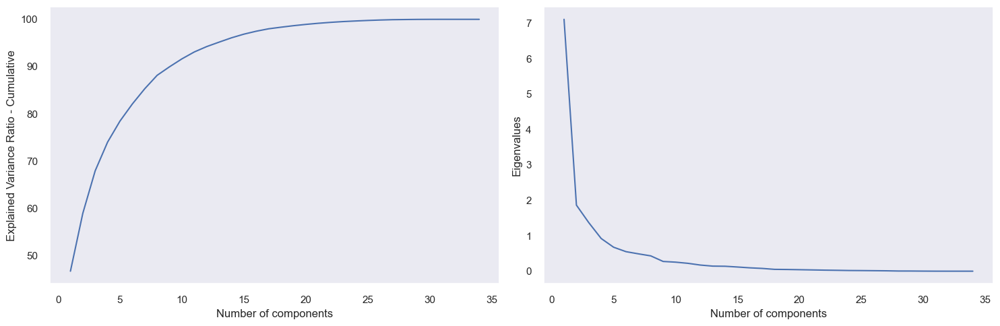

In [48]:
# Number of components
n_components = len(pca.explained_variance_ratio_)

# Visualisasi Data Cumulative Explained Variance Ratio
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.grid()
plt.plot(range(1, n_components + 1), np.cumsum(pca.explained_variance_ratio_ * 100))
plt.xlabel('Number of components')
plt.ylabel('Explained Variance Ratio - Cumulative')

# Visualisasi Data Eigenvalues
# Plot the Eigenvalues
plt.subplot(1, 2, 2)
plt.grid()
plt.plot(range(1, n_components + 1), pca.explained_variance_)
plt.xlabel('Number of components')
plt.ylabel('Eigenvalues')

plt.tight_layout()
plt.show()


In [53]:
# Looping untuk nilai proporsi varians 
explained_variances = [0.98, 0.95, 0.925, 0.90, 0.875, 0.85, 0.80]
results = []

for explained_variance in explained_variances:
    pca = PCA(n_components=explained_variance)
    data_scaled_pca = pca.fit_transform(data_scaled)
    
    
    print(f'Proportion of Variance Explained: {explained_variance}')
    print('Dimensions                      :', data_scaled_pca.shape)
    print('Number of Components            :', pca.n_components_, 'Components')
    
    # Train K-Means model dengan n_clusters = 2 sebagai contoh
    kmeans = KMeans(n_clusters=2, init='k-means++', max_iter=300, n_init=10, random_state=42)
    pred = kmeans.fit_predict(data_scaled_pca)
    
    # Mebghitung silhouette score
    silhouette_avg = silhouette_score(data_scaled_pca, pred)
    results.append((explained_variance, pca.n_components_, silhouette_avg))
    
    print(f'Silhouette Score: {silhouette_avg}\n')


Proportion of Variance Explained: 0.98
Dimensions                      : (1941, 18)
Number of Components            : 18 Components
Silhouette Score: 0.42982028475796424

Proportion of Variance Explained: 0.95
Dimensions                      : (1941, 13)
Number of Components            : 13 Components
Silhouette Score: 0.44129428776414154

Proportion of Variance Explained: 0.925
Dimensions                      : (1941, 11)
Number of Components            : 11 Components
Silhouette Score: 0.4483982645777535

Proportion of Variance Explained: 0.9
Dimensions                      : (1941, 10)
Number of Components            : 10 Components
Silhouette Score: 0.45490920426600473

Proportion of Variance Explained: 0.875
Dimensions                      : (1941, 8)
Number of Components            : 8 Components
Silhouette Score: 0.47002184653653484

Proportion of Variance Explained: 0.85
Dimensions                      : (1941, 7)
Number of Components            : 7 Components
Silhouette Score:

**Penjelasan:**

Kode tersebut digunakan untuk mengetahui berapa jumlah komponen yang diperlukan untuk mempertahankan informasi sebesar 98%, 95%, 92,5%, 90%, 87,5%, 85% dan 80% dan mengetahui nilai `Silhouette Score` dari setiap komponen. 

In [54]:
# Hasil ringkasan
results_df = pd.DataFrame(results, columns=['Explained Variance', 'Number of Components', 'Silhouette Score'])
display(results_df)

,Explained Variance,Number of Components,Silhouette Score
0,0.980,18,0.429820
1,0.950,13,0.441294
2,0.925,11,0.448398
3,0.900,10,0.454909
4,0.875,8,0.470022
5,0.850,7,0.483001
6,0.800,6,0.499470


**Penjelasan:**

- Explained Variance: Mengukur seberapa baik komponen-komponen yang dipilih menjelaskan variasi total dalam data. Semakin tinggi explained variance, semakin banyak informasi yang dipertahankan dari data asli.

- Silhouette Score: Mengukur kualitas klasterisasi, di mana nilai yang lebih tinggi menunjukkan klaster yang lebih baik.Silhouette Score berkisar antara -1 hingga +1, di mana:
    - +1: Indikasi bahwa objek sangat cocok dengan klasternya sendiri dan jauh dari klaster lainnya.
    -  0: Objek berada di batas antara dua klaster.
    - -1: Indikasi bahwa objek mungkin salah klaster karena lebih dekat dengan klaster lain.

- Berdasarkan ringkasan tersebut, kami memutuskan untuk mempertahankan informasi sebesar 85% dengan jumlah komponen sebanyak 7 dan nilai `Silhouette Score` sebesar 0.48. Hal ini dikarenakan ingin mempertahankan sebagian besar informasi dalam data dan juga ingin meningkatkan kualitas klasterisasi.


In [55]:
# Memilih 7 komponen dari hasil analisis)
pca = PCA(n_components=7)
data_scaled_pca = pca.fit_transform(data_scaled)

# Membuat DataFrame dari hasil PCA dengan 7 komponen
principalDf = pd.DataFrame(data = data_scaled_pca,
                           columns = ['principal component 1', 'principal component 2', 
                                      'principal component 3', 'principal component 4', 
                                      'principal component 5', 'principal component 6', 
                                      'principal component 7'])

principalDf.head()

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6,principal component 7
0,-1.253758,-2.426265,1.047561,-0.442221,-0.653721,-0.564158,-0.914954
1,-1.977626,-1.194553,-0.260789,1.122833,0.102142,0.095159,-0.414385
2,-2.472430,-0.607898,0.255373,0.475165,0.302481,0.546196,-0.464915
3,-1.668829,-0.877298,1.968578,0.520622,0.411289,0.324441,0.235458
4,2.337702,-2.179201,2.525445,1.195146,0.257690,1.481392,0.103081


In [56]:
# Periksa jumlah fitur yang ingin mempertahankan informasi sebesar 85%
pca = PCA(n_components=0.85)
data_scaled_pca = pca.fit_transform(data_scaled)

print('Dimensions                                      :',data_scaled_pca.shape)
print('Number of Components                            :',pca.n_components_,'Components','\n')

# Menampilkan explained_variance_ratio_ untuk setiap komponen
explained_variance_ratio = pca.explained_variance_ratio_


print('Explains variation summation for each component:')
for idx, ratio in enumerate(explained_variance_ratio):
     print(f"Component {idx}: {ratio:}",'\n')

print('Explained variation summation for all components: {}'.format(sum(pca.explained_variance_ratio_)),'\n')
print("Jumlah Fitur Original:", data_scaled.shape[1], 'features\n')
print("Jumlah Fitur setelah PCA:", data_scaled_pca.shape[1], 'features\n')



Dimensions                                      : (1941, 7)
Number of Components                            : 7 Components 

Explains variation summation for each component:
Component 0: 0.46722269537755523 

Component 1: 0.12250610640454038 

Component 2: 0.08996375223930217 

Component 3: 0.06060186715430273 

Component 4: 0.04446730246158693 

Component 5: 0.036224883247695135 

Component 6: 0.03218515901340147 

Explained variation summation for all components: 0.8531717658983841 

Jumlah Fitur Original: 34 features

Jumlah Fitur setelah PCA: 7 features



**Penjelasan:**

- Kami memutuskan untuk mempertahankan informasi sebesar 85% dengan sebanyak 7 komponen dan proporsi total total varians sebesar 0.85.

- Setiap komponen memiliki varians yang berbeda-beda dan komponen 0 memiliki varians yang paling tinggi sedangkan komponen 6 memiliki variang yang paling rendah. 


# **6. Model Definition & Training**

## **6.1 Elbow Method**

- Metode Elbow merupakan salah satu metode yang digunakan untuk menentukan jumlah cluster terbaik pada proses clustering sehingga dapat memaksimalkan kualitas hasil cluster.

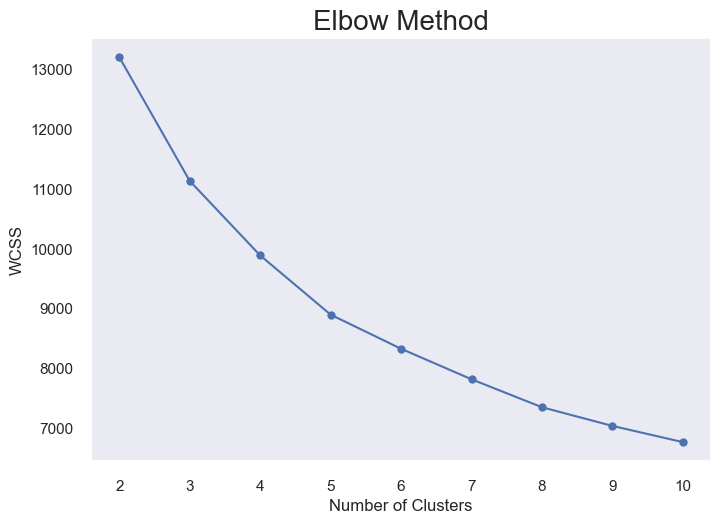

In [57]:
# Menentukan n cluster yang optimal berdasarkan Elbow Method

wcss = []
random_state = 30
max_cluster = 10
for i in range(2, max_cluster+1):
    km = KMeans(n_clusters = i,
                init = 'k-means++',
                max_iter = 300,
                n_init = 10,
                random_state = random_state)
    km.fit(data_scaled_pca)
    wcss.append(km.inertia_)

plt.plot(range(2, max_cluster+1), wcss, marker ="o")
plt.grid()
plt.title('Elbow Method', fontsize = 20)
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

**Penjelasan:**

- Berdasarkan visuaslisasi data dengan metode elbow bahwa jumlah cluster yang optimal adalah 5 cluster. Langkah selanjutnya yaitu dilakukan metode `Silhoutte Plot & Score` sebelum pemilihan final pada jumlah cluster yang optimal. 


## **6.2 Silhoutte Score & Silhoutte Plot**

- Silhouette Score digunakan untuk menemukan jumlah cluster yang memiliki nilai yang paling tinggi yang artinya bahwa cluster tersebut memiliki pemisahan yang baik. 

- Silhoutte plot yaitu memberikan visualisasi data dari hasil Silhouette Score.

In [58]:
def plot_silhouette(range_n_clusters, X, random_state):
    for n_clusters in range_n_clusters:

         # Membuat subplot
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 4)

        ax1.set_xlim([-0.1, 1])
        
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        
        clusterer = KMeans(n_clusters = n_clusters, init = 'k-means++', max_iter = 300, n_init = 10, random_state = random_state)
        cluster_labels = clusterer.fit_predict(X)

        
        silhouette_avg = silhouette_score(X, cluster_labels)
        print("For n_clusters =", n_clusters,
              "The average silhouette_score is :", silhouette_avg)


        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

           
            y_lower = y_upper + 10  

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

       
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

   
        centers = clusterer.cluster_centers_

        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n_clusters = %d" % n_clusters),
                     fontsize=14, fontweight='bold')

**Penjelasan:**

Kode tersebut yaitu membuat fungsi untuk menampilkan silhoutte score dan plot

For n_clusters = 2 The average silhouette_score is : 0.4830014728137272
For n_clusters = 3 The average silhouette_score is : 0.26643466662754994
For n_clusters = 4 The average silhouette_score is : 0.26011113298835753
For n_clusters = 5 The average silhouette_score is : 0.254893996428701
For n_clusters = 6 The average silhouette_score is : 0.23867818347581024
For n_clusters = 7 The average silhouette_score is : 0.24490960001248074
For n_clusters = 8 The average silhouette_score is : 0.24051046169014448
For n_clusters = 9 The average silhouette_score is : 0.1954821105974593


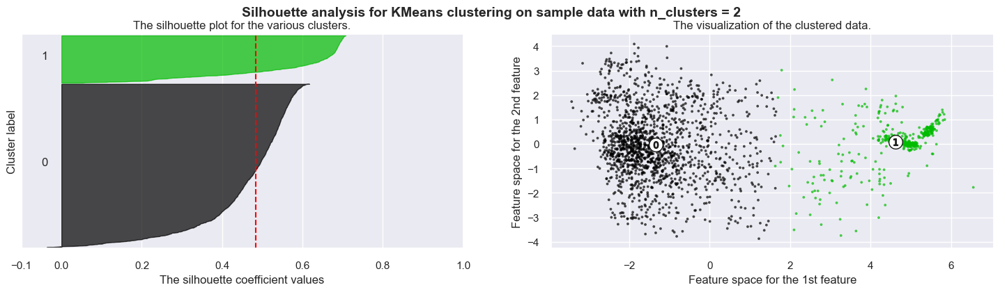

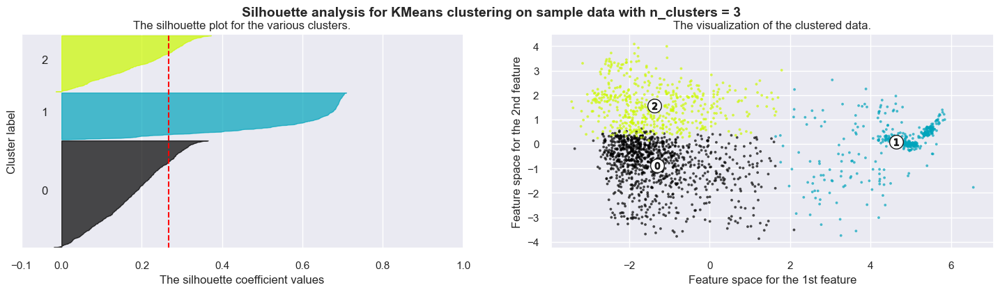

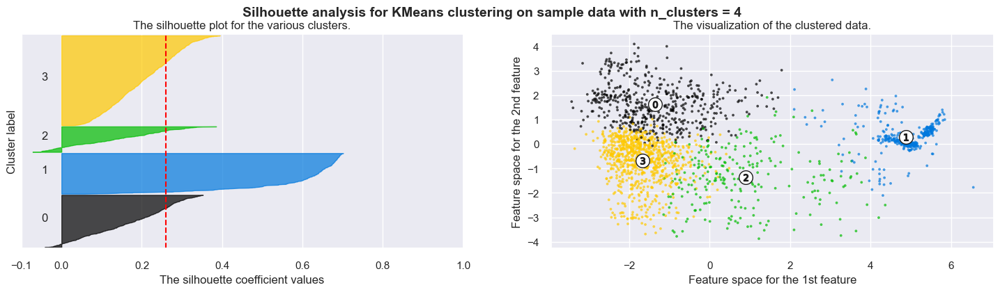

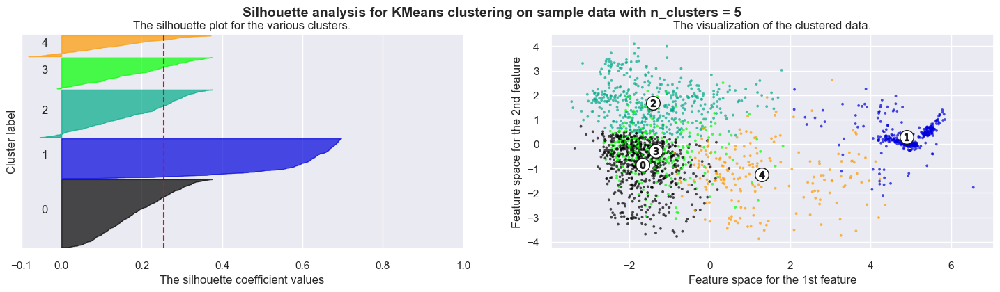

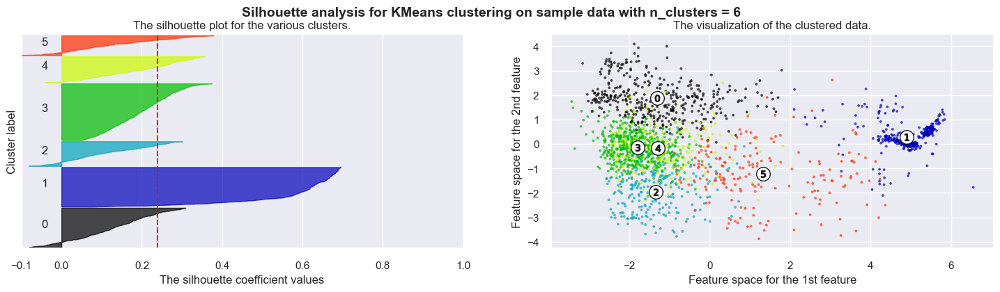

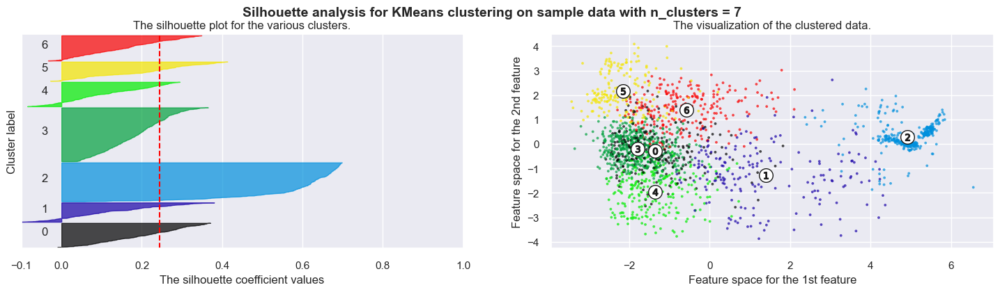

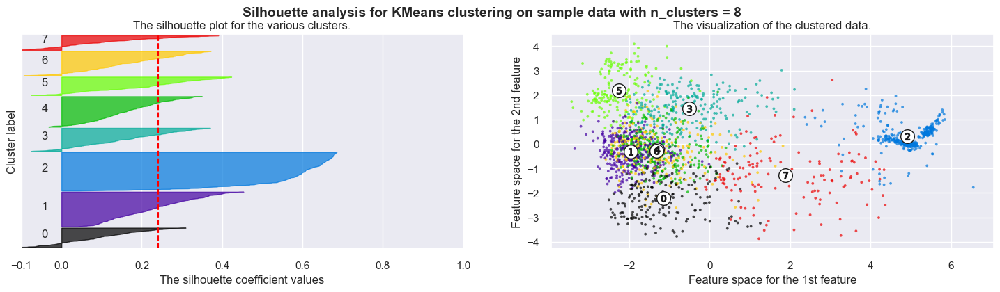

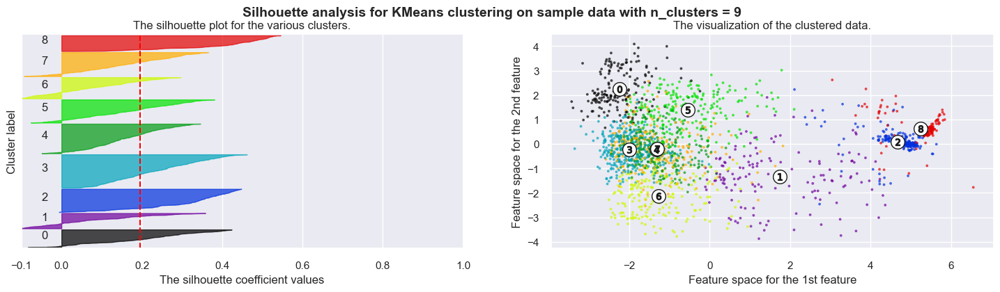

In [59]:
# Menampilkan nilai Silhouette Score dan Visualisasi Silhouette Plot

plot_silhouette(range(2, max_cluster), data_scaled_pca, random_state)

**Penjelasan:**
- Berdasarkan perhitungan nilai Silhouette Score diketahui bahwa `n_cluster = 2 (0.48)` memiliki nilai Silhouette Score yang tinggi dibandingkan n_cluster yang lain. 

- Diketahui bahwa nilai `Silhouette score antara 0.3 dan 0.5` menunjukkan cluster yang cukup baik meskipun ada kemungkinan tumpang tindih antara cluster. 


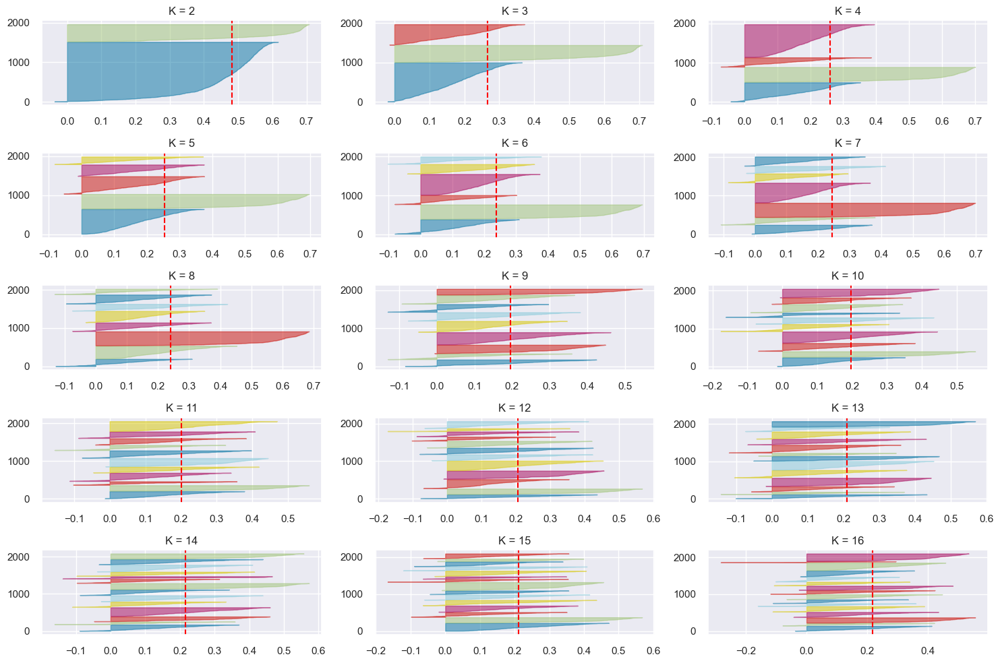

In [60]:
# Menampilkan Silhouette Plot dengan warna 'Yellowbrik'
fig, axes = plt.subplots(5, 3, figsize=(15, 10))

# Loop for each plot
for i, ax in enumerate(axes.flatten()):

    # Initialize K-means clustering
    n_clusters = i + 2
    kmeans = KMeans(n_clusters = n_clusters, init = 'k-means++', max_iter = 300, n_init = 10, random_state = random_state)

    # Create SilhouetteVisualizer
    visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick', ax=ax)

    # Fit visualizer to data
    visualizer.fit(data_scaled_pca)

    # Set title
    ax.set_title(f'K = {n_clusters}')

# Adjust layout
plt.tight_layout()
plt.show()

**Penjelasan:**
- Berdasarkan hasil plot sebaran cluster, memutuskan untuk memilih  n_clusters =  2


## **6.3 K-Means**

In [61]:
model_kmeans = KMeans(n_clusters=2, init='k-means++', max_iter=300, n_init=10, random_state=random_state)
pred = model_kmeans.fit_predict(data_scaled_pca)
    
# Menghitung Silhouette Score dan Davies-Bouldin Score
print(f"Silhouette Score: {silhouette_score(data_scaled_pca, pred)}")
print('Davies-Bouldin Score: ',davies_bouldin_score(data_scaled_pca, pred))

Silhouette Score: 0.4830014728137272
Davies-Bouldin Score:  0.7747826844396085


**Penjelasan:**

- Berdasarkan hasil tersebut diketahui bahwa nilai `Silhouette Score` pada n_cluster = 2 sebesar 0.48. Hal ini menunjukkan bahwa data dalam cluster cukup baik dan ada kemungkinan tumpang tindih antara cluster. 

- Apabila `Silhouette Score`antara 0.3 dan 0.5 menunjukkan clustering yang cukup baik meskipun ada kemungkinan tumpang tindih antara cluster. 

- Nilai `Davies-Bouldin Score` sebesar 0.77 menunjukkan bahwa cluster cukup terpisah dengan baik satu sama lain. Meskipun semakin rendah nilai nya atau mendekati nilai 0 yang menunjukkan cluster lebih terpisah satu sama lain dengan baik.


**Visualisasi Data**

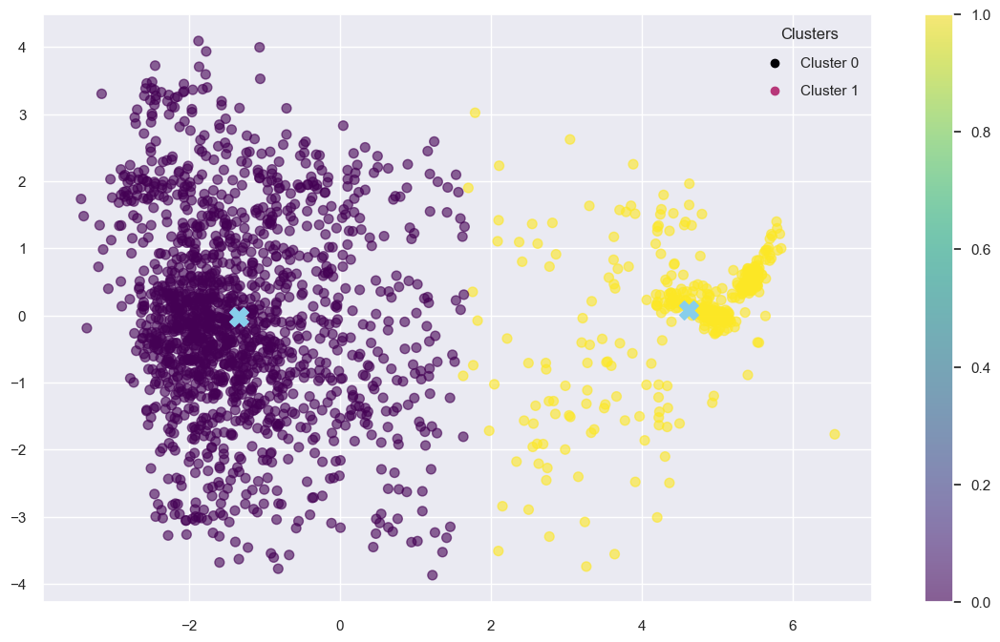

In [62]:
sns.set(style="darkgrid")

# Membuat scatter plot
plt.figure(figsize=(14, 8))
scatter = plt.scatter(data_scaled_pca[:, 0], data_scaled_pca[:, 1], c=pred, s=50, cmap='viridis', alpha=0.6)

centers = model_kmeans.cluster_centers_
for center in centers:
    plt.scatter(center[0], center[1], c='skyblue', s=200, alpha=1.00, marker='X')

# Menambahkan legend 
legend_labels = [f'Cluster {i}' for i in range(2)]
for i in range(2):
    plt.scatter([], [], c=sns.color_palette('magma', as_cmap=True)(i / 2), label=legend_labels[i])
plt.legend(scatterpoints=1, frameon=False, labelspacing=1, title="Clusters")

# Menambahkan colorbar
plt.colorbar(scatter)
plt.show()

# **7. Model Evaluation**

In [63]:
# Menggabungkan hasil clustering dengan original dataset
df_clustered = pd.concat([df_cleaned.reset_index().drop('index', axis=1), 
                          pd.Series(pred, name='Cluster_Defect', dtype='object')],
                          axis=1)

df_clustered.head()

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,...,Luminosity_Index,SigmoidOfAreas,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults,Cluster_Defect
0,42,50,270900,270944,267,17,44,24220,76,108,...,-0.2913,0.5822,1,0,0,0,0,0,0,0
1,645,651,2538079,2538108,108,10,30,11397,84,123,...,-0.1756,0.2984,1,0,0,0,0,0,0,0
2,829,835,1553913,1553931,71,8,19,7972,99,125,...,-0.1228,0.2150,1,0,0,0,0,0,0,0
3,853,860,369370,369415,176,13,45,18996,99,126,...,-0.1568,0.5212,1,0,0,0,0,0,0,0
4,1289,1306,498078,498335,2409,60,260,246930,37,126,...,-0.1992,1.0000,1,0,0,0,0,0,0,1


**Penjelasan:**

Setelah melakukan pemodelan clustering dengan K-Means, yaitu terdapat 2 cluster kemudian cluster tersebut digabungkan dengan DataFrame yang asli dan menambahkan kolom `Cluster Defect`.

## **7.1 Distribusi Setiap Cluster**

In [64]:
# Mengatur warna untuk tiap cluster
custom_palette2 = sns.color_palette("Set3")
colors = [custom_palette2[cluster] for cluster in sorted(df_clustered['Cluster_Defect'].unique())]
custom_palette_kmeans = sns.set_palette(colors)

In [65]:
df_clustered_count = df_clustered.groupby(by=["Cluster_Defect"]).size().reset_index(name="counts")
df_clustered_count

,Cluster_Defect,counts
0,0,1505
1,1,436


**Penjelasan:**

Berdasarkan hasil analisis diketahui bahwa jumlah `cluster 0` sebanyak 1.505 kecacatan baja yang teridentifikasi dan pada `cluster 1` sebanyak 436 kecacatan baja yang teridentifikasi.Hal ini menunjukkan bahwa Cluster 0  merepresentasikan jenis cacat atau karakteristik yang lebih umum ditemukan pada pelat baja dalam dataset ini dibandingkan dengan Cluster 1.


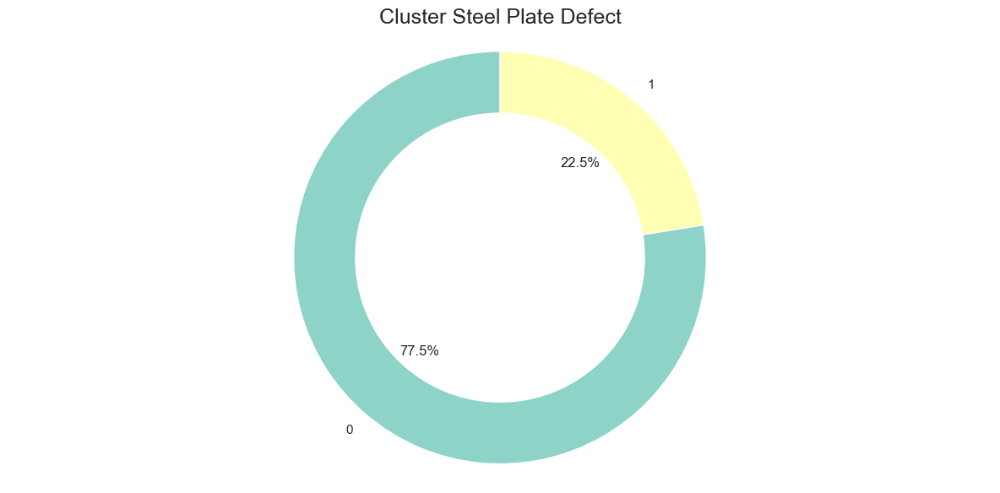

In [66]:
# Visualisasi Data
fig, ax = plt.subplots(figsize=(12, 6))

ax.set_title('Cluster Steel Plate Defect', loc='center', size=18)
kmeans_counts = df_clustered['Cluster_Defect'].value_counts().sort_index()
pie = ax.pie(kmeans_counts, labels=kmeans_counts.index, autopct='%1.1f%%', startangle=90,
             wedgeprops=dict(width=0.4, edgecolor='w'), colors=colors)

centre_circle = plt.Circle((0,0),0.70,fc='white')
fig.gca().add_artist(centre_circle)

plt.axis('equal')
plt.tight_layout()
plt.show()

**Penjelasan:**

Berdasarkan visualisasi data tersebut diketahui bahwa jenis cacat yang dikategorikan dalam cluster 0 (77,5%) adalah yang paling umum atau sering ditemukan, sedangkan cacat dalam cluster 1 (22,5%) lebih jarang atau memiliki karakteristik yang berbeda.

## **7.2 Distribusi Setiap Fitur Berdasarkan Cluster**

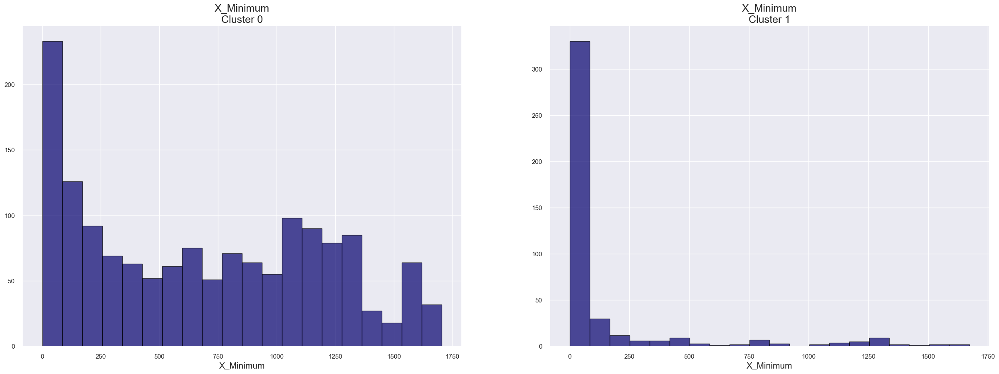

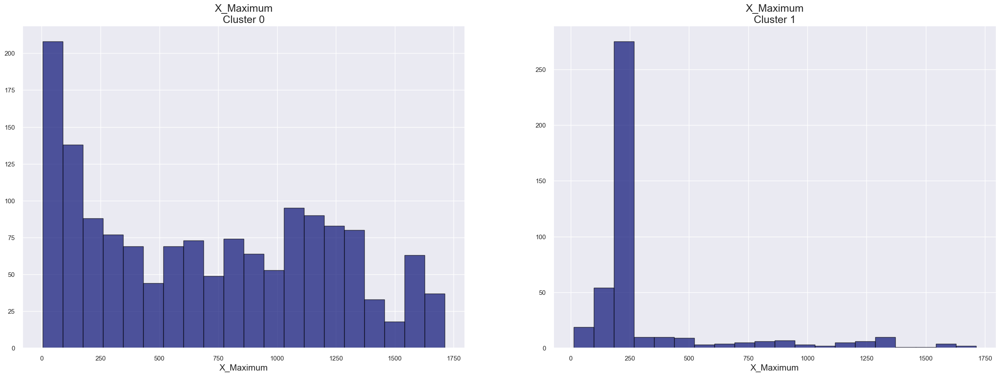

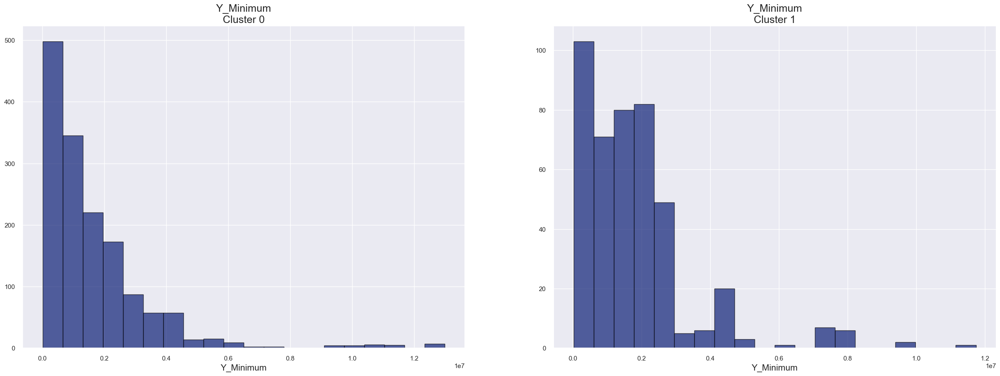

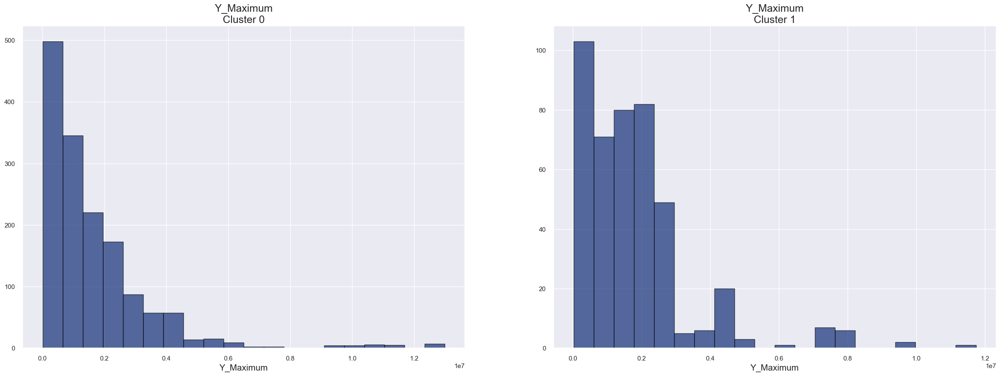

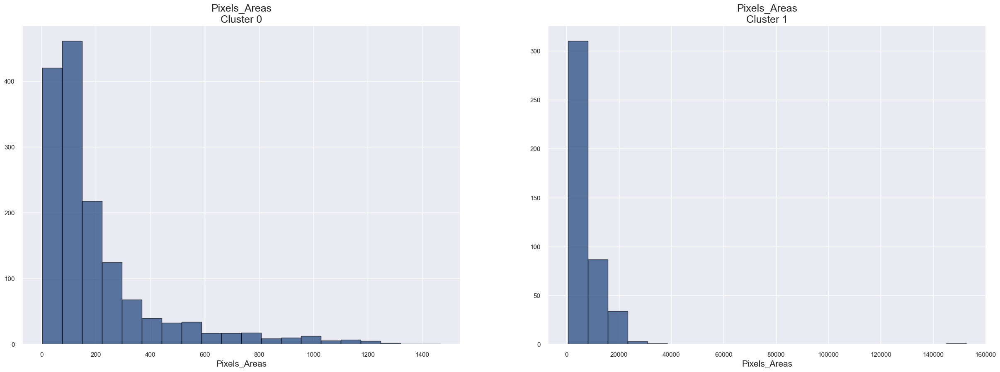

...

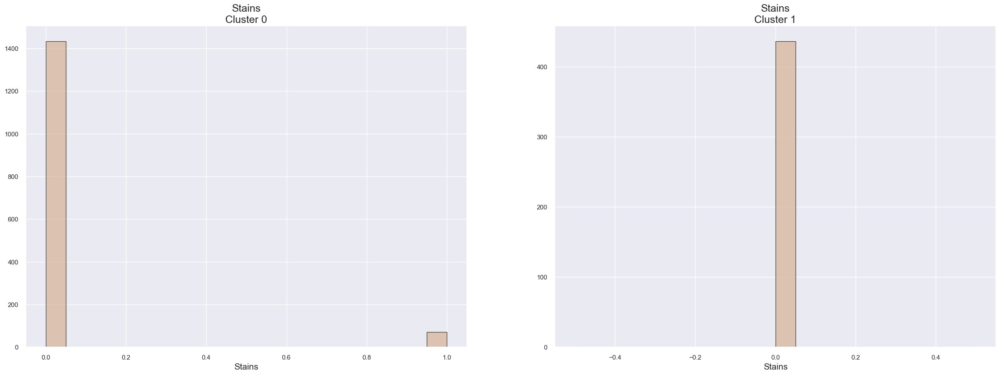

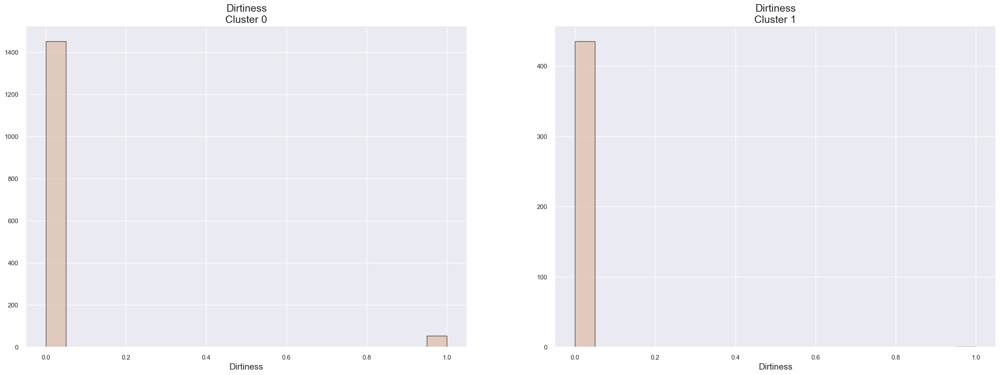

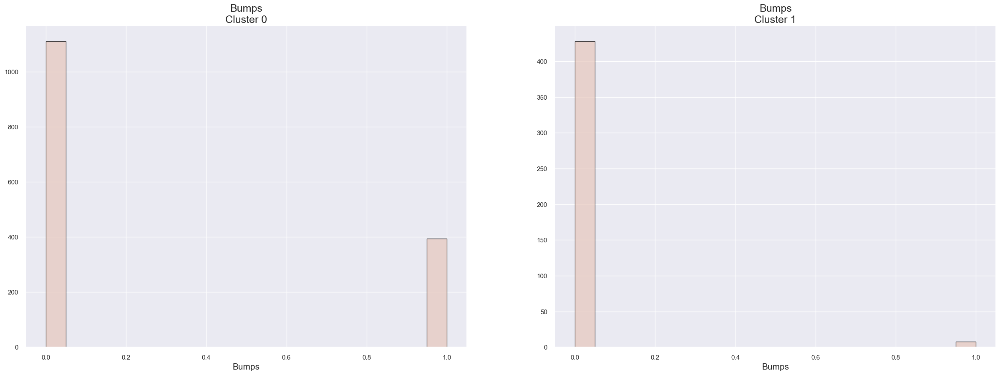

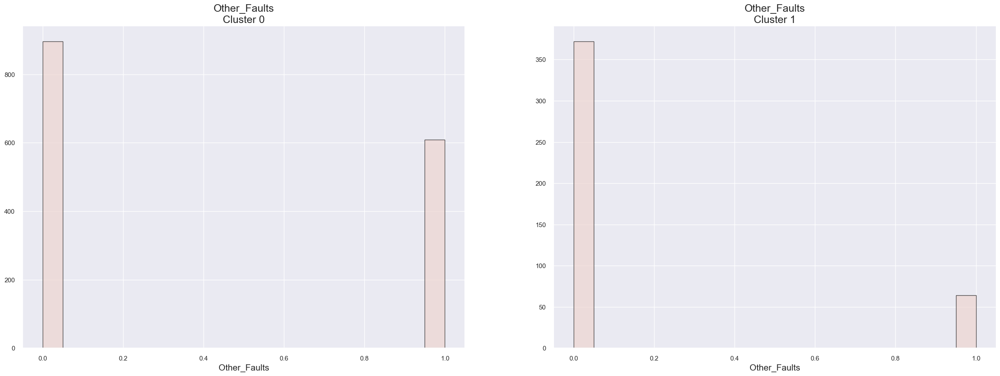

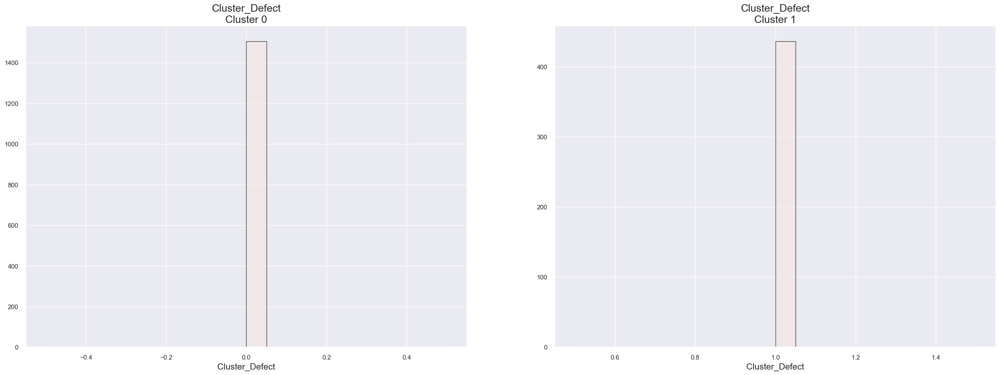

In [67]:
palette = sns.color_palette("gist_earth", len(df_clustered.columns))

# Visualisasi data
for idx, i in enumerate(df_clustered.columns):
    plt.figure(figsize=(30, 10))
    for j in range(2):
        plt.subplot(1, 2, j + 1)
        cluster = df_clustered[df_clustered['Cluster_Defect'] == j]
        cluster[i].hist(bins=20, color=palette[idx], alpha=0.7, edgecolor='black')
        plt.title('{}\nCluster {}'.format(i, j), fontsize=18)
        plt.xlabel(i, fontsize=15)
    
    plt.show()

In [68]:
# Menghitung statistik deskriptif per cluster untuk setiap fitur
stats = df_clustered.groupby('Cluster_Defect').agg({
    'X_Minimum': ['count', 'mean', 'std', 'min', 'max'],
    'X_Maximum': ['count', 'mean', 'std', 'min', 'max'],
    'Y_Minimum': ['count', 'mean', 'std', 'min', 'max'],
    'Y_Maximum': ['count', 'mean', 'std', 'min', 'max'],
    'Pixels_Areas': ['count', 'mean', 'std', 'min', 'max'],
    'X_Perimeter': ['count', 'mean', 'std', 'min', 'max'],
    'Y_Perimeter': ['count', 'mean', 'std', 'min', 'max'],
    'Maximum_of_Luminosity': ['count', 'mean', 'std', 'min', 'max'],
    'Steel_Plate_Thickness': ['count', 'mean', 'std', 'min', 'max'],
    'Edges_Index': ['count', 'mean', 'std', 'min', 'max'],
    'Empty_Index': ['count', 'mean', 'std', 'min', 'max'],
    'Square_Index': ['count', 'mean', 'std', 'min', 'max'],
    'Outside_X_Index': ['count', 'mean', 'std', 'min', 'max'],
    'Edges_X_Index': ['count', 'mean', 'std', 'min', 'max'],
    'Edges_Y_Index': ['count', 'mean', 'std', 'min', 'max'],
    'Outside_Global_Index': ['count', 'mean', 'std', 'min', 'max'],
    'LogOfAreas': ['count', 'mean', 'std', 'min', 'max'],
    'Log_X_Index': ['count', 'mean', 'std', 'min', 'max'],
    'Log_Y_Index': ['count', 'mean', 'std', 'min', 'max'],
    'Orientation_Index': ['count', 'mean', 'std', 'min', 'max'],
    'Luminosity_Index': ['count', 'mean', 'std', 'min', 'max'],
    'SigmoidOfAreas': ['count', 'mean', 'std', 'min', 'max'],

})

display(stats)


X_Minimum                                   X_Maximum  \
                   count        mean         std min   max     count   
Cluster_Defect                                                         
0                   1505  687.503654  508.085171   0  1705      1505   
1                    436  169.454128  328.648525   0  1672       436   

                                                  ... Luminosity_Index  \
                      mean         std min   max  ...            count   
Cluster_Defect                                    ...                    
0               702.710963  507.014851   4  1713  ...             1505   
1               325.433486  323.999649  13  1712  ...              436   

                                                   SigmoidOfAreas            \
                    mean       std     min     max          count      mean   
Cluster_Defect                                                                
0              -0.124135  0.158469 -0.6332  0.6421           1505  0.465327   
1              -0.156056  0.105282 -0.9989  0.4195            436  0.999962   

                                       
                     std     min  max  
Cluster_Defect                         
0               0.290487  0.1190  1.0  
1               0.000496  0.9905  1.0  

[2 rows x 110 columns]

## **7.3 Distribusi Location Features Berdasarkan Cluster**

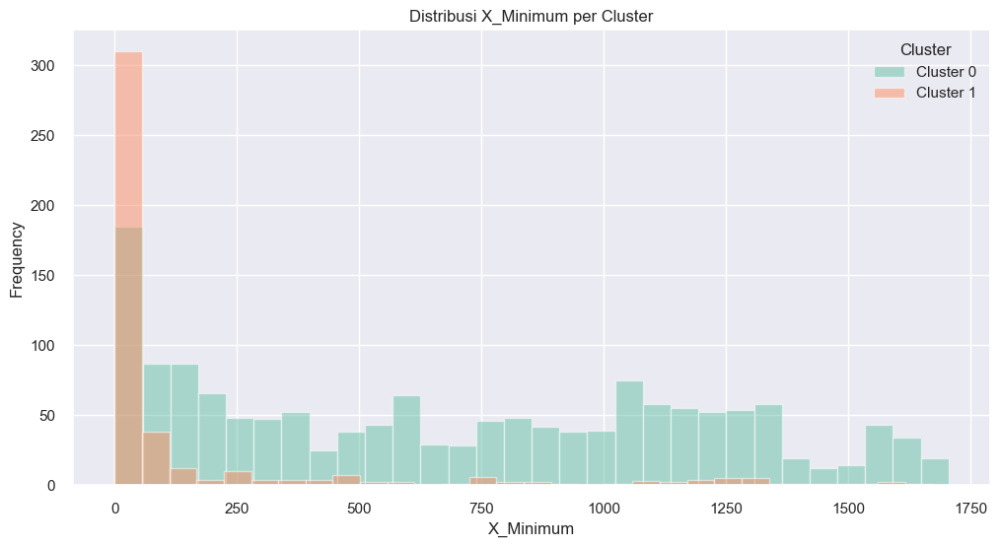

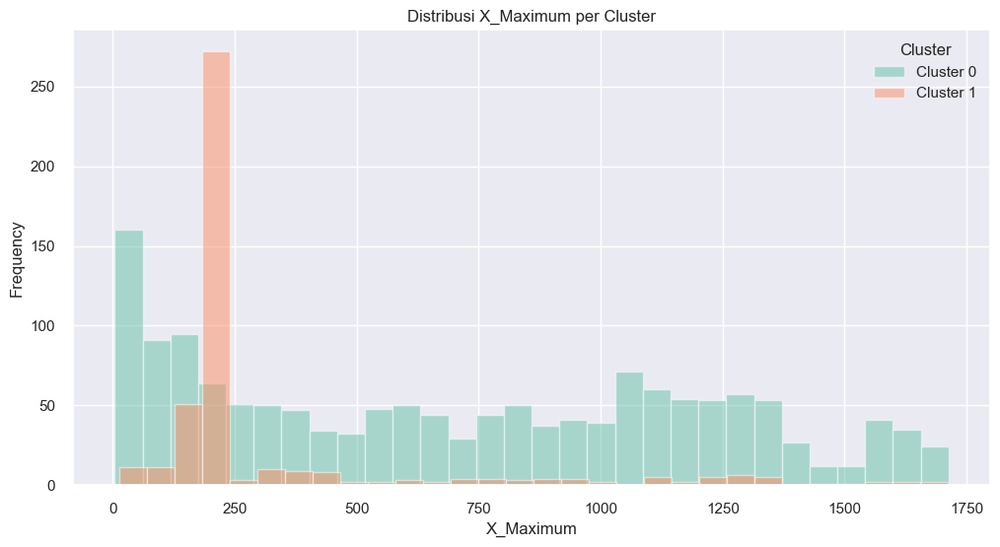

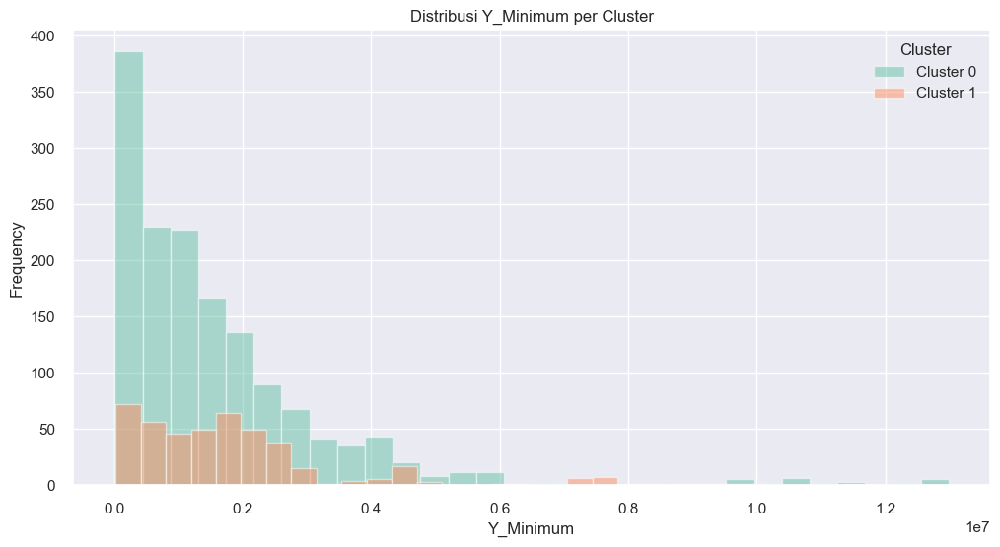

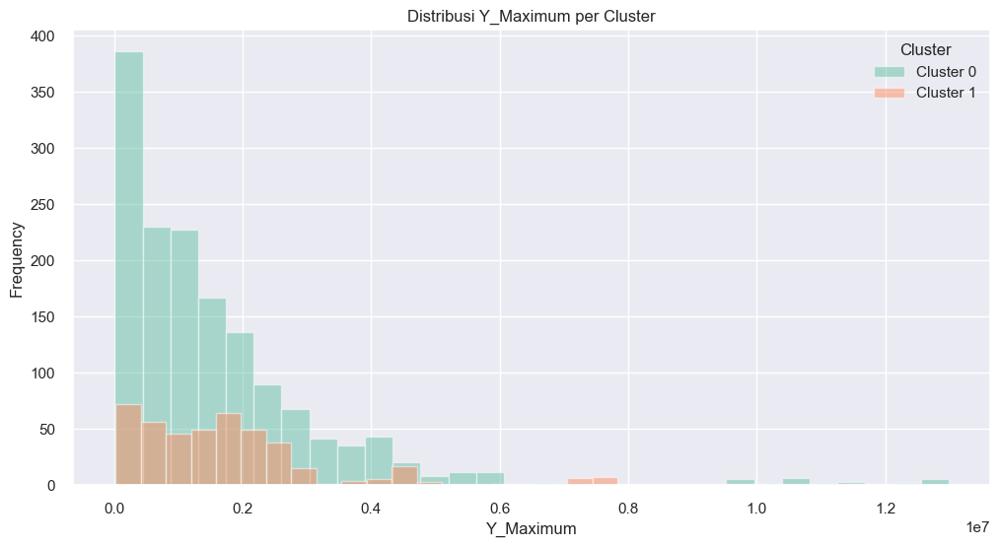

In [ ]:
# Visualisasi histogram untuk location_features  per cluster
location_features = ['X_Minimum', 'X_Maximum', 'Y_Minimum', 'Y_Maximum']  

for feature in location_features:
    plt.figure(figsize=(12, 6))
    
    for cluster in df_clustered['Cluster_Defect'].unique():
        cluster_data = df_clustered[df_clustered['Cluster_Defect'] == cluster][feature]
        plt.hist(cluster_data, bins=30, alpha=0.5, label=f'Cluster {cluster}')
    
    plt.title(f'Distribusi {feature} per Cluster')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend(title='Cluster')
    plt.show()

**Penjelasan:**

- Berdasarkan visualiasi tersebut diketahui bahwa kecacatan besi pada `cluster 0` lebih menyebar secara merata, ini menunjukkan bahwa cacat dalam Cluster 0 lebih sering terjadi di berbagai nilai X_minimum dan X_Maximum dibandingkan pada `cluster 1` yang terjadi pada batas koordinat X tertentu. 

- kecacatan besi baik pada  `cluster 0 dan cluster 1` yang terjadi pada batas koordinat Y tertentu. 


## **7.4 Distribusi Size Features Berdasarkan Cluster**

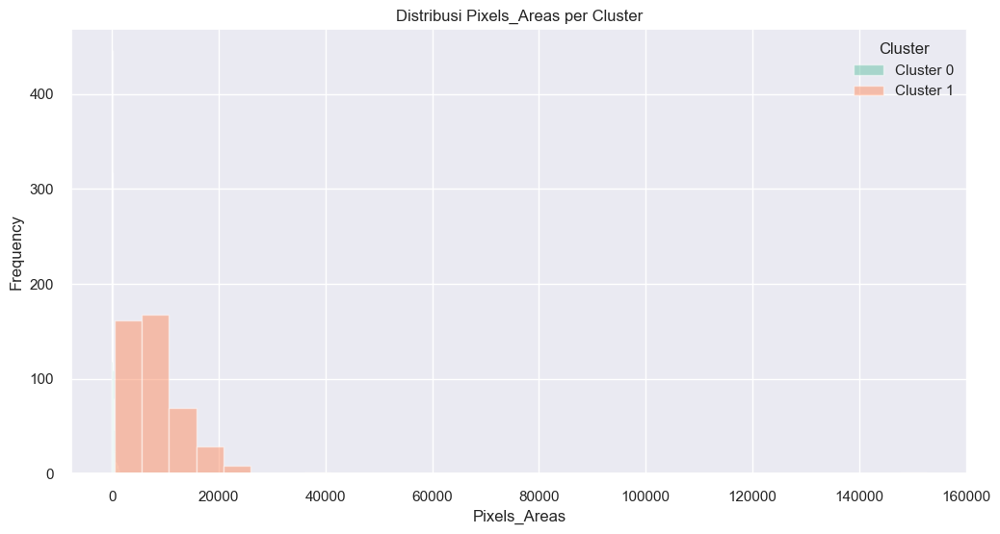

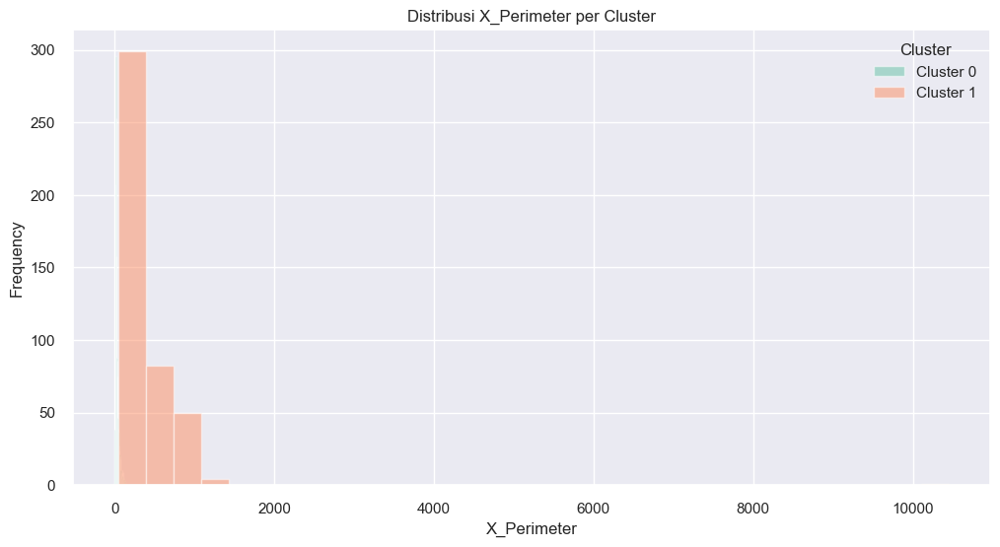

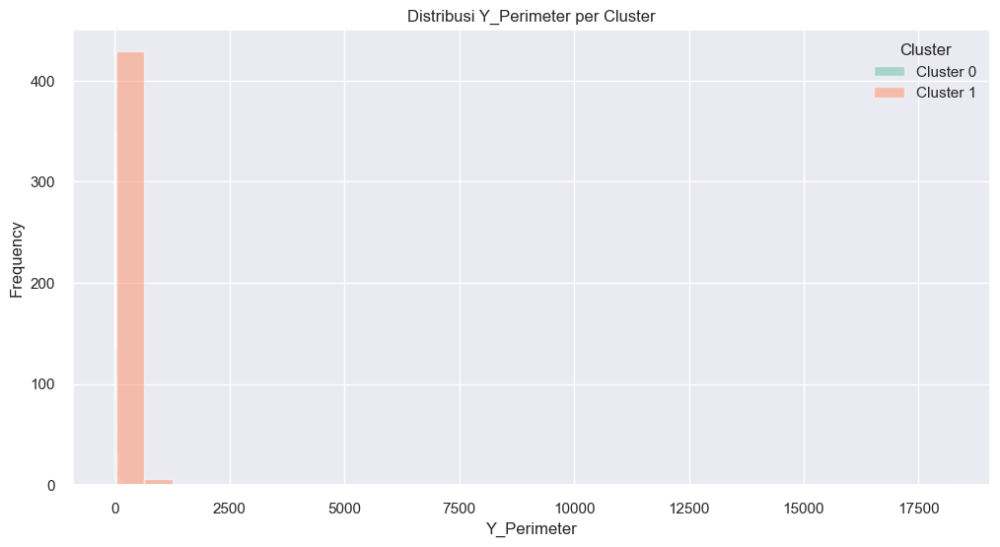

In [ ]:
# Visualisasi histogram untuk size_features  per cluster
size_features = ['Pixels_Areas', 'X_Perimeter', 'Y_Perimeter']

for feature in size_features:
    plt.figure(figsize=(12, 6))
    
    for cluster in df_clustered['Cluster_Defect'].unique():
        cluster_data = df_clustered[df_clustered['Cluster_Defect'] == cluster][feature]
        plt.hist(cluster_data, bins=30, alpha=0.5, label=f'Cluster {cluster}')
    
    plt.title(f'Distribusi {feature} per Cluster')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend(title='Cluster')
    plt.show()

**Penjelasan:**

- Berdasarkan visualiasi tersebut diketahui bahwa Fitur size features yang hanya muncul di `Cluster 1` menunjukkan bahwa kecacatan besi dalam `Cluster 1` memiliki karakteristik ukuran dan bentuk yang unik yang tidak ditemukan di Cluster 0.

## **7.5 Distribusi Luminosity Features Berdasarkan Cluster**

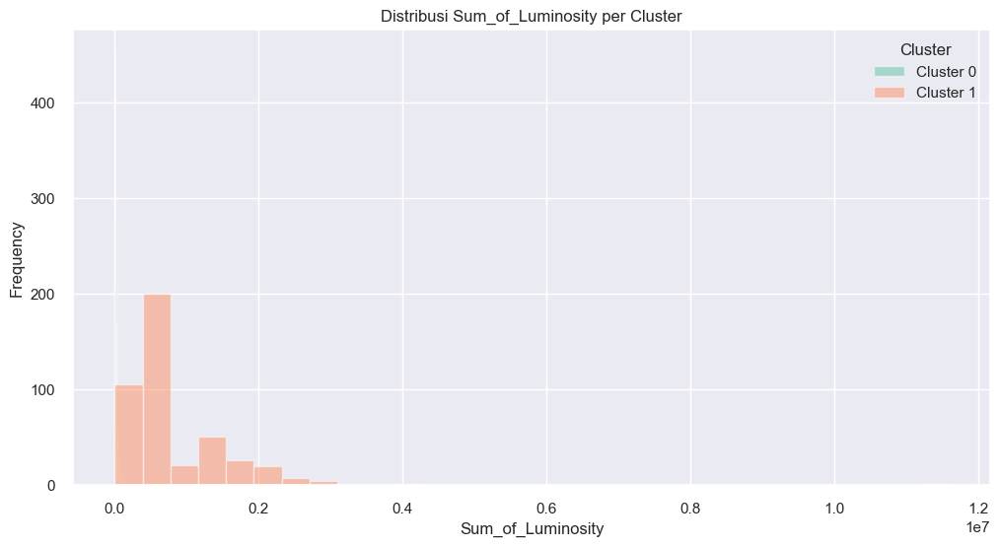

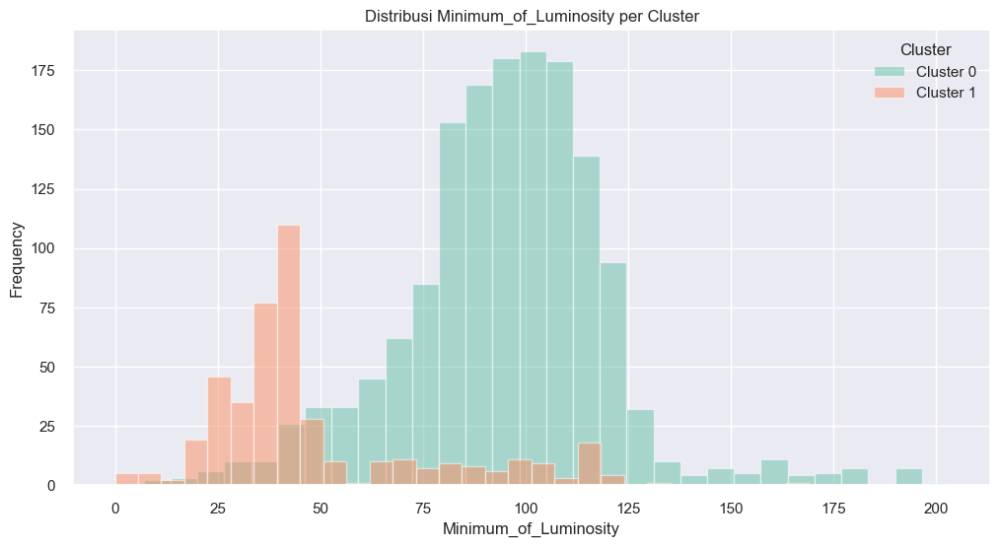

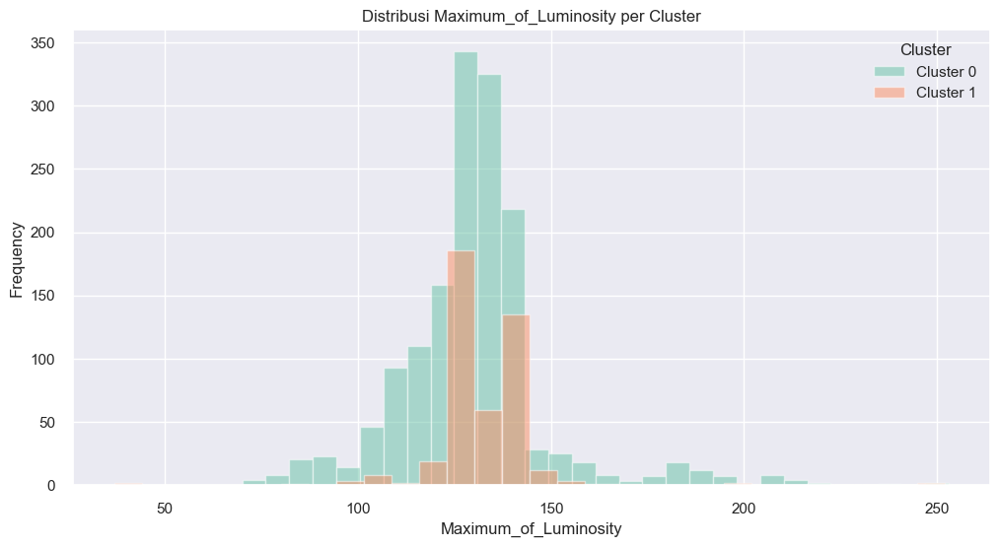

In [ ]:
# Visualisasi histogram untuk luminosity_features  per cluster
luminosity_features = ['Sum_of_Luminosity', 'Minimum_of_Luminosity', 'Maximum_of_Luminosity']

for feature in luminosity_features:
    plt.figure(figsize=(12, 6))
    
    for cluster in df_clustered['Cluster_Defect'].unique():
        cluster_data = df_clustered[df_clustered['Cluster_Defect'] == cluster][feature]
        plt.hist(cluster_data, bins=30, alpha=0.5, label=f'Cluster {cluster}')
    
    plt.title(f'Distribusi {feature} per Cluster')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend(title='Cluster')
    plt.show()

**Penjelasan:**

- Berdasarkan visualiasi tersebut diketahui bahwa Fitur `Sum of Luminosity` yang hanya muncul di `Cluster 1` menunjukkan bahwa kecacatan besi dalam `Cluster 1` memiliki karakteristik ukuran dan bentuk yang unik yang tidak ditemukan di Cluster 0.

- Diketahui bahwa fitur `Minimum_of_Luminosity dan Maximum_of_Luminosity`tersebar merata baik pada cluster 0 dan cluster 1.


## **7.6 Distribusi Material Index Features Berdasarkan Cluster**

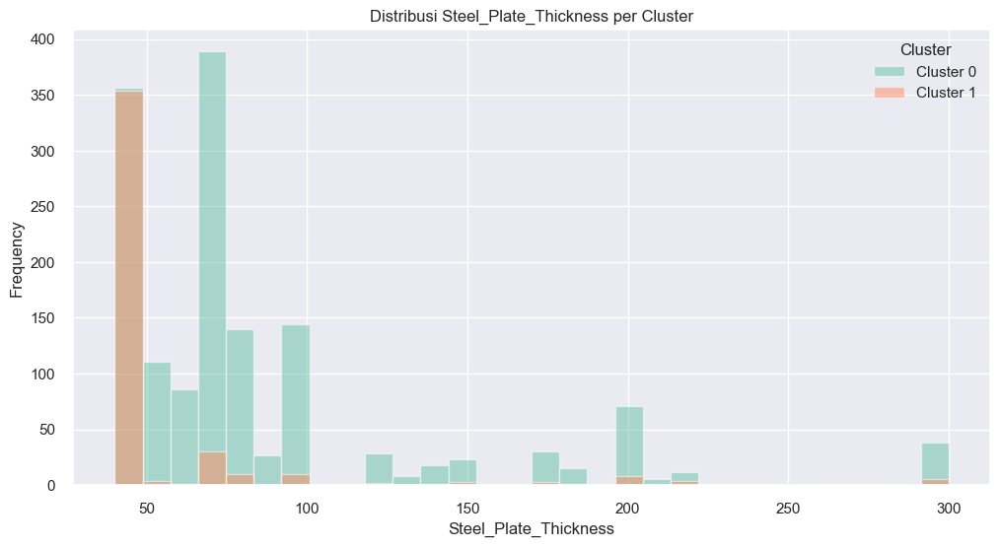

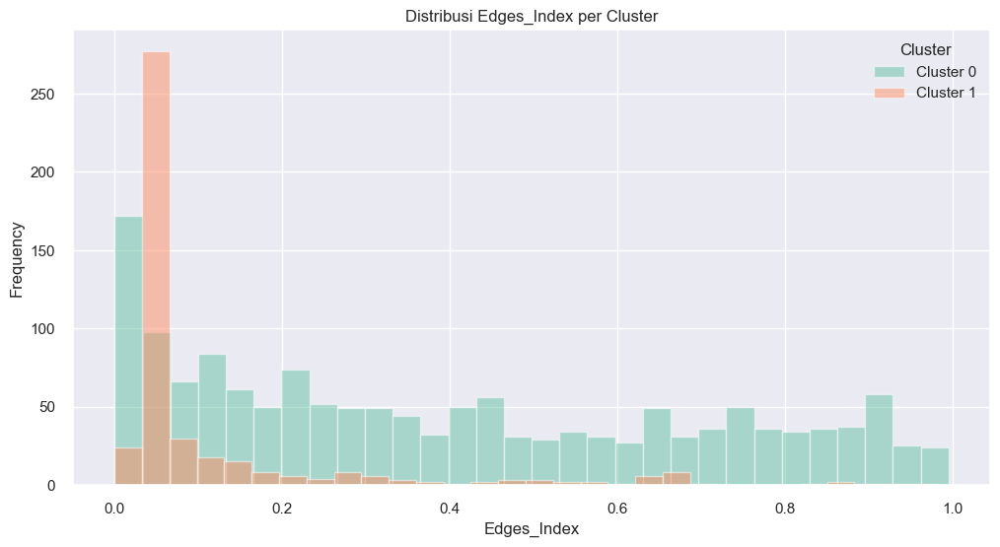

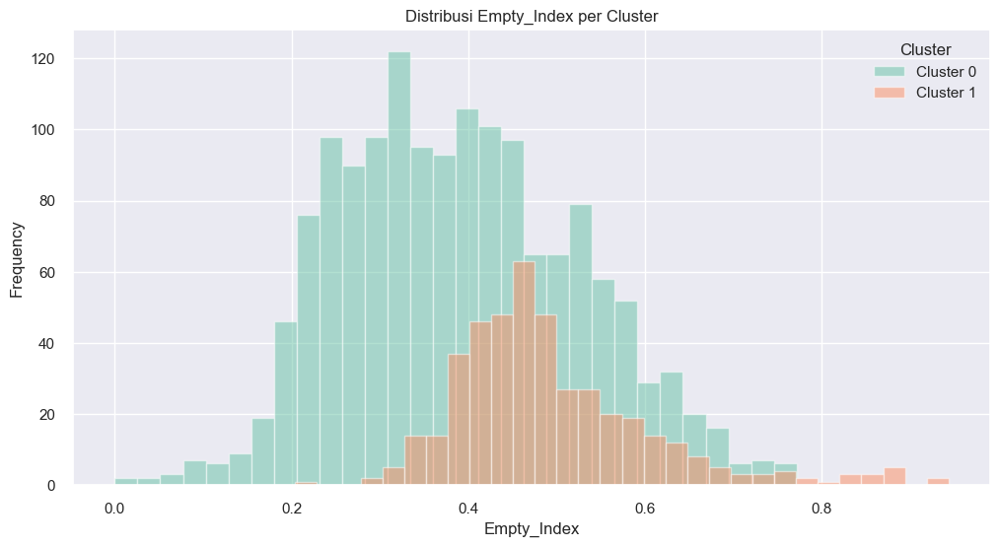

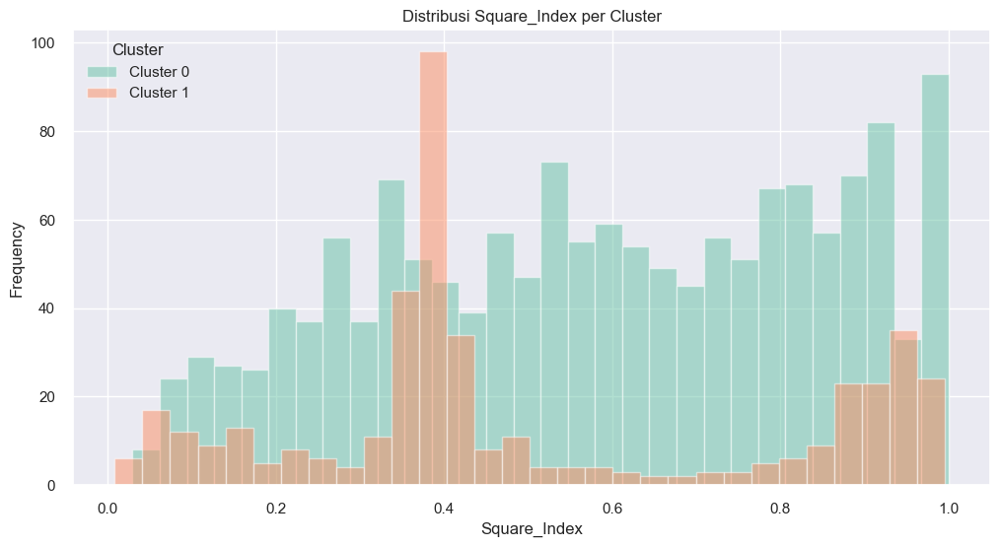

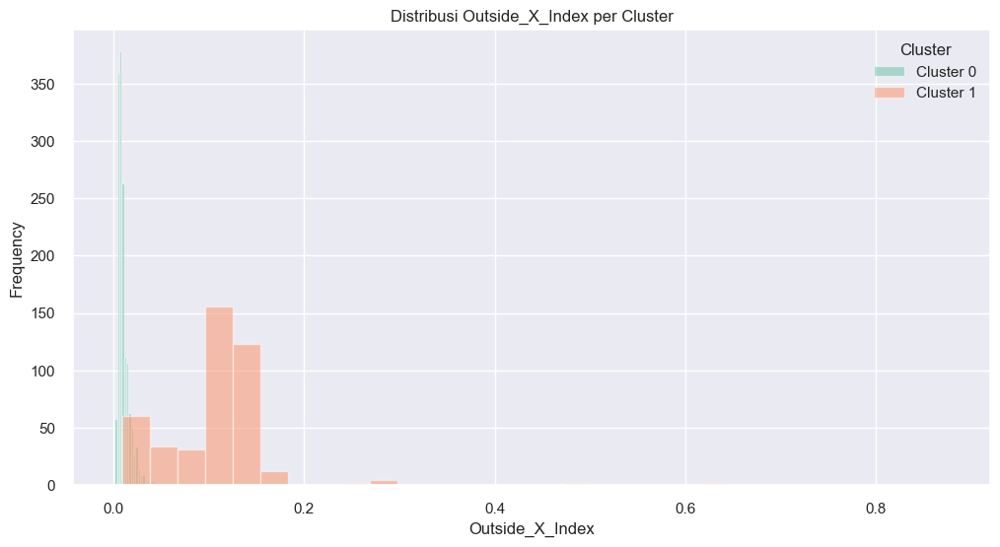

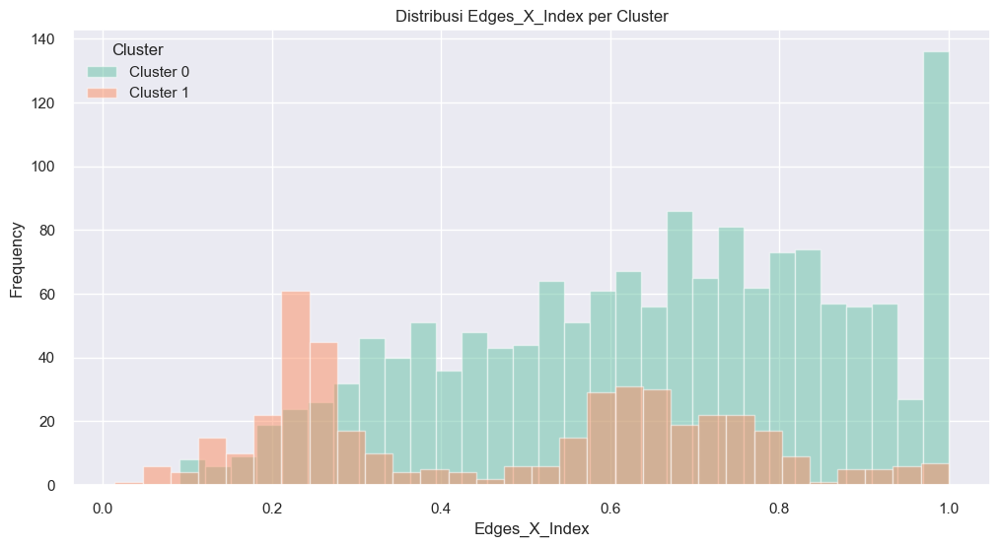

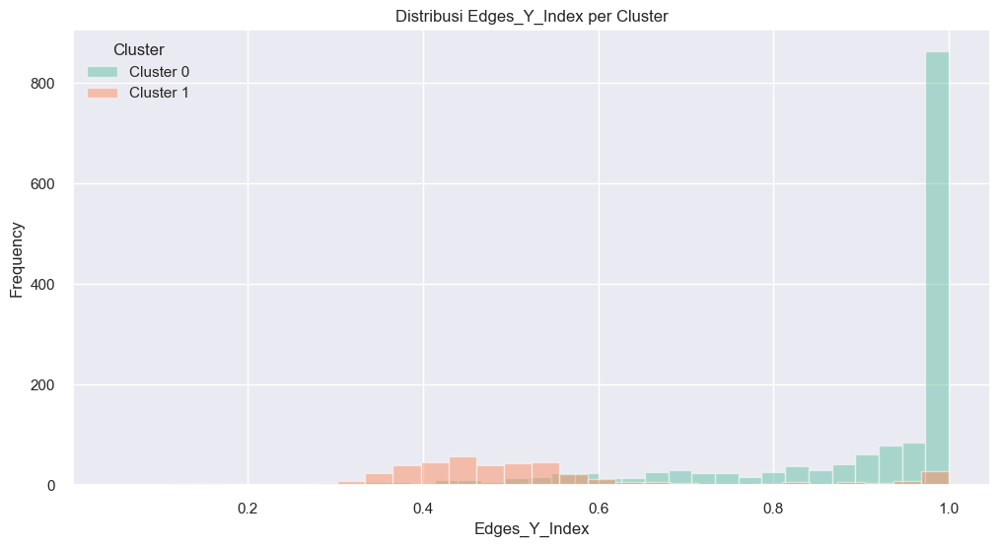

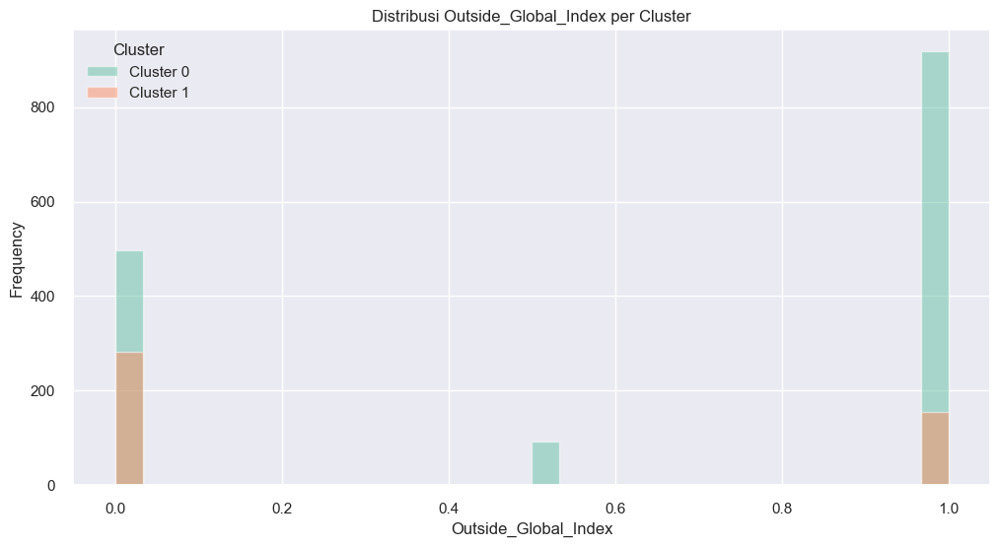

In [ ]:
# Visualisasi histogram untuk material_index_features  per cluster
material_index_features = [
                        'Steel_Plate_Thickness', 'Edges_Index', 'Empty_Index',
                        'Square_Index', 'Outside_X_Index', 'Edges_X_Index', 'Edges_Y_Index', 'Outside_Global_Index'
                        ]

for feature in material_index_features:
    plt.figure(figsize=(12, 6))
    
    for cluster in df_clustered['Cluster_Defect'].unique():
        cluster_data = df_clustered[df_clustered['Cluster_Defect'] == cluster][feature]
        plt.hist(cluster_data, bins=30, alpha=0.5, label=f'Cluster {cluster}')
    
    plt.title(f'Distribusi {feature} per Cluster')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend(title='Cluster')
    plt.show()

**Penjelasan:**

- Diketahui bahwa fitur `Edges_Index,Empty_Index,Square_Index, dan Edges_X_Index`tersebar merata baik pada cluster 0 dan cluster 1 sedangkan fitur laiinya hanya pada titik tertentu. 

## **7.7 Distribusi Logarithmic Features Berdasarkan Cluster**

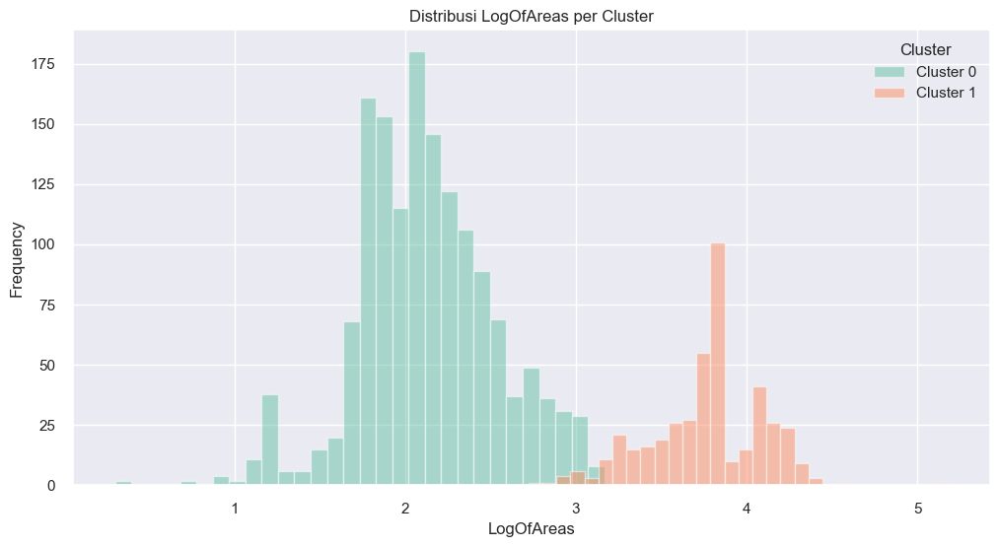

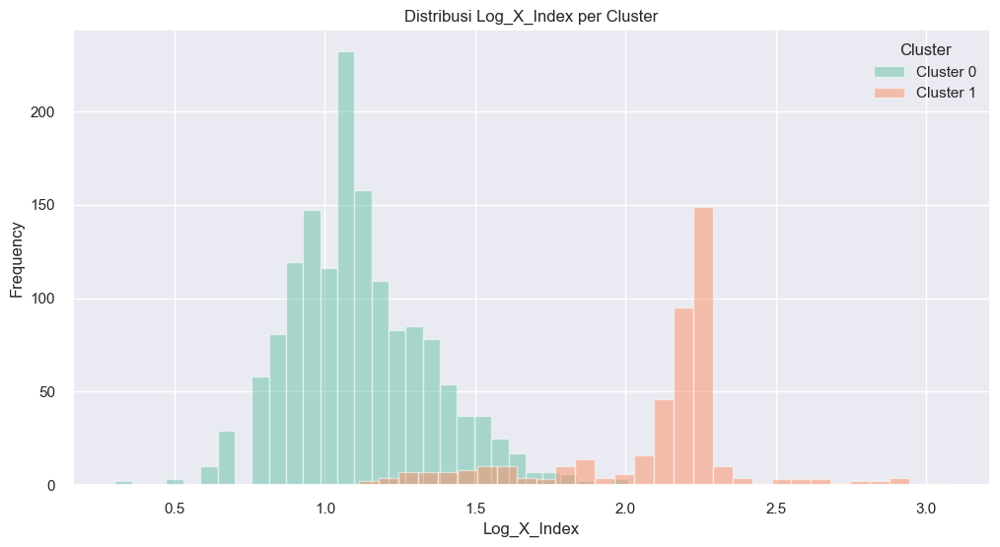

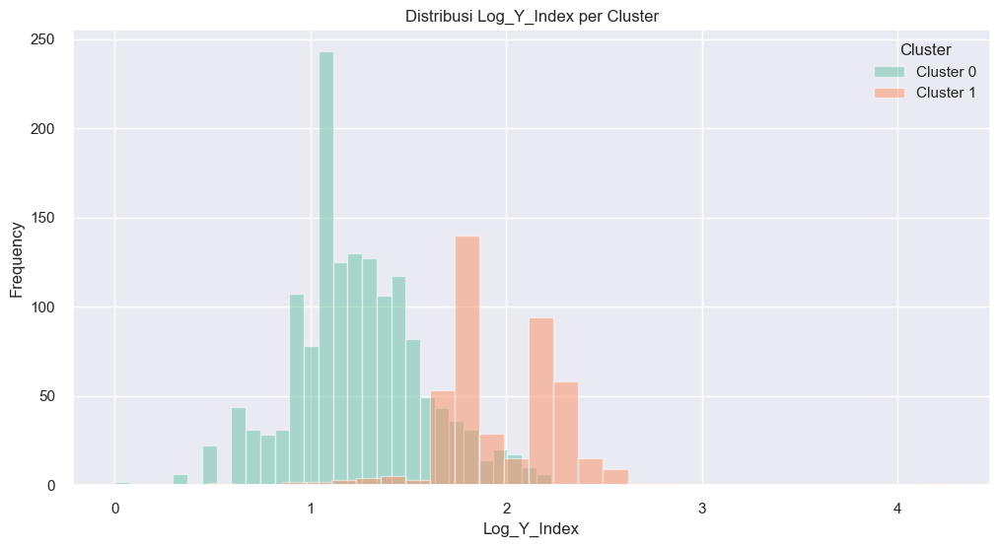

In [ ]:
# Visualisasi histogram untuk logarithmic_features  per cluster
logarithmic_features = ['LogOfAreas', 'Log_X_Index', 'Log_Y_Index']

for feature in logarithmic_features:
    plt.figure(figsize=(12, 6))
    
    for cluster in df_clustered['Cluster_Defect'].unique():
        cluster_data = df_clustered[df_clustered['Cluster_Defect'] == cluster][feature]
        plt.hist(cluster_data, bins=30, alpha=0.5, label=f'Cluster {cluster}')
    
    plt.title(f'Distribusi {feature} per Cluster')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend(title='Cluster')
    plt.show()

**Penjelasan:**

- Diketahui bahwa fitur tersebar merata baik pada cluster 0 dan cluster 1 

## **7.8 Distribusi Statistical Features Berdasarkan Cluster**

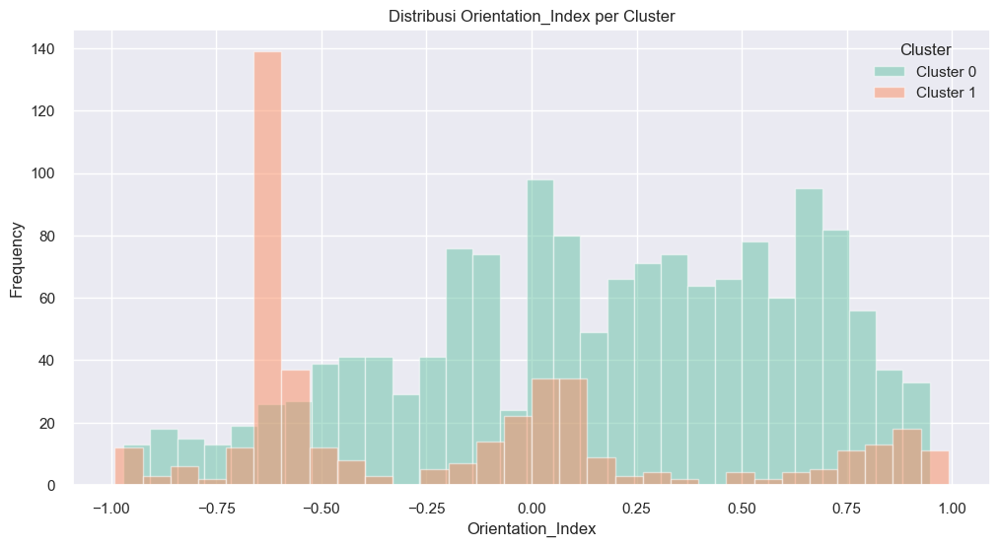

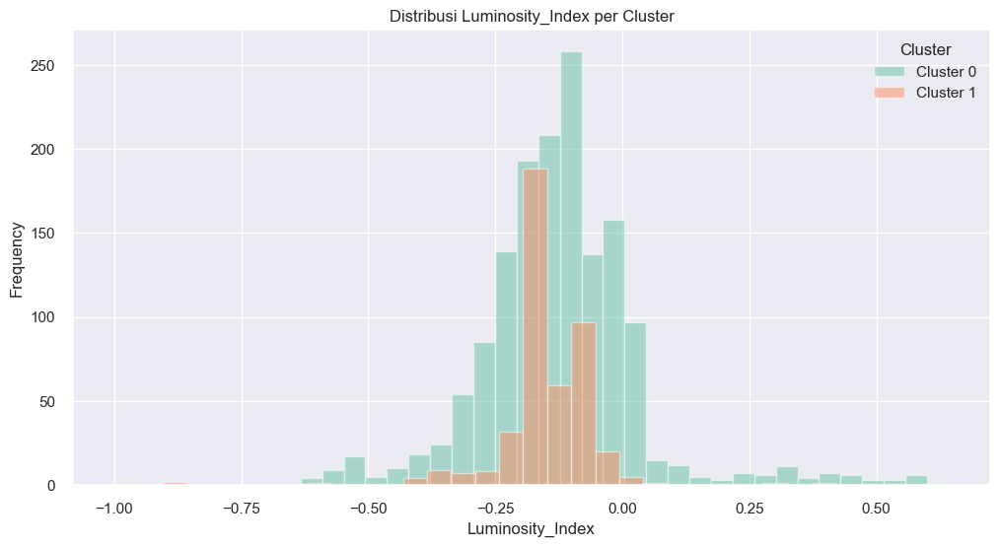

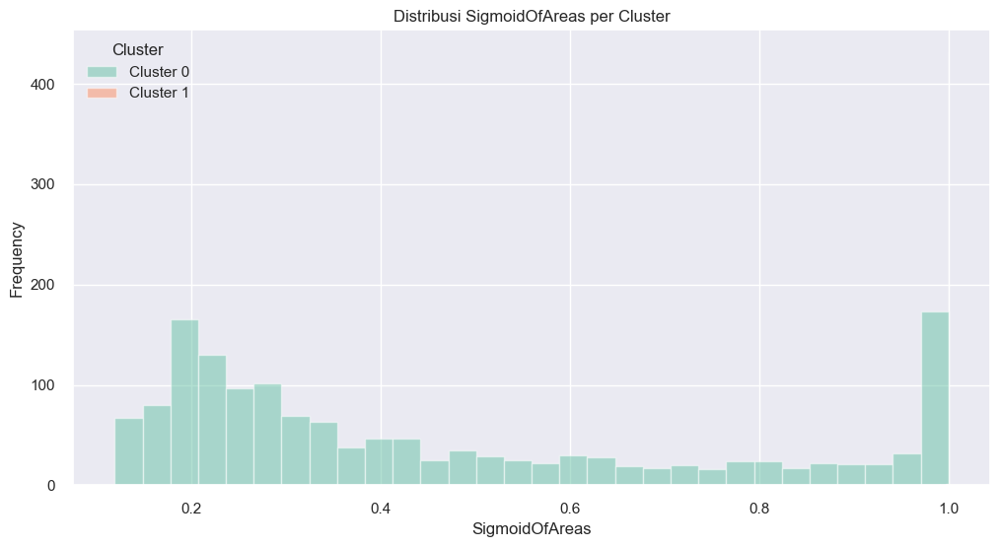

In [ ]:
# Visualisasi histogram untuk statistical_features  per cluster
statistical_features = ['Orientation_Index', 'Luminosity_Index', 'SigmoidOfAreas']

for feature in statistical_features:
    plt.figure(figsize=(12, 6))
    
    for cluster in df_clustered['Cluster_Defect'].unique():
        cluster_data = df_clustered[df_clustered['Cluster_Defect'] == cluster][feature]
        plt.hist(cluster_data, bins=30, alpha=0.5, label=f'Cluster {cluster}')
    
    plt.title(f'Distribusi {feature} per Cluster')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend(title='Cluster')
    plt.show()

**Penjelasan:**

- Diketahui bahwa fitur `Orientation_Index dan Luminosity_Index` tersebar merata baik pada cluster 0 dan cluster 1 sedangkan fitur SigmoidOfAreas hanya hanya muncul di `Cluster 0` menunjukkan bahwa kecacatan besi dalam `Cluster 0` memiliki karakteristik ukuran dan bentuk yang unik yang tidak ditemukan di Cluster 1. 

## **7.8 Distribusi Jenis Tipe Baja Berdasarkan Cluster**

In [75]:
# Menghitung jumlah sampel dalam tiap cluster
cluster_counts = df_clustered['Cluster_Defect'].value_counts()

# Menghitung distribusi TypeOfSteel_A300 untuk setiap cluster
distribution_A300 = df_clustered.groupby('Cluster_Defect')['TypeOfSteel_A300'].sum()

# Menghitung distribusi TypeOfSteel_A400 untuk untuk setiap cluster
distribution_A400 = df_clustered.groupby('Cluster_Defect')['TypeOfSteel_A400'].sum()

# Menampilkan hasil
print(f"Distribusi Type Of Steel A300 berdasarkan cluster:\n{distribution_A300}")
print(f"\nDistribusi Type Of Steel A400 berdasarkan cluster:\n{distribution_A400}")

# Menghitung persentase dari total sampel dalam cluster:
percentage_A300 = (distribution_A300 / cluster_counts) * 100
percentage_A400 = (distribution_A400 / cluster_counts) * 100

print(f"\nPersentase Type Of Steel A300 berdasarkan cluster:\n{percentage_A300}")
print(f"\nPersentase Type Of Steel A400 berdasarkan cluster:\n{percentage_A400}")

Distribusi Type Of Steel A300 berdasarkan cluster:
Cluster_Defect
0    731
1     46
Name: TypeOfSteel_A300, dtype: int64

Distribusi Type Of Steel A400 berdasarkan cluster:
Cluster_Defect
0    774
1    390
Name: TypeOfSteel_A400, dtype: int64

Persentase Type Of Steel A300 berdasarkan cluster:
Cluster_Defect
0    48.571429
1    10.550459
dtype: float64

Persentase Type Of Steel A400 berdasarkan cluster:
Cluster_Defect
0    51.428571
1    89.449541
dtype: float64


**Penjelasan:**

- Diketahui bahwa distribusi `tipe baja A300` lebih banyak pada `cluster 0` sebanyak 731 baja dibandingkan pada `cluster 1` sebanyak 46 baja sedangkan `tipe baja A400` juga lebih banyak pada lebih banyak pada `cluster 0` sebanyak 774 baja dibandingkan pada `cluster 1` sebanyak 390 baja

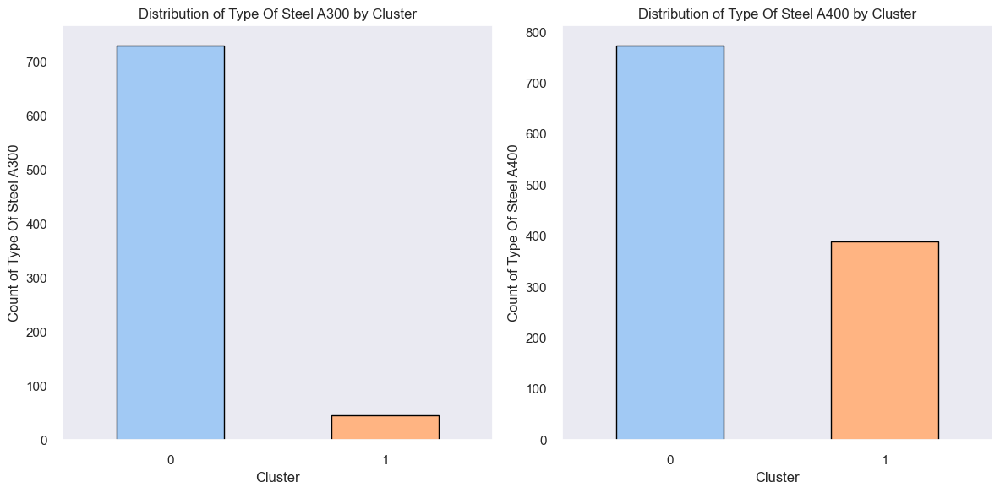

In [86]:
# Visualisasi distribusi Type Of Steel A300
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
distribution_A300.plot(kind='bar', color=custom_palette, edgecolor = 'black')
plt.title('Distribution of Type Of Steel A300 by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count of Type Of Steel A300')
plt.xticks(rotation=0)
plt.grid(False)

# Visualisasi distribusi Type Of Steel A400
plt.subplot(1, 2, 2)
distribution_A400.plot(kind='bar', color=custom_palette, edgecolor = 'black')
plt.title('Distribution of Type Of Steel A400 by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count of Type Of Steel A400')
plt.xticks(rotation=0)

plt.grid(False)
plt.tight_layout()
plt.show()



## **7.9 Distribusi Jenis Kecacatan Baja Berdasarkan Cluster**

In [82]:
# Menghitung distribusi untuk fitur berdasarkan cluster
features = ['Pastry', 'Z_Scratch', 'K_Scatch', 'Stains', 'Dirtiness', 'Bumps', 'Other_Faults']

# Menghitung total jumlah untuk setiap fitur dalam setiap cluster
distribution_features = df_clustered.groupby('Cluster_Defect')[features].sum()

# Menampilkan hasil
print("Distribusi fitur berdasarkan cluster:")
display(distribution_features)


Distribusi fitur berdasarkan cluster:


,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults
Cluster_Defect,,,,,,,
0,145,172,59,72,54,394,609
1,13,18,332,0,1,8,64


**Penjelasan:**

Berdasarkan hasil analisis tersebut, diketahui bahwa:

- Pada Cluster 0, paling banyak terjadi jenis kecacatan lainnya `(Other Faults)` dan jenis kecacatan `Dirtiness` merupakan jenis kecacatan baja yang paling sedikit terjadi pada cluster ini

- Pada Cluster 1, jenis kecacatan baja yang paling banyak terjadi yaitu `K scatch` sedangkan pada cluster ini tidak ada jenis kecacatan `Stains`


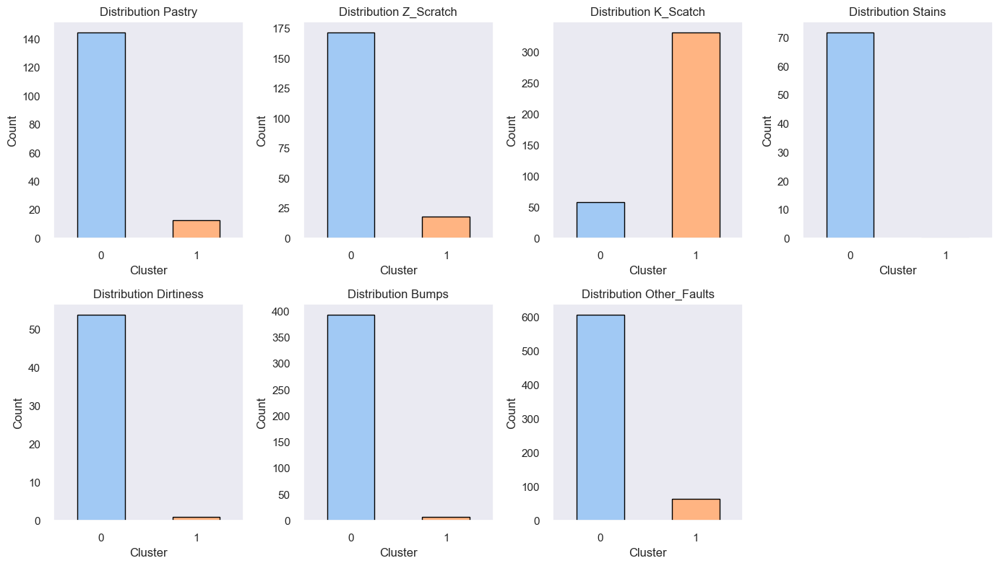

In [87]:
# Visualisasi distribusi jenis kecacatan baja
plt.figure(figsize=(14, 8))

# Menggunakan loop untuk membuat subplot untuk setiap jenis kecacatan baja
for i, feature in enumerate(features):
    plt.subplot(2, 4, i + 1)
    distribution_features[feature].plot(kind='bar', color=custom_palette, edgecolor='black')
    plt.title(f'Distribution {feature}')
    plt.xlabel('Cluster')
    plt.ylabel('Count')
    plt.xticks(rotation=0)
    plt.grid(False)

plt.tight_layout()
plt.show()


**Penjelasan:**

Berdasarkan hasil analisis tersebut, diketahui bahwa:

- Jenis kecacatan baja `Pastry` lebih banyak terjadi pada cluster 0 sebanyak 145 baja dibandingkan pada cluster 1 sebanyak 13 baja.

- Jenis kecacatan baja `Z Scratch` lebih banyak terjadi pada cluster 0 sebanyak 172 baja dibandingkan pada cluster 1 sebanyak 18 baja.

- Jenis kecacatan baja `K Scratch` lebih banyak terjadi pada cluster 1 sebanyak 332 baja dibandingkan pada cluster 0 sebanyak 59 baja.

- Jenis kecacatan baja `Stains` lebih banyak terjadi pada cluster 0 sebanyak 72 baja dan tidak ada jenis kecacatan baja ini pada cluster 1.

- Jenis kecacatan baja `Dirtiness` lebih banyak terjadi pada cluster 0 sebanyak 54 baja dibandingkan pada cluster 1 sebanyak 1 baja.

- Jenis kecacatan baja `Bumps` lebih banyak terjadi pada cluster 0 sebanyak 394 baja dibandingkan pada cluster 1 sebanyak 8 baja.

- Jenis kecacatan baja `Other_Faults` lebih banyak terjadi pada cluster 0 sebanyak 609 baja dibandingkan pada cluster 1 sebanyak 64 baja.




In [88]:
# Menggabungkan DataFrame berdasarkan urutan baris
df_final = pd.concat([df_clustered, df_combined_correlation_results], axis=1)


In [89]:
# Simpan ke dalam CSV
df_final.to_csv('df_final_results.csv', index=False)


# **8. Model Saving**

Digunakan untuk menyimpan model yang telah dilatih untuk digunakan kembali di masa depan tanpa perlu melatih ulang.

In [90]:
with open('list_cols.txt', 'w') as file_1:
  json.dump(list(df_cleaned.columns), file_1)

with open('scaler.pkl', 'wb') as file_2:
  pickle.dump(scaler, file_2)

with open('pca.pkl', 'wb') as file_3:
    pickle.dump(pca, file_3)

with open('model_kmeans.pkl', 'wb') as file_4:
  pickle.dump(model_kmeans, file_4)

# **9. Model Inference**

- Digunakan untuk menggunakan model yang telah dilatih untuk membuat prediksi atau mengklasifikasikan data baru.

- Model ini ada di file `Model_Inference.ipynb`

# **10. Conclusion**

### **10.1 Model Analysis**  

- Model analisis yang digunakan yaitu `K-Means` dengan jumlah cluster sebanyak 2 cluster. Langkah yang dilakukan sebelum melakukan pemodelan cluster, yaitu dataset dilakukan `cleaning data, yaitu membuang kolom yang tidak berkontribusi dalam analisis dan  menghandle outlier dengan metode capping. 

- Langkah selanjutnya yaitu feature selection dengan `hopkins statistic` untuk menentukan apakah data memiliki pola cluster atau data nya tersebar kemudian di lakukan scaling dengan `RobustScaling` dan sebelum masuk kedalam model definition dilakukan `Principal Component Analysis (PCA)` untuk mereduksi dimensi yang sangat berguna dalam model clustering.

- Pada proses `PCA` memutuskan untuk mempertahankan informasi sebesar 85% dengan jumlah komponen sebanyak 7 komponen dan nilai `Silhouette Score` sebesar 0.48.

- Selanjutnya melakukan `Elbow Method dan Silhoutte Score& Plot` untuk menentukan jumlah cluster yang optimal dan menetapkan bahwa `2 cluster` merupakan jumlah cluster yang optimal. 

- `Silhouette Score` pada n_cluster = 2 memiliki score paling tinggi dibandingkan n_cluster lainnya, yaitu sebesar 0.48. Meskipun nilai berada sekitar 0 yang artinya data dalam cluster tidak terlalu terkelompok dengan jelas dan berdasarkan silhoutte plot, distribusi setiap cluster memiliki proposi yang tidak seimbang.

- `Davies-Bouldin Score` pada n_cluster = 2 sebesar 0.77 menunjukkan bahwa cluster cukup terpisah dengan baik satu sama lain. Meskipun semakin rendah nilai nya atau mendekati nilai 0 yang menunjukkan cluster lebih terpisah satu sama lain dengan baik.




- Secara keseluruhan, hasil clustering ini cukup baik berdasarkan Davies-Bouldin Score, namun dapat ditingkatkan berdasarkan Silhouette Score dengan mencoba beberapa hal untuk memperbaiki clustering, seperti:

  - a. Melakukan pra-pemrosesan data yang lebih baik, seperti mencoba metode scaling yang lain, sperti MinMax atau RobustScaling. Selain itu dapat mencoba mempertahankan lebih banyak informasi dan kemudian secara bertahap menguranginya sambil terus memantau efeknya pada hasil clustering dan kompleksitas model pada proses PCA.
  
  - b. Menguji jumlah cluster yang berbeda.

  - c. Meningkatkan jumlah iterasi maksimum dalam algoritma K-Means untuk memastikan konvergensi yang lebih baik.

  - d. Menggunakan metode clustering yang berbeda.

- Selain itu, untuk menentukan jumlah cluster yang optimal dapat menggunakan metode evaluasi yang lain, selain menggunakan metode elbow dan silhoutte score. 

### **10.2 Exploratory Data Analysis (EDA) Insight**  

**Secara garis besar dapat diketahui bahwa**:

- Dataset ini menunjukkan variasi yang signifikan dalam fitur-fitur. Distribusi yang skewed menunjukkan adanya beberapa pelat baja dengan ukuran atau karakteristik yang ekstrem.

- Jenis kecacatan baja paling banyak pada jenis kecacatan lainya `(Other Fault)` sebanyak 673 baja dan paling sedikit jenis kecacatan baja `Dirtiness` sebanyak 55 baja. 

- Proporsi pelat baja paling banyak pada jenis A400 sebanyak 1164 baja dibandingkan jenis A300 sebanyak 777 baja. 

- Jenis kecatatan lebih banyak terjadi pada jenis baja A400 dan jenis kecacatan yang lebih banyak terjadi yaitu jenis kecacatan lainnya `(Other Fault)` dibandingkan jenis cacat `Stains` atau area yang berubah warna pada permukaan pelat baja. 

- Tipe baja A300 dan A400 memiliki hubungan yang signifikan dengan jenis kecacatan baja, diantaranya yaitu `Pastry, Z Scratch, K Scratch, Stains, Dirtness dan Bumps ` sedangkan jenis kecacatan lainnya `(Other Faults)` tidak memiliki hubungan dengan tipe baja A300

- Fitur `X_Minimum`, `X_Maximum`, `Pixels_Areas`, `X_Perimeter`, dan `Sum_of_Luminosity` memiliki hubungan secara konsisten dengan jenis kecacatan. Ini menunjukkan bahwa fitur tersebut adalah indikator utama untuk banyak jenis kecacatan.

- Secara garis besar, seluruh fitur memiliki hubungan dengan beberapa jenis kecacatan baja.


### **10.3 Exploratory Data Analysis (EDA) Clustering Insight**  

- Cluster 0 adalah cluster yang lebih umum, dengan 77,5% dari seluruh data cacat baja masuk ke dalam cluster ini dan mencakup berbagai jenis cacat yang sering terjadi serta tersebar luas secara geografis pada pelat baja.

- Cluster 1 adalah cluster yang lebih spesifik, dengan karakteristik yang lebih unik terkait ukuran, bentuk, dan luminositas, serta cenderung mencakup cacat yang lebih jarang tetapi lebih khas, seperti K Scratch.



### **10.4 Business Recommendations**  

Berikut rekomendasi bisnis dari EDA Insight, sebagai berikut:

- Adanya fitur-fitur yang memiliki distribusi skewed menunjukkan variasi dalam ukuran dan kualitas pelat baja yang di produksi. Hal ini menunjukkan beberapa pelat tidak memenuhi standar kualitas tertentu, yang dapat mempengaruhi konsistensi produk. Perlunya peningkatan proses produksi untuk mengurangi variasi dan memastikan lebih banyak produk memenuhi standar yang diinginkan.

- Perusahaan dapat meningkatkan produksi atau persediaan A400 untuk memenuhi permintaan.

- Jenis baja A400 memiliki potensi pasar yang lebih besar, sehingga perusahaan dapat meningkatkan usaha pemasaran atau mengembangkan fitur baru untuk A400.

- Jenis baja A400 memiliki tingkat kecacatan yang paling banyak, hal ini perlu di tinjau kembali proses produksi atau kualitas bahan baku untuk A400. 

- Fitur yang tidak menunjukkan perbedaan signifikan mungkin tidak mempengaruhi jenis kecacatan tertentu secara jelas sehingga perusahaan dapat mengalokasikan sumber daya secara efisien dan mengatasi fitur yang lebih mendesak.

-  Fitur seperti `Steel_Plate_Thickness` dan `LogOfAreas` yang tidak memiliki perbedaan signifikan pada beberapa jenis kecacatan dapat mengurangi kebutuhan untuk inspeksi berlebihan pada fitur tersebut dan di fokuskan pada fitur yang lebih relevan.

- Dapat mengembangkan prosedur pengendalian kualitas yang lebih spesifik berdasarkan fitur yang menunjukkan variasi signifikan.

- Fitur yang tidak menunjukkan perbedaan signifikan mungkin tidak perlu diubah atau diperbaiki dalam desain produk baru.

- Perusahaan dapat fokus pada pemantauan fitur `X_Minimum`, `X_Maximum`, `Pixels_Areas`, `X_Perimeter`, dan `Sum_of_Luminosity` selama proses produksi untuk mendeteksi dan mengatasi kecacatan lebih awal.

- Jenis kecacatan seperti `Dirtiness` dan `Stains` memiliki hubungan dengan ketebalan dan jenis baja, perusahaan dapat memperhatikan material dan desian baja dengan meninjau desain dan spesifikasi produk untuk meningkatkan kualitas.

- Fitur seperti `Edges_Index` dan `Log_X_Index` memiliki hubungan dengan beberapa jenis kecacatan, oleh karena itu perusahaan dapat meningkatkan kualitas yang dapat difokuskan pada pengujian dan pengendalian fitur-fitur ini secara lebih mendetail.

- Berdasarkan fitur-fitur yang signifikan berhubungan dengan setiap jenis kecacatan, perusahaan dapat menyediakan pelatihan khusus bagi karyawan untuk mengenali dan menangani kecacatan dengan lebih efektif.

Berikut rekomendasi bisnis dari Clustering Insight, sebagai berikut:

- Pada `Cluster 0` menunjukkan  bahwa sebagian besar cacat yang terjadi pada pelat baja bersifat umum dan menyebar luas.Hal ini menunjukkan adanya potensi masalah kualitas yang konsisten dalam proses produksi yang perlu segera diatasi. 

- Pada `Cluster 1` menunjukkan bahwa cacat yang lebih jarang tetapi memiliki karakteristik unik, seperti kecacatan ukuran dan bentuk yang spesifik, serta variasi dalam luminositas. Hal ini mungkin ada beberapa produk tertentu mengalami masalah kualitas diakibatkan oleh kondisi spesifik tidak terkendali.

Oleh karena itu, dapat melakukan inspeksi, pelatihan ulang karyawan, dan optimalisasi proses produksi.


